In [ ]:
## Uncomment if you are using Google Collab
#from google.colab import drive
#drive.mount('/content/gdrive')
#import locale
#locale.getpreferredencoding = lambda: "UTF-8"

In [1]:
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import MaxPooling2D, AveragePooling2D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense
from tensorflow.keras import datasets
from tensorflow.keras.losses import SparseCategoricalCrossentropy
from matplotlib import pyplot as plt
from tensorflow.keras.utils import plot_model
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import BatchNormalization

## Getting MNIST Data

In [2]:
(x_train, y_train), (x_test, y_test) = datasets.mnist.load_data()

11490434/11490434 [==============================] - 2s 0us/step


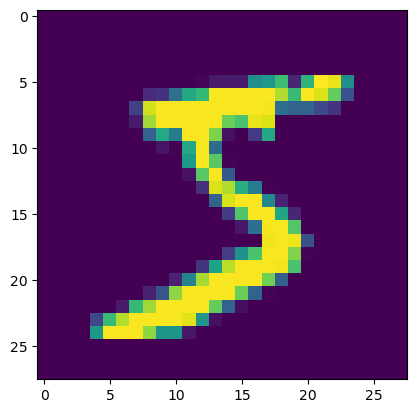

In [3]:
plt.imshow(x_train[0])
plt.show()

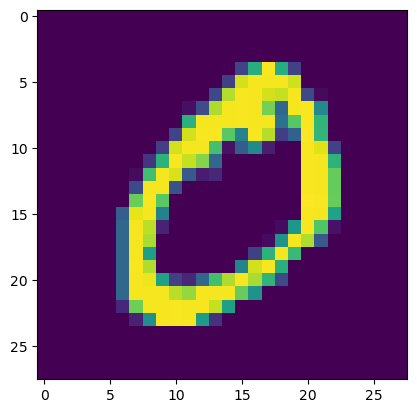

In [4]:
plt.imshow(x_train[1])
plt.show()

In [21]:
28*28

784

In [5]:
## Using MLP 
model = Sequential()
model.add(Flatten())
model.add(Dense(500, activation='relu', input_dim=784))
model.add(Dense(300, activation='relu'))
model.add(Dense(100, activation='relu'))
model.add(Dense(10, activation='softmax'))
model.compile(optimizer='adam', loss=SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

In [7]:
model.build(input_shape=(28,28))

In [8]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten (Flatten)           (28, 28)                  0         
                                                                 
 dense (Dense)               (28, 500)                 14500     
                                                                 
 dense_1 (Dense)             (28, 300)                 150300    
                                                                 
 dense_2 (Dense)             (28, 100)                 30100     
                                                                 
 dense_3 (Dense)             (28, 10)                  1010      
                                                                 
Total params: 195,910
Trainable params: 195,910
Non-trainable params: 0
_________________________________________________________________


In [23]:
model.fit(x_train, y_train, epochs=10, batch_size=32)

Epoch 1/10


2023-07-11 06:37:12.198511: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x5608085df640 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-07-11 06:37:12.198559: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): Tesla V100-SXM2-16GB, Compute Capability 7.0
2023-07-11 06:37:12.198568: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (1): Tesla V100-SXM2-16GB, Compute Capability 7.0
2023-07-11 06:37:12.198575: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (2): Tesla V100-SXM2-16GB, Compute Capability 7.0
2023-07-11 06:37:12.198580: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (3): Tesla V100-SXM2-16GB, Compute Capability 7.0
2023-07-11 06:37:12.289413: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2023-07-11 06:

1875/1875 [==============================] - 10s 3ms/step - loss: 0.9576 - accuracy: 0.9033
Epoch 2/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1792 - accuracy: 0.9516
Epoch 3/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1496 - accuracy: 0.9585
Epoch 4/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1273 - accuracy: 0.9646
Epoch 5/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.1060 - accuracy: 0.9694
Epoch 6/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0974 - accuracy: 0.9738
Epoch 7/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0802 - accuracy: 0.9780
Epoch 8/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0832 - accuracy: 0.9779
Epoch 9/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0705 - accuracy: 0.9813
Epoch 10/10
1875/1875 [==============================] - 5s 3ms/step - loss: 0.0637 - accura

## CNN Model

In [9]:
cnn_model = Sequential()

In [ ]:
## add Convoltion Layer

In [10]:
# Conv2D(filters, kernel_size, strides, activation, input_shape, padding)
cnn_model.add(Conv2D(6, kernel_size=(5,5), strides=(1,1), activation='relu', input_shape=(28,28,1), padding='valid'))

In [11]:
# Pooling Layer
cnn_model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

In [12]:
# Adding One More Conv and maxpool
cnn_model.add(Conv2D(5, kernel_size=(3,3), strides=(1,1), activation='relu', padding='same'))

cnn_model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))

In [13]:
# Flatten
cnn_model.add(Flatten())

In [14]:
# Dense Layer
cnn_model.add(Dense(80, activation='relu'))
cnn_model.add(Dense(10, activation='softmax'))
cnn_model.compile(optimizer='adam', loss=SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

In [15]:
cnn_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 24, 24, 6)         156       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 12, 12, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 5)         275       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 5)          0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 180)               0         
                                                                 
 dense_4 (Dense)             (None, 80)               

In [32]:
cnn_model.fit(x_train, y_train, epochs=20)

Epoch 1/20
1875/1875 [==============================] - 11s 3ms/step - loss: 0.5307 - accuracy: 0.8881
Epoch 2/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.1183 - accuracy: 0.9643
Epoch 3/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0871 - accuracy: 0.9728
Epoch 4/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0735 - accuracy: 0.9770
Epoch 5/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0632 - accuracy: 0.9799
Epoch 6/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0548 - accuracy: 0.9824
Epoch 7/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0510 - accuracy: 0.9836
Epoch 8/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0443 - accuracy: 0.9857
Epoch 9/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.0413 - accuracy: 0.9867
Epoch 10/20
1875/1875 [==============================] - 6s 3ms/step - loss: 0.03

In [33]:
cnn_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 24, 24, 6)         156       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 12, 12, 6)        0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 12, 12, 5)         275       
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 6, 6, 5)          0         
 2D)                                                             
                                                                 
 flatten_1 (Flatten)         (None, 180)               0         
                                                                 
 dense_4 (Dense)             (None, 80)               

In [89]:
## CNN 
## leNet Architecture
##
#Conv2D(filters, kernel_size=(k_rows, k_cols), strides=(r_strides, c_strides), activation=actfunc, input_shape=(rows, cols, 1),padding=padding_type)
# kernel_size could be integer or tuple of numbers
# strides could be integer or tuple of numbers
lenet_model = Sequential()
lenet_model.add(Conv2D(6, kernel_size=(5,5), strides=(1,1), activation='tanh', input_shape=(28,28,1), padding='valid'))
lenet_model.add(AveragePooling2D(pool_size=(2,2)))
lenet_model.add(Conv2D(16, kernel_size=(5,5), strides=(1,1), activation='tanh', padding='valid'))
lenet_model.add(AveragePooling2D(pool_size=(2,2), strides=(2,2), padding='valid'))
lenet_model.add(Conv2D(120, kernel_size=(1,1), strides=(1,1), activation='tanh', padding='valid'))
lenet_model.add(Flatten())
lenet_model.add(Dense(84, activation='tanh'))
lenet_model.add(Dense(10, activation='softmax'))
lenet_model.compile(optimizer='adam', loss=SparseCategoricalCrossentropy(from_logits=False), metrics=['accuracy'])

In [35]:
lenet_model.fit(x_train, y_train, epochs=10)

Epoch 1/10
1875/1875 [==============================] - 9s 4ms/step - loss: 0.3347 - accuracy: 0.8996
Epoch 2/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.3090 - accuracy: 0.9040
Epoch 3/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2845 - accuracy: 0.9111
Epoch 4/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2713 - accuracy: 0.9144
Epoch 5/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2468 - accuracy: 0.9237
Epoch 6/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2394 - accuracy: 0.9248
Epoch 7/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2477 - accuracy: 0.9237
Epoch 8/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2450 - accuracy: 0.9242
Epoch 9/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.2368 - accuracy: 0.9269
Epoch 10/10
1875/1875 [==============================] - 7s 4ms/step - loss: 0.207

In [90]:
lenet_model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 24, 24, 6)         156       
                                                                 
 average_pooling2d_10 (Avera  (None, 12, 12, 6)        0         
 gePooling2D)                                                    
                                                                 
 conv2d_27 (Conv2D)          (None, 8, 8, 16)          2416      
                                                                 
 average_pooling2d_11 (Avera  (None, 4, 4, 16)         0         
 gePooling2D)                                                    
                                                                 
 conv2d_28 (Conv2D)          (None, 4, 4, 120)         2040      
                                                                 
 flatten_7 (Flatten)         (None, 1920)            

In [ ]:
!scp '/content/gdrive/My Drive/DeepLearning-Class/kaggle.json' /root/.kaggle/

In [26]:
!kaggle datasets download -d shaunthesheep/microsoft-catsvsdogs-dataset

100%|███████████████████████████████████████▊| 784M/788M [00:10<00:00, 96.0MB/s]
100%|████████████████████████████████████████| 788M/788M [00:11<00:00, 74.2MB/s]


In [27]:
!kaggle datasets download -d ashishjangra27/face-mask-12k-images-dataset

 99%|███████████████████████████████████████▍| 326M/330M [00:08<00:00, 54.7MB/s]
100%|████████████████████████████████████████| 330M/330M [00:08<00:00, 42.1MB/s]


In [28]:
!unzip face-mask-12k-images-dataset.zip

Archive:  face-mask-12k-images-dataset.zip
  inflating: Face Mask Dataset/Test/WithMask/1163.png  
  inflating: Face Mask Dataset/Test/WithMask/1174.png  
  inflating: Face Mask Dataset/Test/WithMask/1175.png  
  inflating: Face Mask Dataset/Test/WithMask/1203.png  
  inflating: Face Mask Dataset/Test/WithMask/1361.png  
  inflating: Face Mask Dataset/Test/WithMask/1362.png  
  inflating: Face Mask Dataset/Test/WithMask/1363.png  
  inflating: Face Mask Dataset/Test/WithMask/1388.png  
  inflating: Face Mask Dataset/Test/WithMask/1389.png  
  inflating: Face Mask Dataset/Test/WithMask/1404.png  
  inflating: Face Mask Dataset/Test/WithMask/1405.png  
  inflating: Face Mask Dataset/Test/WithMask/1407.png  
  inflating: Face Mask Dataset/Test/WithMask/1413.png  
  inflating: Face Mask Dataset/Test/WithMask/1439.png  
  inflating: Face Mask Dataset/Test/WithMask/147.png  
  inflating: Face Mask Dataset/Test/WithMask/152.png  
  inflating: Face Mask Dataset/Test/WithMask/153.png  
  inflat

  inflating: Face Mask Dataset/Test/WithMask/Augmented_423_5573198.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_427_5858648.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_428_1598598.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_430_1476011.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_432_321017.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_433_46994.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_434_7331768.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_434_8719736.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_434_955774.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_440_5403192.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_443_9987555.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_445_1389312.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_445_7982531.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_

  inflating: Face Mask Dataset/Test/WithMask/Augmented_696_9874270.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_697_3351776.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_698_2753022.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_699_7879059.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_6_4264821.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_701_7344076.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_707_8340153.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_708_8762628.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_709_3873803.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_710_1583284.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_713_2498193.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_71_9889238.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_722_742669.png  
  inflating: Face Mask Dataset/Test/WithMask/Augmented_

  inflating: Face Mask Dataset/Test/WithoutMask/1598.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1605.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1606.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1607.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1611.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1612.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1613.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1639.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1766.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1767.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1772.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1773.png  
  inflating: Face Mask Dataset/Test/WithoutMask/178.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1798.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1799.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1808.png  
  inflating: Face Mask Dataset/Test/WithoutMask/1809.png 

  inflating: Face Mask Dataset/Test/WithoutMask/351.png  
  inflating: Face Mask Dataset/Test/WithoutMask/352.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3548.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3549.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3560.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3561.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3562.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3574.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3575.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3576.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3602.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3603.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3616.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3617.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3748.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3760.png  
  inflating: Face Mask Dataset/Test/WithoutMask/3762.png  

  inflating: Face Mask Dataset/Test/WithoutMask/5298.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5299.png  
  inflating: Face Mask Dataset/Test/WithoutMask/53.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5305.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5306.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5307.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5311.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5312.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5313.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5339.png  
  inflating: Face Mask Dataset/Test/WithoutMask/542.png  
  inflating: Face Mask Dataset/Test/WithoutMask/543.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5448.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5449.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5461.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5463.png  
  inflating: Face Mask Dataset/Test/WithoutMask/5474.png  
 

  inflating: Face Mask Dataset/Train/WithMask/1145.png  
  inflating: Face Mask Dataset/Train/WithMask/1146.png  
  inflating: Face Mask Dataset/Train/WithMask/115.png  
  inflating: Face Mask Dataset/Train/WithMask/1151.png  
  inflating: Face Mask Dataset/Train/WithMask/1153.png  
  inflating: Face Mask Dataset/Train/WithMask/1154.png  
  inflating: Face Mask Dataset/Train/WithMask/1155.png  
  inflating: Face Mask Dataset/Train/WithMask/1157.png  
  inflating: Face Mask Dataset/Train/WithMask/1158.png  
  inflating: Face Mask Dataset/Train/WithMask/1159.png  
  inflating: Face Mask Dataset/Train/WithMask/1164.png  
  inflating: Face Mask Dataset/Train/WithMask/1167.png  
  inflating: Face Mask Dataset/Train/WithMask/117.png  
  inflating: Face Mask Dataset/Train/WithMask/1171.png  
  inflating: Face Mask Dataset/Train/WithMask/1173.png  
  inflating: Face Mask Dataset/Train/WithMask/1178.png  
  inflating: Face Mask Dataset/Train/WithMask/1179.png  
  inflating: Face Mask Dataset/Tr

  inflating: Face Mask Dataset/Train/WithMask/1704.png  
  inflating: Face Mask Dataset/Train/WithMask/1706.png  
  inflating: Face Mask Dataset/Train/WithMask/171.png  
  inflating: Face Mask Dataset/Train/WithMask/1711.png  
  inflating: Face Mask Dataset/Train/WithMask/1712.png  
  inflating: Face Mask Dataset/Train/WithMask/1713.png  
  inflating: Face Mask Dataset/Train/WithMask/1718.png  
  inflating: Face Mask Dataset/Train/WithMask/1719.png  
  inflating: Face Mask Dataset/Train/WithMask/1720.png  
  inflating: Face Mask Dataset/Train/WithMask/1722.png  
  inflating: Face Mask Dataset/Train/WithMask/1723.png  
  inflating: Face Mask Dataset/Train/WithMask/1724.png  
  inflating: Face Mask Dataset/Train/WithMask/1725.png  
  inflating: Face Mask Dataset/Train/WithMask/1726.png  
  inflating: Face Mask Dataset/Train/WithMask/1727.png  
  inflating: Face Mask Dataset/Train/WithMask/1728.png  
  inflating: Face Mask Dataset/Train/WithMask/1729.png  
  inflating: Face Mask Dataset/T

  inflating: Face Mask Dataset/Train/WithMask/528.png  
  inflating: Face Mask Dataset/Train/WithMask/529.png  
  inflating: Face Mask Dataset/Train/WithMask/532.png  
  inflating: Face Mask Dataset/Train/WithMask/537.png  
  inflating: Face Mask Dataset/Train/WithMask/547.png  
  inflating: Face Mask Dataset/Train/WithMask/548.png  
  inflating: Face Mask Dataset/Train/WithMask/549.png  
  inflating: Face Mask Dataset/Train/WithMask/55.png  
  inflating: Face Mask Dataset/Train/WithMask/559.png  
  inflating: Face Mask Dataset/Train/WithMask/560.png  
  inflating: Face Mask Dataset/Train/WithMask/561.png  
  inflating: Face Mask Dataset/Train/WithMask/562.png  
  inflating: Face Mask Dataset/Train/WithMask/570.png  
  inflating: Face Mask Dataset/Train/WithMask/573.png  
  inflating: Face Mask Dataset/Train/WithMask/578.png  
  inflating: Face Mask Dataset/Train/WithMask/584.png  
  inflating: Face Mask Dataset/Train/WithMask/585.png  
  inflating: Face Mask Dataset/Train/WithMask/588

  inflating: Face Mask Dataset/Train/WithMask/Augmented_103_5868261.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_103_7449421.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_103_8219782.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_104_265600.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_104_4420306.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_104_6044175.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_104_8318278.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_105_187606.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_105_5209858.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_105_5456160.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_106_1657442.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_106_2470251.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_106_5947589.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_129_7974032.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_129_8420896.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_12_1120574.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_12_2426904.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_12_4481397.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_12_5699005.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_12_8559362.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_130_1378196.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_130_4523111.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_130_8130609.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_130_8469519.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_130_934402.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_131_3782235.png  
  inflating: Face Mask Dataset/Train/WithMas

  inflating: Face Mask Dataset/Train/WithMask/Augmented_152_3104458.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_152_6235836.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_152_6932890.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_152_911686.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_152_9503415.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_153_3441598.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_153_6511400.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_153_928455.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_154_1675731.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_154_2609759.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_154_2784261.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_154_4469620.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_154_5319432.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_179_9069839.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_17_1531696.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_17_5041317.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_17_8171386.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_17_9948104.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_17_9955005.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_180_1773040.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_180_5473614.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_180_5526809.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_181_4379751.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_181_7026520.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_181_7230544.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_181_9478914.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithMask/Augmented_204_4022122.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_204_6182663.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_1479399.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_7294700.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_830990.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_8315487.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_8739621.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_205_9533095.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_206_6063975.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_206_6583715.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_206_9692916.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_207_6122117.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_207_620835.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_22_3652560.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_22_4832355.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_22_5535197.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_22_7814468.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_22_8086942.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_230_4311078.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_230_4498571.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_230_6204206.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_230_8614011.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_231_1634009.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_231_3534008.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_231_6911641.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_231_6945054.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithMask/Augmented_255_1841227.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_255_1929978.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_255_6349594.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_255_7259607.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_255_9885221.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_1059359.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_3748003.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_3759986.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_6450371.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_7190765.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_256_8821360.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_257_1839445.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_257_2222184.png  
  inflating: Face Mask Dataset/Train/W

  inflating: Face Mask Dataset/Train/WithMask/Augmented_278_3938116.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_278_5407321.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_278_8162609.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_279_1586970.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_279_1756605.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_279_3106669.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_279_5616748.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_279_7277778.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_27_1285812.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_27_3059542.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_27_3194377.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_27_4186385.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_27_4682884.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithMask/Augmented_303_880630.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_304_3246336.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_304_3499163.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_304_5073210.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_304_8575095.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_305_2432399.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_305_2577968.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_305_7112722.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_305_8392736.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_305_9030409.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_306_3734767.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_306_4193479.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_306_8038157.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_331_997186.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_332_5586599.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_332_6206159.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_332_7578567.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_332_871501.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_332_9214890.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_2342851.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_3341288.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_5895752.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_6404235.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_7262978.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_333_7411793.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_334_2290343.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_35_7996957.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_35_8421825.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_360_4125918.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_360_608191.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_360_7689788.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_361_1428702.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_361_6161630.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_361_8285414.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_361_835953.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_361_8626784.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_362_2770068.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_362_6126913.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_362_6612217.png  
  inflating: Face Mask Dataset/Train/WithM

  inflating: Face Mask Dataset/Train/WithMask/Augmented_384_58849.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_384_7663438.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_384_9540754.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_384_989507.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_198218.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_2435270.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_4220660.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_5871115.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_5907059.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_385_857823.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_386_32845.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_386_3694319.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_386_7812853.png  
  inflating: Face Mask Dataset/Train/WithMask

  inflating: Face Mask Dataset/Train/WithMask/Augmented_409_6184604.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_409_8424333.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_409_9025621.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_40_3894868.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_40_4317989.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_40_5980704.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_40_9396189.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_40_9517848.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_410_1446214.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_410_2972021.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_410_5662215.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_410_6168289.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_410_7714560.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithMask/Augmented_432_6931764.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_432_733478.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_432_8002718.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_433_1205397.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_433_676299.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_433_7878630.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_433_828744.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_433_9423540.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_434_4870732.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_434_619700.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_434_8880153.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_435_2057747.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_435_3098489.png  
  inflating: Face Mask Dataset/Train/WithM

  inflating: Face Mask Dataset/Train/WithMask/Augmented_463_4312135.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_463_6745388.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_463_7057593.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_463_8491416.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_2565204.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_4332196.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_444095.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_5760607.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_5962108.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_464_8538173.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_465_132803.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_465_2030244.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_465_3089704.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_487_6038537.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_487_6327104.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_487_6548620.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_488_2282225.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_488_3255270.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_488_3971566.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_488_8045159.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_488_8172872.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_489_2791152.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_489_4461895.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_489_5024297.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_489_5490511.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_489_6470525.png  
  inflating: Face Mask Dataset/Train/W

  inflating: Face Mask Dataset/Train/WithMask/Augmented_50_3080297.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_50_771835.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_510_5008481.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_510_5137337.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_510_5775632.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_510_9164830.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_510_9294101.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_511_2265856.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_511_2668716.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_511_6366882.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_511_6940217.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_512_3993588.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_512_4161482.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_537_4874843.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_538_118595.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_538_4702099.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_538_5155471.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_538_9007427.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_538_9231787.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_539_2588437.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_539_5445033.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_539_6697761.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_539_7752492.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_539_8931443.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_53_2141740.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_53_3294477.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_566_6056558.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_566_6110467.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_566_7700443.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_566_7919583.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_567_3586453.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_567_6270413.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_567_8517007.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_568_4958852.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_568_5940997.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_568_6449480.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_568_6879669.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_568_8983923.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_569_176828.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_591_4334888.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_591_5369595.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_591_7147261.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_591_9823963.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_592_1632399.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_592_4272184.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_592_439557.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_592_6498261.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_592_8158320.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_593_1304443.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_593_4261376.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_593_8597972.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_593_8781891.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_613_708254.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_613_7419255.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_613_7963524.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_613_8599801.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_613_8602187.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_614_2006826.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_614_5379589.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_614_88892.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_614_9594888.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_614_9684359.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_615_1370883.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_615_2527259.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_615_9964361.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_636_1709450.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_636_4274722.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_636_6450703.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_636_8936002.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_636_9149773.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_1756918.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_2150444.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_231163.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_8246018.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_8998205.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_637_9485929.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_638_2716039.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_638_5747264.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_659_3736072.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_659_4493872.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_659_8187931.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_65_1274166.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_65_2713940.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_65_4196566.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_660_7549047.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_660_7842577.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_660_8292302.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_660_8489933.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_661_2541878.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_661_3185478.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_661_4480922.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_685_929566.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_686_1423519.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_686_3884790.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_686_4149942.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_686_4430301.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_686_451814.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_687_2666298.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_687_312486.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_687_5530903.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_687_7681306.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_688_1151331.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_688_6398186.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_688_6537609.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_70_3171105.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_70_4025572.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_70_9899618.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_70_992524.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_710_3343513.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_710_4547071.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_710_7558423.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_710_8731287.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_710_8998272.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_711_1846651.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_711_4196992.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_711_4406856.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_711_4553705.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithMask/Augmented_735_8276203.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_736_1012081.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_736_5525424.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_736_6436075.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_736_8114969.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_736_837962.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_737_3204556.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_737_5963303.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_737_7103049.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_737_9776900.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_737_9968970.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_738_1999837.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_738_7308366.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_760_8791506.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_760_9999709.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_761_2090271.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_761_4664312.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_761_675988.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_761_7100765.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_761_9009360.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_1505768.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_2502169.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_602599.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_6399224.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_6655341.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_762_8687779.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_785_2566558.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_785_2654232.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_785_4818120.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_785_8373640.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_786_1161.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_786_2682155.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_786_4891175.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_786_9296259.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_786_9643100.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_787_3999435.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_787_8165338.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_787_8213806.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_788_3031029.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithMask/Augmented_811_305672.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_811_4536525.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_811_5146977.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_811_7007721.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_811_7241724.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_812_1241489.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_812_7313660.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_812_7476383.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_812_8350244.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_812_8566076.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_813_1284870.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_813_2689568.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_813_6261067.png  
  inflating: Face Mask Dataset/Train/Wi

  inflating: Face Mask Dataset/Train/WithMask/Augmented_839_70206.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_839_7259402.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_839_7554730.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_839_966677.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_83_5475526.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_83_7960526.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_83_8532163.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_83_9795186.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_840_1720516.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_840_7012491.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_840_9805321.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_841_293879.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_841_4526145.png  
  inflating: Face Mask Dataset/Train/WithMask/

  inflating: Face Mask Dataset/Train/WithMask/Augmented_864_4309242.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_864_454220.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_864_5802089.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_864_6190024.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_1930196.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_2079750.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_557628.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_6720732.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_7340499.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_865_8894940.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_866_1100988.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_866_2714492.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_866_5404836.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithMask/Augmented_891_7390311.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_891_8783603.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_3033555.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_5475294.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_5821437.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_6563203.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_7263043.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_892_9810001.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_89_1964957.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_89_4951361.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_89_7550972.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_89_8459808.png  
  inflating: Face Mask Dataset/Train/WithMask/Augmented_89_8931851.png  
  inflating: Face Mask Dataset/Train/WithMa

  inflating: Face Mask Dataset/Train/WithoutMask/1088.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1089.png  
  inflating: Face Mask Dataset/Train/WithoutMask/109.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1090.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1092.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1093.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1094.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1095.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1096.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1097.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1098.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1099.png  
  inflating: Face Mask Dataset/Train/WithoutMask/11.png  
  inflating: Face Mask Dataset/Train/WithoutMask/110.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1100.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1101.png  
  inflating: Face Mask Dataset/Train/Without

  inflating: Face Mask Dataset/Train/WithoutMask/127.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1270.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1271.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1272.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1273.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1274.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1275.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1276.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1277.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1278.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1279.png  
  inflating: Face Mask Dataset/Train/WithoutMask/128.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1280.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1281.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1282.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1283.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/1460.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1461.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1462.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1463.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1464.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1465.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1466.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1467.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1468.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1469.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1470.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1471.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1472.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1473.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1474.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1475.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithoutMask/1644.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1645.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1646.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1647.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1648.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1649.png  
  inflating: Face Mask Dataset/Train/WithoutMask/165.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1650.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1651.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1652.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1653.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1654.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1655.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1656.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1657.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1658.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/1815.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1816.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1817.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1818.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1819.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1824.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1825.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1826.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1828.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1829.png  
  inflating: Face Mask Dataset/Train/WithoutMask/183.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1830.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1831.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1832.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1838.png  
  inflating: Face Mask Dataset/Train/WithoutMask/1839.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/2008.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2009.png  
  inflating: Face Mask Dataset/Train/WithoutMask/201.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2010.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2011.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2012.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2013.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2014.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2015.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2016.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2017.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2018.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2019.png  
  inflating: Face Mask Dataset/Train/WithoutMask/202.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2020.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2021.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/22.png  
  inflating: Face Mask Dataset/Train/WithoutMask/220.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2200.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2201.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2202.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2203.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2204.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2205.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2206.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2207.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2208.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2209.png  
  inflating: Face Mask Dataset/Train/WithoutMask/221.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2210.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2211.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2212.png  
  inflating: Face Mask Dataset/Train/Without

  inflating: Face Mask Dataset/Train/WithoutMask/2395.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2396.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2397.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2398.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2399.png  
  inflating: Face Mask Dataset/Train/WithoutMask/24.png  
  inflating: Face Mask Dataset/Train/WithoutMask/240.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2400.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2401.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2402.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2403.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2404.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2405.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2406.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2407.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2408.png  
  inflating: Face Mask Dataset/Train/Withou

  inflating: Face Mask Dataset/Train/WithoutMask/2582.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2583.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2584.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2585.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2586.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2587.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2588.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2589.png  
  inflating: Face Mask Dataset/Train/WithoutMask/259.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2590.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2591.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2592.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2593.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2594.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2595.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2596.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/2770.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2771.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2772.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2773.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2774.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2775.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2776.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2777.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2778.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2779.png  
  inflating: Face Mask Dataset/Train/WithoutMask/278.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2780.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2781.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2782.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2783.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2784.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/2950.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2951.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2952.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2953.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2954.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2955.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2956.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2957.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2958.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2959.png  
  inflating: Face Mask Dataset/Train/WithoutMask/296.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2960.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2961.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2962.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2963.png  
  inflating: Face Mask Dataset/Train/WithoutMask/2964.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/3115.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3116.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3117.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3118.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3119.png  
  inflating: Face Mask Dataset/Train/WithoutMask/312.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3120.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3121.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3122.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3123.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3124.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3125.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3126.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3127.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3128.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3129.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/3296.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3297.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3298.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3299.png  
  inflating: Face Mask Dataset/Train/WithoutMask/33.png  
  inflating: Face Mask Dataset/Train/WithoutMask/330.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3300.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3301.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3302.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3303.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3304.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3305.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3306.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3307.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3308.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3309.png  
  inflating: Face Mask Dataset/Train/Withou

  inflating: Face Mask Dataset/Train/WithoutMask/3484.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3485.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3486.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3487.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3488.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3489.png  
  inflating: Face Mask Dataset/Train/WithoutMask/349.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3490.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3491.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3492.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3493.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3494.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3495.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3496.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3497.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3498.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/367.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3670.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3672.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3673.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3674.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3675.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3676.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3677.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3679.png  
  inflating: Face Mask Dataset/Train/WithoutMask/368.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3680.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3681.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3682.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3683.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3684.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3685.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/3856.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3857.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3858.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3859.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3860.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3861.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3862.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3863.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3864.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3865.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3866.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3867.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3868.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3869.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3870.png  
  inflating: Face Mask Dataset/Train/WithoutMask/3871.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithoutMask/4055.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4056.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4057.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4058.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4059.png  
  inflating: Face Mask Dataset/Train/WithoutMask/406.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4060.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4061.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4062.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4063.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4064.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4065.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4066.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4067.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4068.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4069.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/4250.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4251.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4252.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4253.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4254.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4255.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4256.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4257.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4258.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4259.png  
  inflating: Face Mask Dataset/Train/WithoutMask/426.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4260.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4261.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4262.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4263.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4264.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/4440.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4441.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4442.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4443.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4444.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4445.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4446.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4448.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4449.png  
  inflating: Face Mask Dataset/Train/WithoutMask/445.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4450.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4451.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4452.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4453.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4454.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4455.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/4627.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4628.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4629.png  
  inflating: Face Mask Dataset/Train/WithoutMask/463.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4630.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4631.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4632.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4633.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4638.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4639.png  
  inflating: Face Mask Dataset/Train/WithoutMask/464.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4640.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4641.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4642.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4643.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4644.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/4815.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4816.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4818.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4819.png  
  inflating: Face Mask Dataset/Train/WithoutMask/482.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4820.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4821.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4822.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4823.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4824.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4825.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4826.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4827.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4828.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4829.png  
  inflating: Face Mask Dataset/Train/WithoutMask/483.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/499.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4990.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4991.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4992.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4993.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4994.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4995.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4996.png  
  inflating: Face Mask Dataset/Train/WithoutMask/4997.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5.png  
  inflating: Face Mask Dataset/Train/WithoutMask/500.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5000.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5001.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5002.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5003.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5005.png  
  inflating: Face Mask Dataset/Train/WithoutM

  inflating: Face Mask Dataset/Train/WithoutMask/5172.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5173.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5174.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5175.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5176.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5178.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5179.png  
  inflating: Face Mask Dataset/Train/WithoutMask/518.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5180.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5181.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5182.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5183.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5184.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5185.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5186.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5187.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/5350.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5351.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5352.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5353.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5354.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5355.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5356.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5357.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5358.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5359.png  
  inflating: Face Mask Dataset/Train/WithoutMask/536.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5360.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5361.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5362.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5363.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5364.png  
  inflating: Face Mask Dataset/Train/With

  inflating: Face Mask Dataset/Train/WithoutMask/5539.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5540.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5541.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5542.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5543.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5544.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5545.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5546.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5547.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5548.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5549.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5550.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5551.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5552.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5553.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5554.png  
  inflating: Face Mask Dataset/Train/Wit

  inflating: Face Mask Dataset/Train/WithoutMask/5724.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5725.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5726.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5727.png  
  inflating: Face Mask Dataset/Train/WithoutMask/573.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5730.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5731.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5732.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5733.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5734.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5735.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5736.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5737.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5739.png  
  inflating: Face Mask Dataset/Train/WithoutMask/574.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5740.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/5912.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5913.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5914.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5915.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5916.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5917.png  
  inflating: Face Mask Dataset/Train/WithoutMask/592.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5920.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5921.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5922.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5928.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5929.png  
  inflating: Face Mask Dataset/Train/WithoutMask/593.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5932.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5934.png  
  inflating: Face Mask Dataset/Train/WithoutMask/5935.png  
  inflating: Face Mask Dataset/Train/Witho

  inflating: Face Mask Dataset/Train/WithoutMask/695.png  
  inflating: Face Mask Dataset/Train/WithoutMask/696.png  
  inflating: Face Mask Dataset/Train/WithoutMask/697.png  
  inflating: Face Mask Dataset/Train/WithoutMask/698.png  
  inflating: Face Mask Dataset/Train/WithoutMask/699.png  
  inflating: Face Mask Dataset/Train/WithoutMask/7.png  
  inflating: Face Mask Dataset/Train/WithoutMask/70.png  
  inflating: Face Mask Dataset/Train/WithoutMask/700.png  
  inflating: Face Mask Dataset/Train/WithoutMask/701.png  
  inflating: Face Mask Dataset/Train/WithoutMask/702.png  
  inflating: Face Mask Dataset/Train/WithoutMask/703.png  
  inflating: Face Mask Dataset/Train/WithoutMask/704.png  
  inflating: Face Mask Dataset/Train/WithoutMask/705.png  
  inflating: Face Mask Dataset/Train/WithoutMask/706.png  
  inflating: Face Mask Dataset/Train/WithoutMask/707.png  
  inflating: Face Mask Dataset/Train/WithoutMask/708.png  
  inflating: Face Mask Dataset/Train/WithoutMask/709.png  


  inflating: Face Mask Dataset/Train/WithoutMask/890.png  
  inflating: Face Mask Dataset/Train/WithoutMask/891.png  
  inflating: Face Mask Dataset/Train/WithoutMask/892.png  
  inflating: Face Mask Dataset/Train/WithoutMask/893.png  
  inflating: Face Mask Dataset/Train/WithoutMask/894.png  
  inflating: Face Mask Dataset/Train/WithoutMask/895.png  
  inflating: Face Mask Dataset/Train/WithoutMask/896.png  
  inflating: Face Mask Dataset/Train/WithoutMask/897.png  
  inflating: Face Mask Dataset/Train/WithoutMask/898.png  
  inflating: Face Mask Dataset/Train/WithoutMask/899.png  
  inflating: Face Mask Dataset/Train/WithoutMask/9.png  
  inflating: Face Mask Dataset/Train/WithoutMask/900.png  
  inflating: Face Mask Dataset/Train/WithoutMask/901.png  
  inflating: Face Mask Dataset/Train/WithoutMask/902.png  
  inflating: Face Mask Dataset/Train/WithoutMask/903.png  
  inflating: Face Mask Dataset/Train/WithoutMask/904.png  
  inflating: Face Mask Dataset/Train/WithoutMask/905.png  

  inflating: Face Mask Dataset/Validation/WithMask/Augmented_151_1277309.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_158_8653551.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_15_2242694.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_162_1393396.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_167_9046481.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_16_4823631.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_174_7520359.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_178_9249152.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_180_4100922.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_181_5284517.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_187_2356735.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_192_8838930.png  
  inflating: Face Mask Dataset/Validation/WithMask/Aug

  inflating: Face Mask Dataset/Validation/WithMask/Augmented_498_285827.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_504_9511834.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_507_1981962.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_511_7761345.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_513_5146302.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_516_7108985.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_51_6154284.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_521_3705314.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_525_6051624.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_525_848468.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_52_8715428.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_530_1610858.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augme

  inflating: Face Mask Dataset/Validation/WithMask/Augmented_827_1110266.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_830_5374471.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_831_5837469.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_832_3140616.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_833_8634013.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_840_9483771.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_843_475395.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_844_3462222.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_845_6155152.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_854_6274820.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_854_685362.png  
  inflating: Face Mask Dataset/Validation/WithMask/Augmented_858_4952494.png  
  inflating: Face Mask Dataset/Validation/WithMask/Aug

  inflating: Face Mask Dataset/Validation/WithoutMask/2686.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2692.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2696.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2709.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2719.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2720.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2721.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2725.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2731.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2735.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2862.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2866.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2872.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2876.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/2889.png  
  inflating: Face Mask Da

  inflating: Face Mask Dataset/Validation/WithoutMask/5072.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5076.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5089.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5099.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5102.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5106.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5112.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5116.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5248.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5258.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5259.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5264.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5265.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5270.png  
  inflating: Face Mask Dataset/Validation/WithoutMask/5271.png  
  inflating: Face Mask Da

In [29]:
!unzip microsoft-catsvsdogs-dataset.zip

Archive:  microsoft-catsvsdogs-dataset.zip
  inflating: MSR-LA - 3467.docx      
  inflating: PetImages/Cat/0.jpg     
  inflating: PetImages/Cat/1.jpg     
  inflating: PetImages/Cat/10.jpg    
  inflating: PetImages/Cat/100.jpg   
  inflating: PetImages/Cat/1000.jpg  
  inflating: PetImages/Cat/10000.jpg  
  inflating: PetImages/Cat/10001.jpg  
  inflating: PetImages/Cat/10002.jpg  
  inflating: PetImages/Cat/10003.jpg  
  inflating: PetImages/Cat/10004.jpg  
  inflating: PetImages/Cat/10005.jpg  
  inflating: PetImages/Cat/10006.jpg  
  inflating: PetImages/Cat/10007.jpg  
  inflating: PetImages/Cat/10008.jpg  
  inflating: PetImages/Cat/10009.jpg  
  inflating: PetImages/Cat/1001.jpg  
  inflating: PetImages/Cat/10010.jpg  
  inflating: PetImages/Cat/10011.jpg  
  inflating: PetImages/Cat/10012.jpg  
  inflating: PetImages/Cat/10013.jpg  
  inflating: PetImages/Cat/10014.jpg  
  inflating: PetImages/Cat/10015.jpg  
  inflating: PetImages/Cat/10016.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/10270.jpg  
  inflating: PetImages/Cat/10271.jpg  
  inflating: PetImages/Cat/10272.jpg  
  inflating: PetImages/Cat/10273.jpg  
  inflating: PetImages/Cat/10274.jpg  
  inflating: PetImages/Cat/10275.jpg  
  inflating: PetImages/Cat/10276.jpg  
  inflating: PetImages/Cat/10277.jpg  
  inflating: PetImages/Cat/10278.jpg  
  inflating: PetImages/Cat/10279.jpg  
  inflating: PetImages/Cat/1028.jpg  
  inflating: PetImages/Cat/10280.jpg  
  inflating: PetImages/Cat/10281.jpg  
  inflating: PetImages/Cat/10282.jpg  
  inflating: PetImages/Cat/10283.jpg  
  inflating: PetImages/Cat/10284.jpg  
  inflating: PetImages/Cat/10285.jpg  
  inflating: PetImages/Cat/10286.jpg  
  inflating: PetImages/Cat/10287.jpg  
  inflating: PetImages/Cat/10288.jpg  
  inflating: PetImages/Cat/10289.jpg  
  inflating: PetImages/Cat/1029.jpg  
  inflating: PetImages/Cat/10290.jpg  
  inflating: PetImages/Cat/10291.jpg  
  inflating: PetImages/Cat/10292.jpg  
  inflating: PetImages/Cat/

  inflating: PetImages/Cat/10514.jpg  
  inflating: PetImages/Cat/10515.jpg  
  inflating: PetImages/Cat/10516.jpg  
  inflating: PetImages/Cat/10517.jpg  
  inflating: PetImages/Cat/10518.jpg  
  inflating: PetImages/Cat/10519.jpg  
  inflating: PetImages/Cat/1052.jpg  
  inflating: PetImages/Cat/10520.jpg  
  inflating: PetImages/Cat/10521.jpg  
  inflating: PetImages/Cat/10522.jpg  
  inflating: PetImages/Cat/10523.jpg  
  inflating: PetImages/Cat/10524.jpg  
  inflating: PetImages/Cat/10525.jpg  
  inflating: PetImages/Cat/10526.jpg  
  inflating: PetImages/Cat/10527.jpg  
  inflating: PetImages/Cat/10528.jpg  
  inflating: PetImages/Cat/10529.jpg  
  inflating: PetImages/Cat/1053.jpg  
  inflating: PetImages/Cat/10530.jpg  
  inflating: PetImages/Cat/10531.jpg  
  inflating: PetImages/Cat/10532.jpg  
  inflating: PetImages/Cat/10533.jpg  
  inflating: PetImages/Cat/10534.jpg  
  inflating: PetImages/Cat/10535.jpg  
  inflating: PetImages/Cat/10536.jpg  
  inflating: PetImages/Cat/

  inflating: PetImages/Cat/10796.jpg  
  inflating: PetImages/Cat/10797.jpg  
  inflating: PetImages/Cat/10798.jpg  
  inflating: PetImages/Cat/10799.jpg  
  inflating: PetImages/Cat/108.jpg   
  inflating: PetImages/Cat/1080.jpg  
  inflating: PetImages/Cat/10800.jpg  
  inflating: PetImages/Cat/10801.jpg  
  inflating: PetImages/Cat/10802.jpg  
  inflating: PetImages/Cat/10803.jpg  
  inflating: PetImages/Cat/10804.jpg  
  inflating: PetImages/Cat/10805.jpg  
  inflating: PetImages/Cat/10806.jpg  
  inflating: PetImages/Cat/10807.jpg  
  inflating: PetImages/Cat/10808.jpg  
  inflating: PetImages/Cat/10809.jpg  
  inflating: PetImages/Cat/1081.jpg  
  inflating: PetImages/Cat/10810.jpg  
  inflating: PetImages/Cat/10811.jpg  
  inflating: PetImages/Cat/10812.jpg  
  inflating: PetImages/Cat/10813.jpg  
  inflating: PetImages/Cat/10814.jpg  
  inflating: PetImages/Cat/10815.jpg  
  inflating: PetImages/Cat/10816.jpg  
  inflating: PetImages/Cat/10817.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/11069.jpg  
  inflating: PetImages/Cat/1107.jpg  
  inflating: PetImages/Cat/11070.jpg  
  inflating: PetImages/Cat/11071.jpg  
  inflating: PetImages/Cat/11072.jpg  
  inflating: PetImages/Cat/11073.jpg  
  inflating: PetImages/Cat/11074.jpg  
  inflating: PetImages/Cat/11075.jpg  
  inflating: PetImages/Cat/11076.jpg  
  inflating: PetImages/Cat/11077.jpg  
  inflating: PetImages/Cat/11078.jpg  
  inflating: PetImages/Cat/11079.jpg  
  inflating: PetImages/Cat/1108.jpg  
  inflating: PetImages/Cat/11080.jpg  
  inflating: PetImages/Cat/11081.jpg  
  inflating: PetImages/Cat/11082.jpg  
  inflating: PetImages/Cat/11083.jpg  
  inflating: PetImages/Cat/11084.jpg  
  inflating: PetImages/Cat/11085.jpg  
  inflating: PetImages/Cat/11086.jpg  
  inflating: PetImages/Cat/11087.jpg  
  inflating: PetImages/Cat/11088.jpg  
  inflating: PetImages/Cat/11089.jpg  
  inflating: PetImages/Cat/1109.jpg  
  inflating: PetImages/Cat/11090.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/11308.jpg  
  inflating: PetImages/Cat/11309.jpg  
  inflating: PetImages/Cat/1131.jpg  
  inflating: PetImages/Cat/11310.jpg  
  inflating: PetImages/Cat/11311.jpg  
  inflating: PetImages/Cat/11312.jpg  
  inflating: PetImages/Cat/11313.jpg  
  inflating: PetImages/Cat/11314.jpg  
  inflating: PetImages/Cat/11315.jpg  
  inflating: PetImages/Cat/11316.jpg  
  inflating: PetImages/Cat/11317.jpg  
  inflating: PetImages/Cat/11318.jpg  
  inflating: PetImages/Cat/11319.jpg  
  inflating: PetImages/Cat/1132.jpg  
  inflating: PetImages/Cat/11320.jpg  
  inflating: PetImages/Cat/11321.jpg  
  inflating: PetImages/Cat/11322.jpg  
  inflating: PetImages/Cat/11323.jpg  
  inflating: PetImages/Cat/11324.jpg  
  inflating: PetImages/Cat/11325.jpg  
  inflating: PetImages/Cat/11326.jpg  
  inflating: PetImages/Cat/11327.jpg  
  inflating: PetImages/Cat/11328.jpg  
  inflating: PetImages/Cat/11329.jpg  
  inflating: PetImages/Cat/1133.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/1158.jpg  
  inflating: PetImages/Cat/11580.jpg  
  inflating: PetImages/Cat/11581.jpg  
  inflating: PetImages/Cat/11582.jpg  
  inflating: PetImages/Cat/11583.jpg  
  inflating: PetImages/Cat/11584.jpg  
  inflating: PetImages/Cat/11585.jpg  
  inflating: PetImages/Cat/11586.jpg  
  inflating: PetImages/Cat/11587.jpg  
  inflating: PetImages/Cat/11588.jpg  
  inflating: PetImages/Cat/11589.jpg  
  inflating: PetImages/Cat/1159.jpg  
  inflating: PetImages/Cat/11590.jpg  
  inflating: PetImages/Cat/11591.jpg  
  inflating: PetImages/Cat/11592.jpg  
  inflating: PetImages/Cat/11593.jpg  
  inflating: PetImages/Cat/11594.jpg  
  inflating: PetImages/Cat/11595.jpg  
  inflating: PetImages/Cat/11596.jpg  
  inflating: PetImages/Cat/11597.jpg  
  inflating: PetImages/Cat/11598.jpg  
  inflating: PetImages/Cat/11599.jpg  
  inflating: PetImages/Cat/116.jpg   
  inflating: PetImages/Cat/1160.jpg  
  inflating: PetImages/Cat/11600.jpg  
  inflating: PetImages/Cat/11

  inflating: PetImages/Cat/11848.jpg  
  inflating: PetImages/Cat/11849.jpg  
  inflating: PetImages/Cat/1185.jpg  
  inflating: PetImages/Cat/11850.jpg  
  inflating: PetImages/Cat/11851.jpg  
  inflating: PetImages/Cat/11852.jpg  
  inflating: PetImages/Cat/11853.jpg  
  inflating: PetImages/Cat/11854.jpg  
  inflating: PetImages/Cat/11855.jpg  
  inflating: PetImages/Cat/11856.jpg  
  inflating: PetImages/Cat/11857.jpg  
  inflating: PetImages/Cat/11858.jpg  
  inflating: PetImages/Cat/11859.jpg  
  inflating: PetImages/Cat/1186.jpg  
  inflating: PetImages/Cat/11860.jpg  
  inflating: PetImages/Cat/11861.jpg  
  inflating: PetImages/Cat/11862.jpg  
  inflating: PetImages/Cat/11863.jpg  
  inflating: PetImages/Cat/11864.jpg  
  inflating: PetImages/Cat/11865.jpg  
  inflating: PetImages/Cat/11866.jpg  
  inflating: PetImages/Cat/11867.jpg  
  inflating: PetImages/Cat/11868.jpg  
  inflating: PetImages/Cat/11869.jpg  
  inflating: PetImages/Cat/1187.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/12111.jpg  
  inflating: PetImages/Cat/12112.jpg  
  inflating: PetImages/Cat/12113.jpg  
  inflating: PetImages/Cat/12114.jpg  
  inflating: PetImages/Cat/12115.jpg  
  inflating: PetImages/Cat/12116.jpg  
  inflating: PetImages/Cat/12117.jpg  
  inflating: PetImages/Cat/12118.jpg  
  inflating: PetImages/Cat/12119.jpg  
  inflating: PetImages/Cat/1212.jpg  
  inflating: PetImages/Cat/12120.jpg  
  inflating: PetImages/Cat/12121.jpg  
  inflating: PetImages/Cat/12122.jpg  
  inflating: PetImages/Cat/12123.jpg  
  inflating: PetImages/Cat/12124.jpg  
  inflating: PetImages/Cat/12125.jpg  
  inflating: PetImages/Cat/12126.jpg  
  inflating: PetImages/Cat/12127.jpg  
  inflating: PetImages/Cat/12128.jpg  
  inflating: PetImages/Cat/12129.jpg  
  inflating: PetImages/Cat/1213.jpg  
  inflating: PetImages/Cat/12130.jpg  
  inflating: PetImages/Cat/12131.jpg  
  inflating: PetImages/Cat/12132.jpg  
  inflating: PetImages/Cat/12133.jpg  
  inflating: PetImages/Cat/

  inflating: PetImages/Cat/12368.jpg  
  inflating: PetImages/Cat/12369.jpg  
  inflating: PetImages/Cat/1237.jpg  
  inflating: PetImages/Cat/12370.jpg  
  inflating: PetImages/Cat/12371.jpg  
  inflating: PetImages/Cat/12372.jpg  
  inflating: PetImages/Cat/12373.jpg  
  inflating: PetImages/Cat/12374.jpg  
  inflating: PetImages/Cat/12375.jpg  
  inflating: PetImages/Cat/12376.jpg  
  inflating: PetImages/Cat/12377.jpg  
  inflating: PetImages/Cat/12378.jpg  
  inflating: PetImages/Cat/12379.jpg  
  inflating: PetImages/Cat/1238.jpg  
  inflating: PetImages/Cat/12380.jpg  
  inflating: PetImages/Cat/12381.jpg  
  inflating: PetImages/Cat/12382.jpg  
  inflating: PetImages/Cat/12383.jpg  
  inflating: PetImages/Cat/12384.jpg  
  inflating: PetImages/Cat/12385.jpg  
  inflating: PetImages/Cat/12386.jpg  
  inflating: PetImages/Cat/12387.jpg  
  inflating: PetImages/Cat/12388.jpg  
  inflating: PetImages/Cat/12389.jpg  
  inflating: PetImages/Cat/1239.jpg  
  inflating: PetImages/Cat/1

  inflating: PetImages/Cat/1380.jpg  
  inflating: PetImages/Cat/1381.jpg  
  inflating: PetImages/Cat/1382.jpg  
  inflating: PetImages/Cat/1383.jpg  
  inflating: PetImages/Cat/1384.jpg  
  inflating: PetImages/Cat/1385.jpg  
  inflating: PetImages/Cat/1386.jpg  
  inflating: PetImages/Cat/1387.jpg  
  inflating: PetImages/Cat/1388.jpg  
  inflating: PetImages/Cat/1389.jpg  
  inflating: PetImages/Cat/139.jpg   
  inflating: PetImages/Cat/1390.jpg  
  inflating: PetImages/Cat/1391.jpg  
  inflating: PetImages/Cat/1392.jpg  
  inflating: PetImages/Cat/1393.jpg  
  inflating: PetImages/Cat/1394.jpg  
  inflating: PetImages/Cat/1395.jpg  
  inflating: PetImages/Cat/1396.jpg  
  inflating: PetImages/Cat/1397.jpg  
  inflating: PetImages/Cat/1398.jpg  
  inflating: PetImages/Cat/1399.jpg  
  inflating: PetImages/Cat/14.jpg    
  inflating: PetImages/Cat/140.jpg   
  inflating: PetImages/Cat/1400.jpg  
  inflating: PetImages/Cat/1401.jpg  
  inflating: PetImages/Cat/1402.jpg  
  inflating:

  inflating: PetImages/Cat/1651.jpg  
  inflating: PetImages/Cat/1652.jpg  
  inflating: PetImages/Cat/1653.jpg  
  inflating: PetImages/Cat/1654.jpg  
  inflating: PetImages/Cat/1655.jpg  
  inflating: PetImages/Cat/1656.jpg  
  inflating: PetImages/Cat/1657.jpg  
  inflating: PetImages/Cat/1658.jpg  
  inflating: PetImages/Cat/1659.jpg  
  inflating: PetImages/Cat/166.jpg   
  inflating: PetImages/Cat/1660.jpg  
  inflating: PetImages/Cat/1661.jpg  
  inflating: PetImages/Cat/1662.jpg  
  inflating: PetImages/Cat/1663.jpg  
  inflating: PetImages/Cat/1664.jpg  
  inflating: PetImages/Cat/1665.jpg  
  inflating: PetImages/Cat/1666.jpg  
  inflating: PetImages/Cat/1667.jpg  
  inflating: PetImages/Cat/1668.jpg  
  inflating: PetImages/Cat/1669.jpg  
  inflating: PetImages/Cat/167.jpg   
  inflating: PetImages/Cat/1670.jpg  
  inflating: PetImages/Cat/1671.jpg  
  inflating: PetImages/Cat/1672.jpg  
  inflating: PetImages/Cat/1673.jpg  
  inflating: PetImages/Cat/1674.jpg  
  inflating:

  inflating: PetImages/Cat/1918.jpg  
  inflating: PetImages/Cat/1919.jpg  
  inflating: PetImages/Cat/192.jpg   
  inflating: PetImages/Cat/1920.jpg  
  inflating: PetImages/Cat/1921.jpg  
  inflating: PetImages/Cat/1922.jpg  
  inflating: PetImages/Cat/1923.jpg  
  inflating: PetImages/Cat/1924.jpg  
  inflating: PetImages/Cat/1925.jpg  
  inflating: PetImages/Cat/1926.jpg  
  inflating: PetImages/Cat/1927.jpg  
  inflating: PetImages/Cat/1928.jpg  
  inflating: PetImages/Cat/1929.jpg  
  inflating: PetImages/Cat/193.jpg   
  inflating: PetImages/Cat/1930.jpg  
  inflating: PetImages/Cat/1931.jpg  
  inflating: PetImages/Cat/1932.jpg  
  inflating: PetImages/Cat/1933.jpg  
  inflating: PetImages/Cat/1934.jpg  
  inflating: PetImages/Cat/1935.jpg  
  inflating: PetImages/Cat/1936.jpg  
  inflating: PetImages/Cat/1937.jpg  
  inflating: PetImages/Cat/1938.jpg  
  inflating: PetImages/Cat/1939.jpg  
  inflating: PetImages/Cat/194.jpg   
  inflating: PetImages/Cat/1940.jpg  
  inflating:

  inflating: PetImages/Cat/2168.jpg  
  inflating: PetImages/Cat/2169.jpg  
  inflating: PetImages/Cat/217.jpg   
  inflating: PetImages/Cat/2170.jpg  
  inflating: PetImages/Cat/2171.jpg  
  inflating: PetImages/Cat/2172.jpg  
  inflating: PetImages/Cat/2173.jpg  
  inflating: PetImages/Cat/2174.jpg  
  inflating: PetImages/Cat/2175.jpg  
  inflating: PetImages/Cat/2176.jpg  
  inflating: PetImages/Cat/2177.jpg  
  inflating: PetImages/Cat/2178.jpg  
  inflating: PetImages/Cat/2179.jpg  
  inflating: PetImages/Cat/218.jpg   
  inflating: PetImages/Cat/2180.jpg  
  inflating: PetImages/Cat/2181.jpg  
  inflating: PetImages/Cat/2182.jpg  
  inflating: PetImages/Cat/2183.jpg  
  inflating: PetImages/Cat/2184.jpg  
  inflating: PetImages/Cat/2185.jpg  
  inflating: PetImages/Cat/2186.jpg  
  inflating: PetImages/Cat/2187.jpg  
  inflating: PetImages/Cat/2188.jpg  
  inflating: PetImages/Cat/2189.jpg  
  inflating: PetImages/Cat/219.jpg   
  inflating: PetImages/Cat/2190.jpg  
  inflating:

  inflating: PetImages/Cat/2436.jpg  
  inflating: PetImages/Cat/2437.jpg  
  inflating: PetImages/Cat/2438.jpg  
  inflating: PetImages/Cat/2439.jpg  
  inflating: PetImages/Cat/244.jpg   
  inflating: PetImages/Cat/2440.jpg  
  inflating: PetImages/Cat/2441.jpg  
  inflating: PetImages/Cat/2442.jpg  
  inflating: PetImages/Cat/2443.jpg  
  inflating: PetImages/Cat/2444.jpg  
  inflating: PetImages/Cat/2445.jpg  
  inflating: PetImages/Cat/2446.jpg  
  inflating: PetImages/Cat/2447.jpg  
  inflating: PetImages/Cat/2448.jpg  
  inflating: PetImages/Cat/2449.jpg  
  inflating: PetImages/Cat/245.jpg   
  inflating: PetImages/Cat/2450.jpg  
  inflating: PetImages/Cat/2451.jpg  
  inflating: PetImages/Cat/2452.jpg  
  inflating: PetImages/Cat/2453.jpg  
  inflating: PetImages/Cat/2454.jpg  
  inflating: PetImages/Cat/2455.jpg  
  inflating: PetImages/Cat/2456.jpg  
  inflating: PetImages/Cat/2457.jpg  
  inflating: PetImages/Cat/2458.jpg  
  inflating: PetImages/Cat/2459.jpg  
  inflating:

  inflating: PetImages/Cat/2700.jpg  
  inflating: PetImages/Cat/2701.jpg  
  inflating: PetImages/Cat/2702.jpg  
  inflating: PetImages/Cat/2703.jpg  
  inflating: PetImages/Cat/2704.jpg  
  inflating: PetImages/Cat/2705.jpg  
  inflating: PetImages/Cat/2706.jpg  
  inflating: PetImages/Cat/2707.jpg  
  inflating: PetImages/Cat/2708.jpg  
  inflating: PetImages/Cat/2709.jpg  
  inflating: PetImages/Cat/271.jpg   
  inflating: PetImages/Cat/2710.jpg  
  inflating: PetImages/Cat/2711.jpg  
  inflating: PetImages/Cat/2712.jpg  
  inflating: PetImages/Cat/2713.jpg  
  inflating: PetImages/Cat/2714.jpg  
  inflating: PetImages/Cat/2715.jpg  
  inflating: PetImages/Cat/2716.jpg  
  inflating: PetImages/Cat/2717.jpg  
  inflating: PetImages/Cat/2718.jpg  
  inflating: PetImages/Cat/2719.jpg  
  inflating: PetImages/Cat/272.jpg   
  inflating: PetImages/Cat/2720.jpg  
  inflating: PetImages/Cat/2721.jpg  
  inflating: PetImages/Cat/2722.jpg  
  inflating: PetImages/Cat/2723.jpg  
  inflating:

  inflating: PetImages/Cat/2982.jpg  
  inflating: PetImages/Cat/2983.jpg  
  inflating: PetImages/Cat/2984.jpg  
  inflating: PetImages/Cat/2985.jpg  
  inflating: PetImages/Cat/2986.jpg  
  inflating: PetImages/Cat/2987.jpg  
  inflating: PetImages/Cat/2988.jpg  
  inflating: PetImages/Cat/2989.jpg  
  inflating: PetImages/Cat/299.jpg   
  inflating: PetImages/Cat/2990.jpg  
  inflating: PetImages/Cat/2991.jpg  
  inflating: PetImages/Cat/2992.jpg  
  inflating: PetImages/Cat/2993.jpg  
  inflating: PetImages/Cat/2994.jpg  
  inflating: PetImages/Cat/2995.jpg  
  inflating: PetImages/Cat/2996.jpg  
  inflating: PetImages/Cat/2997.jpg  
  inflating: PetImages/Cat/2998.jpg  
  inflating: PetImages/Cat/2999.jpg  
  inflating: PetImages/Cat/3.jpg     
  inflating: PetImages/Cat/30.jpg    
  inflating: PetImages/Cat/300.jpg   
  inflating: PetImages/Cat/3000.jpg  
  inflating: PetImages/Cat/3001.jpg  
  inflating: PetImages/Cat/3002.jpg  
  inflating: PetImages/Cat/3003.jpg  
  inflating:

  inflating: PetImages/Cat/3216.jpg  
  inflating: PetImages/Cat/3217.jpg  
  inflating: PetImages/Cat/3218.jpg  
  inflating: PetImages/Cat/3219.jpg  
  inflating: PetImages/Cat/322.jpg   
  inflating: PetImages/Cat/3220.jpg  
  inflating: PetImages/Cat/3221.jpg  
  inflating: PetImages/Cat/3222.jpg  
  inflating: PetImages/Cat/3223.jpg  
  inflating: PetImages/Cat/3224.jpg  
  inflating: PetImages/Cat/3225.jpg  
  inflating: PetImages/Cat/3226.jpg  
  inflating: PetImages/Cat/3227.jpg  
  inflating: PetImages/Cat/3228.jpg  
  inflating: PetImages/Cat/3229.jpg  
  inflating: PetImages/Cat/323.jpg   
  inflating: PetImages/Cat/3230.jpg  
  inflating: PetImages/Cat/3231.jpg  
  inflating: PetImages/Cat/3232.jpg  
  inflating: PetImages/Cat/3233.jpg  
  inflating: PetImages/Cat/3234.jpg  
  inflating: PetImages/Cat/3235.jpg  
  inflating: PetImages/Cat/3236.jpg  
  inflating: PetImages/Cat/3237.jpg  
  inflating: PetImages/Cat/3238.jpg  
  inflating: PetImages/Cat/3239.jpg  
  inflating:

  inflating: PetImages/Cat/3479.jpg  
  inflating: PetImages/Cat/348.jpg   
  inflating: PetImages/Cat/3480.jpg  
  inflating: PetImages/Cat/3481.jpg  
  inflating: PetImages/Cat/3482.jpg  
  inflating: PetImages/Cat/3483.jpg  
  inflating: PetImages/Cat/3484.jpg  
  inflating: PetImages/Cat/3485.jpg  
  inflating: PetImages/Cat/3486.jpg  
  inflating: PetImages/Cat/3487.jpg  
  inflating: PetImages/Cat/3488.jpg  
  inflating: PetImages/Cat/3489.jpg  
  inflating: PetImages/Cat/349.jpg   
  inflating: PetImages/Cat/3490.jpg  
  inflating: PetImages/Cat/3491.jpg  
  inflating: PetImages/Cat/3492.jpg  
  inflating: PetImages/Cat/3493.jpg  
  inflating: PetImages/Cat/3494.jpg  
  inflating: PetImages/Cat/3495.jpg  
  inflating: PetImages/Cat/3496.jpg  
  inflating: PetImages/Cat/3497.jpg  
  inflating: PetImages/Cat/3498.jpg  
  inflating: PetImages/Cat/3499.jpg  
  inflating: PetImages/Cat/35.jpg    
  inflating: PetImages/Cat/350.jpg   
  inflating: PetImages/Cat/3500.jpg  
  inflating:

  inflating: PetImages/Cat/3721.jpg  
  inflating: PetImages/Cat/3722.jpg  
  inflating: PetImages/Cat/3723.jpg  
  inflating: PetImages/Cat/3724.jpg  
  inflating: PetImages/Cat/3725.jpg  
  inflating: PetImages/Cat/3726.jpg  
  inflating: PetImages/Cat/3727.jpg  
  inflating: PetImages/Cat/3728.jpg  
  inflating: PetImages/Cat/3729.jpg  
  inflating: PetImages/Cat/373.jpg   
  inflating: PetImages/Cat/3730.jpg  
  inflating: PetImages/Cat/3731.jpg  
  inflating: PetImages/Cat/3732.jpg  
  inflating: PetImages/Cat/3733.jpg  
  inflating: PetImages/Cat/3734.jpg  
  inflating: PetImages/Cat/3735.jpg  
  inflating: PetImages/Cat/3736.jpg  
  inflating: PetImages/Cat/3737.jpg  
  inflating: PetImages/Cat/3738.jpg  
  inflating: PetImages/Cat/3739.jpg  
  inflating: PetImages/Cat/374.jpg   
  inflating: PetImages/Cat/3740.jpg  
  inflating: PetImages/Cat/3741.jpg  
  inflating: PetImages/Cat/3742.jpg  
  inflating: PetImages/Cat/3743.jpg  
  inflating: PetImages/Cat/3744.jpg  
  inflating:

  inflating: PetImages/Cat/3972.jpg  
  inflating: PetImages/Cat/3973.jpg  
  inflating: PetImages/Cat/3974.jpg  
  inflating: PetImages/Cat/3975.jpg  
  inflating: PetImages/Cat/3976.jpg  
  inflating: PetImages/Cat/3977.jpg  
  inflating: PetImages/Cat/3978.jpg  
  inflating: PetImages/Cat/3979.jpg  
  inflating: PetImages/Cat/398.jpg   
  inflating: PetImages/Cat/3980.jpg  
  inflating: PetImages/Cat/3981.jpg  
  inflating: PetImages/Cat/3982.jpg  
  inflating: PetImages/Cat/3983.jpg  
  inflating: PetImages/Cat/3984.jpg  
  inflating: PetImages/Cat/3985.jpg  
  inflating: PetImages/Cat/3986.jpg  
  inflating: PetImages/Cat/3987.jpg  
  inflating: PetImages/Cat/3988.jpg  
  inflating: PetImages/Cat/3989.jpg  
  inflating: PetImages/Cat/399.jpg   
  inflating: PetImages/Cat/3990.jpg  
  inflating: PetImages/Cat/3991.jpg  
  inflating: PetImages/Cat/3992.jpg  
  inflating: PetImages/Cat/3993.jpg  
  inflating: PetImages/Cat/3994.jpg  
  inflating: PetImages/Cat/3995.jpg  
  inflating:

  inflating: PetImages/Cat/425.jpg   
  inflating: PetImages/Cat/4250.jpg  
  inflating: PetImages/Cat/4251.jpg  
  inflating: PetImages/Cat/4252.jpg  
  inflating: PetImages/Cat/4253.jpg  
  inflating: PetImages/Cat/4254.jpg  
  inflating: PetImages/Cat/4255.jpg  
  inflating: PetImages/Cat/4256.jpg  
  inflating: PetImages/Cat/4257.jpg  
  inflating: PetImages/Cat/4258.jpg  
  inflating: PetImages/Cat/4259.jpg  
  inflating: PetImages/Cat/426.jpg   
  inflating: PetImages/Cat/4260.jpg  
  inflating: PetImages/Cat/4261.jpg  
  inflating: PetImages/Cat/4262.jpg  
  inflating: PetImages/Cat/4263.jpg  
  inflating: PetImages/Cat/4264.jpg  
  inflating: PetImages/Cat/4265.jpg  
  inflating: PetImages/Cat/4266.jpg  
  inflating: PetImages/Cat/4267.jpg  
  inflating: PetImages/Cat/4268.jpg  
  inflating: PetImages/Cat/4269.jpg  
  inflating: PetImages/Cat/427.jpg   
  inflating: PetImages/Cat/4270.jpg  
  inflating: PetImages/Cat/4271.jpg  
  inflating: PetImages/Cat/4272.jpg  
  inflating:

  inflating: PetImages/Cat/4487.jpg  
  inflating: PetImages/Cat/4488.jpg  
  inflating: PetImages/Cat/4489.jpg  
  inflating: PetImages/Cat/449.jpg   
  inflating: PetImages/Cat/4490.jpg  
  inflating: PetImages/Cat/4491.jpg  
  inflating: PetImages/Cat/4492.jpg  
  inflating: PetImages/Cat/4493.jpg  
  inflating: PetImages/Cat/4494.jpg  
  inflating: PetImages/Cat/4495.jpg  
  inflating: PetImages/Cat/4496.jpg  
  inflating: PetImages/Cat/4497.jpg  
  inflating: PetImages/Cat/4498.jpg  
  inflating: PetImages/Cat/4499.jpg  
  inflating: PetImages/Cat/45.jpg    
  inflating: PetImages/Cat/450.jpg   
  inflating: PetImages/Cat/4500.jpg  
  inflating: PetImages/Cat/4501.jpg  
  inflating: PetImages/Cat/4502.jpg  
  inflating: PetImages/Cat/4503.jpg  
  inflating: PetImages/Cat/4504.jpg  
  inflating: PetImages/Cat/4505.jpg  
  inflating: PetImages/Cat/4506.jpg  
  inflating: PetImages/Cat/4507.jpg  
  inflating: PetImages/Cat/4508.jpg  
  inflating: PetImages/Cat/4509.jpg  
  inflating:

  inflating: PetImages/Cat/4755.jpg  
  inflating: PetImages/Cat/4756.jpg  
  inflating: PetImages/Cat/4757.jpg  
  inflating: PetImages/Cat/4758.jpg  
  inflating: PetImages/Cat/4759.jpg  
  inflating: PetImages/Cat/476.jpg   
  inflating: PetImages/Cat/4760.jpg  
  inflating: PetImages/Cat/4761.jpg  
  inflating: PetImages/Cat/4762.jpg  
  inflating: PetImages/Cat/4763.jpg  
  inflating: PetImages/Cat/4764.jpg  
  inflating: PetImages/Cat/4765.jpg  
  inflating: PetImages/Cat/4766.jpg  
  inflating: PetImages/Cat/4767.jpg  
  inflating: PetImages/Cat/4768.jpg  
  inflating: PetImages/Cat/4769.jpg  
  inflating: PetImages/Cat/477.jpg   
  inflating: PetImages/Cat/4770.jpg  
  inflating: PetImages/Cat/4771.jpg  
  inflating: PetImages/Cat/4772.jpg  
  inflating: PetImages/Cat/4773.jpg  
  inflating: PetImages/Cat/4774.jpg  
  inflating: PetImages/Cat/4775.jpg  
  inflating: PetImages/Cat/4776.jpg  
  inflating: PetImages/Cat/4777.jpg  
  inflating: PetImages/Cat/4778.jpg  
  inflating:

  inflating: PetImages/Cat/5010.jpg  
  inflating: PetImages/Cat/5011.jpg  
  inflating: PetImages/Cat/5012.jpg  
  inflating: PetImages/Cat/5013.jpg  
  inflating: PetImages/Cat/5014.jpg  
  inflating: PetImages/Cat/5015.jpg  
  inflating: PetImages/Cat/5016.jpg  
  inflating: PetImages/Cat/5017.jpg  
  inflating: PetImages/Cat/5018.jpg  
  inflating: PetImages/Cat/5019.jpg  
  inflating: PetImages/Cat/502.jpg   
  inflating: PetImages/Cat/5020.jpg  
  inflating: PetImages/Cat/5021.jpg  
  inflating: PetImages/Cat/5022.jpg  
  inflating: PetImages/Cat/5023.jpg  
  inflating: PetImages/Cat/5024.jpg  
  inflating: PetImages/Cat/5025.jpg  
  inflating: PetImages/Cat/5026.jpg  
  inflating: PetImages/Cat/5027.jpg  
  inflating: PetImages/Cat/5028.jpg  
  inflating: PetImages/Cat/5029.jpg  
  inflating: PetImages/Cat/503.jpg   
  inflating: PetImages/Cat/5030.jpg  
  inflating: PetImages/Cat/5031.jpg  
  inflating: PetImages/Cat/5032.jpg  
  inflating: PetImages/Cat/5033.jpg  
  inflating:

  inflating: PetImages/Cat/5277.jpg  
  inflating: PetImages/Cat/5278.jpg  
  inflating: PetImages/Cat/5279.jpg  
  inflating: PetImages/Cat/528.jpg   
  inflating: PetImages/Cat/5280.jpg  
  inflating: PetImages/Cat/5281.jpg  
  inflating: PetImages/Cat/5282.jpg  
  inflating: PetImages/Cat/5283.jpg  
  inflating: PetImages/Cat/5284.jpg  
  inflating: PetImages/Cat/5285.jpg  
  inflating: PetImages/Cat/5286.jpg  
  inflating: PetImages/Cat/5287.jpg  
  inflating: PetImages/Cat/5288.jpg  
  inflating: PetImages/Cat/5289.jpg  
  inflating: PetImages/Cat/529.jpg   
  inflating: PetImages/Cat/5290.jpg  
  inflating: PetImages/Cat/5291.jpg  
  inflating: PetImages/Cat/5292.jpg  
  inflating: PetImages/Cat/5293.jpg  
  inflating: PetImages/Cat/5294.jpg  
  inflating: PetImages/Cat/5295.jpg  
  inflating: PetImages/Cat/5296.jpg  
  inflating: PetImages/Cat/5297.jpg  
  inflating: PetImages/Cat/5298.jpg  
  inflating: PetImages/Cat/5299.jpg  
  inflating: PetImages/Cat/53.jpg    
  inflating:

  inflating: PetImages/Cat/5541.jpg  
  inflating: PetImages/Cat/5542.jpg  
  inflating: PetImages/Cat/5543.jpg  
  inflating: PetImages/Cat/5544.jpg  
  inflating: PetImages/Cat/5545.jpg  
  inflating: PetImages/Cat/5546.jpg  
  inflating: PetImages/Cat/5547.jpg  
  inflating: PetImages/Cat/5548.jpg  
  inflating: PetImages/Cat/5549.jpg  
  inflating: PetImages/Cat/555.jpg   
  inflating: PetImages/Cat/5550.jpg  
  inflating: PetImages/Cat/5551.jpg  
  inflating: PetImages/Cat/5552.jpg  
  inflating: PetImages/Cat/5553.jpg  
  inflating: PetImages/Cat/5554.jpg  
  inflating: PetImages/Cat/5555.jpg  
  inflating: PetImages/Cat/5556.jpg  
  inflating: PetImages/Cat/5557.jpg  
  inflating: PetImages/Cat/5558.jpg  
  inflating: PetImages/Cat/5559.jpg  
  inflating: PetImages/Cat/556.jpg   
  inflating: PetImages/Cat/5560.jpg  
  inflating: PetImages/Cat/5561.jpg  
  inflating: PetImages/Cat/5562.jpg  
  inflating: PetImages/Cat/5563.jpg  
  inflating: PetImages/Cat/5564.jpg  
  inflating:

  inflating: PetImages/Cat/579.jpg   
  inflating: PetImages/Cat/5790.jpg  
  inflating: PetImages/Cat/5791.jpg  
  inflating: PetImages/Cat/5792.jpg  
  inflating: PetImages/Cat/5793.jpg  
  inflating: PetImages/Cat/5794.jpg  
  inflating: PetImages/Cat/5795.jpg  
  inflating: PetImages/Cat/5796.jpg  
  inflating: PetImages/Cat/5797.jpg  
  inflating: PetImages/Cat/5798.jpg  
  inflating: PetImages/Cat/5799.jpg  
  inflating: PetImages/Cat/58.jpg    
  inflating: PetImages/Cat/580.jpg   
  inflating: PetImages/Cat/5800.jpg  
  inflating: PetImages/Cat/5801.jpg  
  inflating: PetImages/Cat/5802.jpg  
  inflating: PetImages/Cat/5803.jpg  
  inflating: PetImages/Cat/5804.jpg  
  inflating: PetImages/Cat/5805.jpg  
  inflating: PetImages/Cat/5806.jpg  
  inflating: PetImages/Cat/5807.jpg  
  inflating: PetImages/Cat/5808.jpg  
  inflating: PetImages/Cat/5809.jpg  
  inflating: PetImages/Cat/581.jpg   
  inflating: PetImages/Cat/5810.jpg  
  inflating: PetImages/Cat/5811.jpg  
  inflating:

  inflating: PetImages/Cat/6037.jpg  
  inflating: PetImages/Cat/6038.jpg  
  inflating: PetImages/Cat/6039.jpg  
  inflating: PetImages/Cat/604.jpg   
  inflating: PetImages/Cat/6040.jpg  
  inflating: PetImages/Cat/6041.jpg  
  inflating: PetImages/Cat/6042.jpg  
  inflating: PetImages/Cat/6043.jpg  
  inflating: PetImages/Cat/6044.jpg  
  inflating: PetImages/Cat/6045.jpg  
  inflating: PetImages/Cat/6046.jpg  
  inflating: PetImages/Cat/6047.jpg  
  inflating: PetImages/Cat/6048.jpg  
  inflating: PetImages/Cat/6049.jpg  
  inflating: PetImages/Cat/605.jpg   
  inflating: PetImages/Cat/6050.jpg  
  inflating: PetImages/Cat/6051.jpg  
  inflating: PetImages/Cat/6052.jpg  
  inflating: PetImages/Cat/6053.jpg  
  inflating: PetImages/Cat/6054.jpg  
  inflating: PetImages/Cat/6055.jpg  
  inflating: PetImages/Cat/6056.jpg  
  inflating: PetImages/Cat/6057.jpg  
  inflating: PetImages/Cat/6058.jpg  
  inflating: PetImages/Cat/6059.jpg  
  inflating: PetImages/Cat/606.jpg   
  inflating:

  inflating: PetImages/Cat/63.jpg    
  inflating: PetImages/Cat/630.jpg   
  inflating: PetImages/Cat/6300.jpg  
  inflating: PetImages/Cat/6301.jpg  
  inflating: PetImages/Cat/6302.jpg  
  inflating: PetImages/Cat/6303.jpg  
  inflating: PetImages/Cat/6304.jpg  
  inflating: PetImages/Cat/6305.jpg  
  inflating: PetImages/Cat/6306.jpg  
  inflating: PetImages/Cat/6307.jpg  
  inflating: PetImages/Cat/6308.jpg  
  inflating: PetImages/Cat/6309.jpg  
  inflating: PetImages/Cat/631.jpg   
  inflating: PetImages/Cat/6310.jpg  
  inflating: PetImages/Cat/6311.jpg  
  inflating: PetImages/Cat/6312.jpg  
  inflating: PetImages/Cat/6313.jpg  
  inflating: PetImages/Cat/6314.jpg  
  inflating: PetImages/Cat/6315.jpg  
  inflating: PetImages/Cat/6316.jpg  
  inflating: PetImages/Cat/6317.jpg  
  inflating: PetImages/Cat/6318.jpg  
  inflating: PetImages/Cat/6319.jpg  
  inflating: PetImages/Cat/632.jpg   
  inflating: PetImages/Cat/6320.jpg  
  inflating: PetImages/Cat/6321.jpg  
  inflating:

  inflating: PetImages/Cat/6554.jpg  
  inflating: PetImages/Cat/6555.jpg  
  inflating: PetImages/Cat/6556.jpg  
  inflating: PetImages/Cat/6557.jpg  
  inflating: PetImages/Cat/6558.jpg  
  inflating: PetImages/Cat/6559.jpg  
  inflating: PetImages/Cat/656.jpg   
  inflating: PetImages/Cat/6560.jpg  
  inflating: PetImages/Cat/6561.jpg  
  inflating: PetImages/Cat/6562.jpg  
  inflating: PetImages/Cat/6563.jpg  
  inflating: PetImages/Cat/6564.jpg  
  inflating: PetImages/Cat/6565.jpg  
  inflating: PetImages/Cat/6566.jpg  
  inflating: PetImages/Cat/6567.jpg  
  inflating: PetImages/Cat/6568.jpg  
  inflating: PetImages/Cat/6569.jpg  
  inflating: PetImages/Cat/657.jpg   
  inflating: PetImages/Cat/6570.jpg  
  inflating: PetImages/Cat/6571.jpg  
  inflating: PetImages/Cat/6572.jpg  
  inflating: PetImages/Cat/6573.jpg  
  inflating: PetImages/Cat/6574.jpg  
  inflating: PetImages/Cat/6575.jpg  
  inflating: PetImages/Cat/6576.jpg  
  inflating: PetImages/Cat/6577.jpg  
  inflating:

  inflating: PetImages/Cat/6825.jpg  
  inflating: PetImages/Cat/6826.jpg  
  inflating: PetImages/Cat/6827.jpg  
  inflating: PetImages/Cat/6828.jpg  
  inflating: PetImages/Cat/6829.jpg  
  inflating: PetImages/Cat/683.jpg   
  inflating: PetImages/Cat/6830.jpg  
  inflating: PetImages/Cat/6831.jpg  
  inflating: PetImages/Cat/6832.jpg  
  inflating: PetImages/Cat/6833.jpg  
  inflating: PetImages/Cat/6834.jpg  
  inflating: PetImages/Cat/6835.jpg  
  inflating: PetImages/Cat/6836.jpg  
  inflating: PetImages/Cat/6837.jpg  
  inflating: PetImages/Cat/6838.jpg  
  inflating: PetImages/Cat/6839.jpg  
  inflating: PetImages/Cat/684.jpg   
  inflating: PetImages/Cat/6840.jpg  
  inflating: PetImages/Cat/6841.jpg  
  inflating: PetImages/Cat/6842.jpg  
  inflating: PetImages/Cat/6843.jpg  
  inflating: PetImages/Cat/6844.jpg  
  inflating: PetImages/Cat/6845.jpg  
  inflating: PetImages/Cat/6846.jpg  
  inflating: PetImages/Cat/6847.jpg  
  inflating: PetImages/Cat/6848.jpg  
  inflating:

  inflating: PetImages/Cat/7073.jpg  
  inflating: PetImages/Cat/7074.jpg  
  inflating: PetImages/Cat/7075.jpg  
  inflating: PetImages/Cat/7076.jpg  
  inflating: PetImages/Cat/7077.jpg  
  inflating: PetImages/Cat/7078.jpg  
  inflating: PetImages/Cat/7079.jpg  
  inflating: PetImages/Cat/708.jpg   
  inflating: PetImages/Cat/7080.jpg  
  inflating: PetImages/Cat/7081.jpg  
  inflating: PetImages/Cat/7082.jpg  
  inflating: PetImages/Cat/7083.jpg  
  inflating: PetImages/Cat/7084.jpg  
  inflating: PetImages/Cat/7085.jpg  
  inflating: PetImages/Cat/7086.jpg  
  inflating: PetImages/Cat/7087.jpg  
  inflating: PetImages/Cat/7088.jpg  
  inflating: PetImages/Cat/7089.jpg  
  inflating: PetImages/Cat/709.jpg   
  inflating: PetImages/Cat/7090.jpg  
  inflating: PetImages/Cat/7091.jpg  
  inflating: PetImages/Cat/7092.jpg  
  inflating: PetImages/Cat/7093.jpg  
  inflating: PetImages/Cat/7094.jpg  
  inflating: PetImages/Cat/7095.jpg  
  inflating: PetImages/Cat/7096.jpg  
  inflating:

  inflating: PetImages/Cat/7352.jpg  
  inflating: PetImages/Cat/7353.jpg  
  inflating: PetImages/Cat/7354.jpg  
  inflating: PetImages/Cat/7355.jpg  
  inflating: PetImages/Cat/7356.jpg  
  inflating: PetImages/Cat/7357.jpg  
  inflating: PetImages/Cat/7358.jpg  
  inflating: PetImages/Cat/7359.jpg  
  inflating: PetImages/Cat/736.jpg   
  inflating: PetImages/Cat/7360.jpg  
  inflating: PetImages/Cat/7361.jpg  
  inflating: PetImages/Cat/7362.jpg  
  inflating: PetImages/Cat/7363.jpg  
  inflating: PetImages/Cat/7364.jpg  
  inflating: PetImages/Cat/7365.jpg  
  inflating: PetImages/Cat/7366.jpg  
  inflating: PetImages/Cat/7367.jpg  
  inflating: PetImages/Cat/7368.jpg  
  inflating: PetImages/Cat/7369.jpg  
  inflating: PetImages/Cat/737.jpg   
  inflating: PetImages/Cat/7370.jpg  
  inflating: PetImages/Cat/7371.jpg  
  inflating: PetImages/Cat/7372.jpg  
  inflating: PetImages/Cat/7373.jpg  
  inflating: PetImages/Cat/7374.jpg  
  inflating: PetImages/Cat/7375.jpg  
  inflating:

  inflating: PetImages/Cat/7594.jpg  
  inflating: PetImages/Cat/7595.jpg  
  inflating: PetImages/Cat/7596.jpg  
  inflating: PetImages/Cat/7597.jpg  
  inflating: PetImages/Cat/7598.jpg  
  inflating: PetImages/Cat/7599.jpg  
  inflating: PetImages/Cat/76.jpg    
  inflating: PetImages/Cat/760.jpg   
  inflating: PetImages/Cat/7600.jpg  
  inflating: PetImages/Cat/7601.jpg  
  inflating: PetImages/Cat/7602.jpg  
  inflating: PetImages/Cat/7603.jpg  
  inflating: PetImages/Cat/7604.jpg  
  inflating: PetImages/Cat/7605.jpg  
  inflating: PetImages/Cat/7606.jpg  
  inflating: PetImages/Cat/7607.jpg  
  inflating: PetImages/Cat/7608.jpg  
  inflating: PetImages/Cat/7609.jpg  
  inflating: PetImages/Cat/761.jpg   
  inflating: PetImages/Cat/7610.jpg  
  inflating: PetImages/Cat/7611.jpg  
  inflating: PetImages/Cat/7612.jpg  
  inflating: PetImages/Cat/7613.jpg  
  inflating: PetImages/Cat/7614.jpg  
  inflating: PetImages/Cat/7615.jpg  
  inflating: PetImages/Cat/7616.jpg  
  inflating:

  inflating: PetImages/Cat/7836.jpg  
  inflating: PetImages/Cat/7837.jpg  
  inflating: PetImages/Cat/7838.jpg  
  inflating: PetImages/Cat/7839.jpg  
  inflating: PetImages/Cat/784.jpg   
  inflating: PetImages/Cat/7840.jpg  
  inflating: PetImages/Cat/7841.jpg  
  inflating: PetImages/Cat/7842.jpg  
  inflating: PetImages/Cat/7843.jpg  
  inflating: PetImages/Cat/7844.jpg  
  inflating: PetImages/Cat/7845.jpg  
  inflating: PetImages/Cat/7846.jpg  
  inflating: PetImages/Cat/7847.jpg  
  inflating: PetImages/Cat/7848.jpg  
  inflating: PetImages/Cat/7849.jpg  
  inflating: PetImages/Cat/785.jpg   
  inflating: PetImages/Cat/7850.jpg  
  inflating: PetImages/Cat/7851.jpg  
  inflating: PetImages/Cat/7852.jpg  
  inflating: PetImages/Cat/7853.jpg  
  inflating: PetImages/Cat/7854.jpg  
  inflating: PetImages/Cat/7855.jpg  
  inflating: PetImages/Cat/7856.jpg  
  inflating: PetImages/Cat/7857.jpg  
  inflating: PetImages/Cat/7858.jpg  
  inflating: PetImages/Cat/7859.jpg  
  inflating:

  inflating: PetImages/Cat/8081.jpg  
  inflating: PetImages/Cat/8082.jpg  
  inflating: PetImages/Cat/8083.jpg  
  inflating: PetImages/Cat/8084.jpg  
  inflating: PetImages/Cat/8085.jpg  
  inflating: PetImages/Cat/8086.jpg  
  inflating: PetImages/Cat/8087.jpg  
  inflating: PetImages/Cat/8088.jpg  
  inflating: PetImages/Cat/8089.jpg  
  inflating: PetImages/Cat/809.jpg   
  inflating: PetImages/Cat/8090.jpg  
  inflating: PetImages/Cat/8091.jpg  
  inflating: PetImages/Cat/8092.jpg  
  inflating: PetImages/Cat/8093.jpg  
  inflating: PetImages/Cat/8094.jpg  
  inflating: PetImages/Cat/8095.jpg  
  inflating: PetImages/Cat/8096.jpg  
  inflating: PetImages/Cat/8097.jpg  
  inflating: PetImages/Cat/8098.jpg  
  inflating: PetImages/Cat/8099.jpg  
  inflating: PetImages/Cat/81.jpg    
  inflating: PetImages/Cat/810.jpg   
  inflating: PetImages/Cat/8100.jpg  
  inflating: PetImages/Cat/8101.jpg  
  inflating: PetImages/Cat/8102.jpg  
  inflating: PetImages/Cat/8103.jpg  
  inflating:

  inflating: PetImages/Cat/8325.jpg  
  inflating: PetImages/Cat/8326.jpg  
  inflating: PetImages/Cat/8327.jpg  
  inflating: PetImages/Cat/8328.jpg  
  inflating: PetImages/Cat/8329.jpg  
  inflating: PetImages/Cat/833.jpg   
  inflating: PetImages/Cat/8330.jpg  
  inflating: PetImages/Cat/8331.jpg  
  inflating: PetImages/Cat/8332.jpg  
  inflating: PetImages/Cat/8333.jpg  
  inflating: PetImages/Cat/8334.jpg  
  inflating: PetImages/Cat/8335.jpg  
  inflating: PetImages/Cat/8336.jpg  
  inflating: PetImages/Cat/8337.jpg  
  inflating: PetImages/Cat/8338.jpg  
  inflating: PetImages/Cat/8339.jpg  
  inflating: PetImages/Cat/834.jpg   
  inflating: PetImages/Cat/8340.jpg  
  inflating: PetImages/Cat/8341.jpg  
  inflating: PetImages/Cat/8342.jpg  
  inflating: PetImages/Cat/8343.jpg  
  inflating: PetImages/Cat/8344.jpg  
  inflating: PetImages/Cat/8345.jpg  
  inflating: PetImages/Cat/8346.jpg  
  inflating: PetImages/Cat/8347.jpg  
  inflating: PetImages/Cat/8348.jpg  
  inflating:

  inflating: PetImages/Cat/8579.jpg  
  inflating: PetImages/Cat/858.jpg   
  inflating: PetImages/Cat/8580.jpg  
  inflating: PetImages/Cat/8581.jpg  
  inflating: PetImages/Cat/8582.jpg  
  inflating: PetImages/Cat/8583.jpg  
  inflating: PetImages/Cat/8584.jpg  
  inflating: PetImages/Cat/8585.jpg  
  inflating: PetImages/Cat/8586.jpg  
  inflating: PetImages/Cat/8587.jpg  
  inflating: PetImages/Cat/8588.jpg  
  inflating: PetImages/Cat/8589.jpg  
  inflating: PetImages/Cat/859.jpg   
  inflating: PetImages/Cat/8590.jpg  
  inflating: PetImages/Cat/8591.jpg  
  inflating: PetImages/Cat/8592.jpg  
  inflating: PetImages/Cat/8593.jpg  
  inflating: PetImages/Cat/8594.jpg  
  inflating: PetImages/Cat/8595.jpg  
  inflating: PetImages/Cat/8596.jpg  
  inflating: PetImages/Cat/8597.jpg  
  inflating: PetImages/Cat/8598.jpg  
  inflating: PetImages/Cat/8599.jpg  
  inflating: PetImages/Cat/86.jpg    
  inflating: PetImages/Cat/860.jpg   
  inflating: PetImages/Cat/8600.jpg  
  inflating:

  inflating: PetImages/Cat/8820.jpg  
  inflating: PetImages/Cat/8821.jpg  
  inflating: PetImages/Cat/8822.jpg  
  inflating: PetImages/Cat/8823.jpg  
  inflating: PetImages/Cat/8824.jpg  
  inflating: PetImages/Cat/8825.jpg  
  inflating: PetImages/Cat/8826.jpg  
  inflating: PetImages/Cat/8827.jpg  
  inflating: PetImages/Cat/8828.jpg  
  inflating: PetImages/Cat/8829.jpg  
  inflating: PetImages/Cat/883.jpg   
  inflating: PetImages/Cat/8830.jpg  
  inflating: PetImages/Cat/8831.jpg  
  inflating: PetImages/Cat/8832.jpg  
  inflating: PetImages/Cat/8833.jpg  
  inflating: PetImages/Cat/8834.jpg  
  inflating: PetImages/Cat/8835.jpg  
  inflating: PetImages/Cat/8836.jpg  
  inflating: PetImages/Cat/8837.jpg  
  inflating: PetImages/Cat/8838.jpg  
  inflating: PetImages/Cat/8839.jpg  
  inflating: PetImages/Cat/884.jpg   
  inflating: PetImages/Cat/8840.jpg  
  inflating: PetImages/Cat/8841.jpg  
  inflating: PetImages/Cat/8842.jpg  
  inflating: PetImages/Cat/8843.jpg  
  inflating:

  inflating: PetImages/Cat/9070.jpg  
  inflating: PetImages/Cat/9071.jpg  
  inflating: PetImages/Cat/9072.jpg  
  inflating: PetImages/Cat/9073.jpg  
  inflating: PetImages/Cat/9074.jpg  
  inflating: PetImages/Cat/9075.jpg  
  inflating: PetImages/Cat/9076.jpg  
  inflating: PetImages/Cat/9077.jpg  
  inflating: PetImages/Cat/9078.jpg  
  inflating: PetImages/Cat/9079.jpg  
  inflating: PetImages/Cat/908.jpg   
  inflating: PetImages/Cat/9080.jpg  
  inflating: PetImages/Cat/9081.jpg  
  inflating: PetImages/Cat/9082.jpg  
  inflating: PetImages/Cat/9083.jpg  
  inflating: PetImages/Cat/9084.jpg  
  inflating: PetImages/Cat/9085.jpg  
  inflating: PetImages/Cat/9086.jpg  
  inflating: PetImages/Cat/9087.jpg  
  inflating: PetImages/Cat/9088.jpg  
  inflating: PetImages/Cat/9089.jpg  
  inflating: PetImages/Cat/909.jpg   
  inflating: PetImages/Cat/9090.jpg  
  inflating: PetImages/Cat/9091.jpg  
  inflating: PetImages/Cat/9092.jpg  
  inflating: PetImages/Cat/9093.jpg  
  inflating:

  inflating: PetImages/Cat/9323.jpg  
  inflating: PetImages/Cat/9324.jpg  
  inflating: PetImages/Cat/9325.jpg  
  inflating: PetImages/Cat/9326.jpg  
  inflating: PetImages/Cat/9327.jpg  
  inflating: PetImages/Cat/9328.jpg  
  inflating: PetImages/Cat/9329.jpg  
  inflating: PetImages/Cat/933.jpg   
  inflating: PetImages/Cat/9330.jpg  
  inflating: PetImages/Cat/9331.jpg  
  inflating: PetImages/Cat/9332.jpg  
  inflating: PetImages/Cat/9333.jpg  
  inflating: PetImages/Cat/9334.jpg  
  inflating: PetImages/Cat/9335.jpg  
  inflating: PetImages/Cat/9336.jpg  
  inflating: PetImages/Cat/9337.jpg  
  inflating: PetImages/Cat/9338.jpg  
  inflating: PetImages/Cat/9339.jpg  
  inflating: PetImages/Cat/934.jpg   
  inflating: PetImages/Cat/9340.jpg  
  inflating: PetImages/Cat/9341.jpg  
  inflating: PetImages/Cat/9342.jpg  
  inflating: PetImages/Cat/9343.jpg  
  inflating: PetImages/Cat/9344.jpg  
  inflating: PetImages/Cat/9345.jpg  
  inflating: PetImages/Cat/9346.jpg  
  inflating:

  inflating: PetImages/Cat/9582.jpg  
  inflating: PetImages/Cat/9583.jpg  
  inflating: PetImages/Cat/9584.jpg  
  inflating: PetImages/Cat/9585.jpg  
  inflating: PetImages/Cat/9586.jpg  
  inflating: PetImages/Cat/9587.jpg  
  inflating: PetImages/Cat/9588.jpg  
  inflating: PetImages/Cat/9589.jpg  
  inflating: PetImages/Cat/959.jpg   
  inflating: PetImages/Cat/9590.jpg  
  inflating: PetImages/Cat/9591.jpg  
  inflating: PetImages/Cat/9592.jpg  
  inflating: PetImages/Cat/9593.jpg  
  inflating: PetImages/Cat/9594.jpg  
  inflating: PetImages/Cat/9595.jpg  
  inflating: PetImages/Cat/9596.jpg  
  inflating: PetImages/Cat/9597.jpg  
  inflating: PetImages/Cat/9598.jpg  
  inflating: PetImages/Cat/9599.jpg  
  inflating: PetImages/Cat/96.jpg    
  inflating: PetImages/Cat/960.jpg   
  inflating: PetImages/Cat/9600.jpg  
  inflating: PetImages/Cat/9601.jpg  
  inflating: PetImages/Cat/9602.jpg  
  inflating: PetImages/Cat/9603.jpg  
  inflating: PetImages/Cat/9604.jpg  
  inflating:

  inflating: PetImages/Cat/9836.jpg  
  inflating: PetImages/Cat/9837.jpg  
  inflating: PetImages/Cat/9838.jpg  
  inflating: PetImages/Cat/9839.jpg  
  inflating: PetImages/Cat/984.jpg   
  inflating: PetImages/Cat/9840.jpg  
  inflating: PetImages/Cat/9841.jpg  
  inflating: PetImages/Cat/9842.jpg  
  inflating: PetImages/Cat/9843.jpg  
  inflating: PetImages/Cat/9844.jpg  
  inflating: PetImages/Cat/9845.jpg  
  inflating: PetImages/Cat/9846.jpg  
  inflating: PetImages/Cat/9847.jpg  
  inflating: PetImages/Cat/9848.jpg  
  inflating: PetImages/Cat/9849.jpg  
  inflating: PetImages/Cat/985.jpg   
  inflating: PetImages/Cat/9850.jpg  
  inflating: PetImages/Cat/9851.jpg  
  inflating: PetImages/Cat/9852.jpg  
  inflating: PetImages/Cat/9853.jpg  
  inflating: PetImages/Cat/9854.jpg  
  inflating: PetImages/Cat/9855.jpg  
  inflating: PetImages/Cat/9856.jpg  
  inflating: PetImages/Cat/9857.jpg  
  inflating: PetImages/Cat/9858.jpg  
  inflating: PetImages/Cat/9859.jpg  
  inflating:

  inflating: PetImages/Dog/10125.jpg  
  inflating: PetImages/Dog/10126.jpg  
  inflating: PetImages/Dog/10127.jpg  
  inflating: PetImages/Dog/10128.jpg  
  inflating: PetImages/Dog/10129.jpg  
  inflating: PetImages/Dog/1013.jpg  
  inflating: PetImages/Dog/10130.jpg  
  inflating: PetImages/Dog/10131.jpg  
  inflating: PetImages/Dog/10132.jpg  
  inflating: PetImages/Dog/10133.jpg  
  inflating: PetImages/Dog/10134.jpg  
  inflating: PetImages/Dog/10135.jpg  
  inflating: PetImages/Dog/10136.jpg  
  inflating: PetImages/Dog/10137.jpg  
  inflating: PetImages/Dog/10138.jpg  
  inflating: PetImages/Dog/10139.jpg  
  inflating: PetImages/Dog/1014.jpg  
  inflating: PetImages/Dog/10140.jpg  
  inflating: PetImages/Dog/10141.jpg  
  inflating: PetImages/Dog/10142.jpg  
  inflating: PetImages/Dog/10143.jpg  
  inflating: PetImages/Dog/10144.jpg  
  inflating: PetImages/Dog/10145.jpg  
  inflating: PetImages/Dog/10146.jpg  
  inflating: PetImages/Dog/10147.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/10353.jpg  
  inflating: PetImages/Dog/10354.jpg  
  inflating: PetImages/Dog/10355.jpg  
  inflating: PetImages/Dog/10356.jpg  
  inflating: PetImages/Dog/10357.jpg  
  inflating: PetImages/Dog/10358.jpg  
  inflating: PetImages/Dog/10359.jpg  
  inflating: PetImages/Dog/1036.jpg  
  inflating: PetImages/Dog/10360.jpg  
  inflating: PetImages/Dog/10361.jpg  
  inflating: PetImages/Dog/10362.jpg  
  inflating: PetImages/Dog/10363.jpg  
  inflating: PetImages/Dog/10364.jpg  
  inflating: PetImages/Dog/10365.jpg  
  inflating: PetImages/Dog/10366.jpg  
  inflating: PetImages/Dog/10367.jpg  
  inflating: PetImages/Dog/10368.jpg  
  inflating: PetImages/Dog/10369.jpg  
  inflating: PetImages/Dog/1037.jpg  
  inflating: PetImages/Dog/10370.jpg  
  inflating: PetImages/Dog/10371.jpg  
  inflating: PetImages/Dog/10372.jpg  
  inflating: PetImages/Dog/10373.jpg  
  inflating: PetImages/Dog/10374.jpg  
  inflating: PetImages/Dog/10375.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/10595.jpg  
  inflating: PetImages/Dog/10596.jpg  
  inflating: PetImages/Dog/10597.jpg  
  inflating: PetImages/Dog/10598.jpg  
  inflating: PetImages/Dog/10599.jpg  
  inflating: PetImages/Dog/106.jpg   
  inflating: PetImages/Dog/1060.jpg  
  inflating: PetImages/Dog/10600.jpg  
  inflating: PetImages/Dog/10601.jpg  
  inflating: PetImages/Dog/10602.jpg  
  inflating: PetImages/Dog/10603.jpg  
  inflating: PetImages/Dog/10604.jpg  
  inflating: PetImages/Dog/10605.jpg  
  inflating: PetImages/Dog/10606.jpg  
  inflating: PetImages/Dog/10607.jpg  
  inflating: PetImages/Dog/10608.jpg  
  inflating: PetImages/Dog/10609.jpg  
  inflating: PetImages/Dog/1061.jpg  
  inflating: PetImages/Dog/10610.jpg  
  inflating: PetImages/Dog/10611.jpg  
  inflating: PetImages/Dog/10612.jpg  
  inflating: PetImages/Dog/10613.jpg  
  inflating: PetImages/Dog/10614.jpg  
  inflating: PetImages/Dog/10615.jpg  
  inflating: PetImages/Dog/10616.jpg  
  inflating: PetImages/Dog/1

  inflating: PetImages/Dog/10825.jpg  
  inflating: PetImages/Dog/10826.jpg  
  inflating: PetImages/Dog/10827.jpg  
  inflating: PetImages/Dog/10828.jpg  
  inflating: PetImages/Dog/10829.jpg  
  inflating: PetImages/Dog/1083.jpg  
  inflating: PetImages/Dog/10830.jpg  
  inflating: PetImages/Dog/10831.jpg  
  inflating: PetImages/Dog/10832.jpg  
  inflating: PetImages/Dog/10833.jpg  
  inflating: PetImages/Dog/10834.jpg  
  inflating: PetImages/Dog/10835.jpg  
  inflating: PetImages/Dog/10836.jpg  
  inflating: PetImages/Dog/10837.jpg  
  inflating: PetImages/Dog/10838.jpg  
  inflating: PetImages/Dog/10839.jpg  
  inflating: PetImages/Dog/1084.jpg  
  inflating: PetImages/Dog/10840.jpg  
  inflating: PetImages/Dog/10841.jpg  
  inflating: PetImages/Dog/10842.jpg  
  inflating: PetImages/Dog/10843.jpg  
  inflating: PetImages/Dog/10844.jpg  
  inflating: PetImages/Dog/10845.jpg  
  inflating: PetImages/Dog/10846.jpg  
  inflating: PetImages/Dog/10847.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/11033.jpg  
  inflating: PetImages/Dog/11034.jpg  
  inflating: PetImages/Dog/11035.jpg  
  inflating: PetImages/Dog/11036.jpg  
  inflating: PetImages/Dog/11037.jpg  
  inflating: PetImages/Dog/11038.jpg  
  inflating: PetImages/Dog/11039.jpg  
  inflating: PetImages/Dog/1104.jpg  
  inflating: PetImages/Dog/11040.jpg  
  inflating: PetImages/Dog/11041.jpg  
  inflating: PetImages/Dog/11042.jpg  
  inflating: PetImages/Dog/11043.jpg  
  inflating: PetImages/Dog/11044.jpg  
  inflating: PetImages/Dog/11045.jpg  
  inflating: PetImages/Dog/11046.jpg  
  inflating: PetImages/Dog/11047.jpg  
  inflating: PetImages/Dog/11048.jpg  
  inflating: PetImages/Dog/11049.jpg  
  inflating: PetImages/Dog/1105.jpg  
  inflating: PetImages/Dog/11050.jpg  
  inflating: PetImages/Dog/11051.jpg  
  inflating: PetImages/Dog/11052.jpg  
  inflating: PetImages/Dog/11053.jpg  
  inflating: PetImages/Dog/11054.jpg  
  inflating: PetImages/Dog/11055.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/11253.jpg  
  inflating: PetImages/Dog/11254.jpg  
  inflating: PetImages/Dog/11255.jpg  
  inflating: PetImages/Dog/11256.jpg  
  inflating: PetImages/Dog/11257.jpg  
  inflating: PetImages/Dog/11258.jpg  
  inflating: PetImages/Dog/11259.jpg  
  inflating: PetImages/Dog/1126.jpg  
  inflating: PetImages/Dog/11260.jpg  
  inflating: PetImages/Dog/11261.jpg  
  inflating: PetImages/Dog/11262.jpg  
  inflating: PetImages/Dog/11263.jpg  
  inflating: PetImages/Dog/11264.jpg  
  inflating: PetImages/Dog/11265.jpg  
  inflating: PetImages/Dog/11266.jpg  
  inflating: PetImages/Dog/11267.jpg  
  inflating: PetImages/Dog/11268.jpg  
  inflating: PetImages/Dog/11269.jpg  
  inflating: PetImages/Dog/1127.jpg  
  inflating: PetImages/Dog/11270.jpg  
  inflating: PetImages/Dog/11271.jpg  
  inflating: PetImages/Dog/11272.jpg  
  inflating: PetImages/Dog/11273.jpg  
  inflating: PetImages/Dog/11274.jpg  
  inflating: PetImages/Dog/11275.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/11482.jpg  
  inflating: PetImages/Dog/11483.jpg  
  inflating: PetImages/Dog/11484.jpg  
  inflating: PetImages/Dog/11485.jpg  
  inflating: PetImages/Dog/11486.jpg  
  inflating: PetImages/Dog/11487.jpg  
  inflating: PetImages/Dog/11488.jpg  
  inflating: PetImages/Dog/11489.jpg  
  inflating: PetImages/Dog/1149.jpg  
  inflating: PetImages/Dog/11490.jpg  
  inflating: PetImages/Dog/11491.jpg  
  inflating: PetImages/Dog/11492.jpg  
  inflating: PetImages/Dog/11493.jpg  
  inflating: PetImages/Dog/11494.jpg  
  inflating: PetImages/Dog/11495.jpg  
  inflating: PetImages/Dog/11496.jpg  
  inflating: PetImages/Dog/11497.jpg  
  inflating: PetImages/Dog/11498.jpg  
  inflating: PetImages/Dog/11499.jpg  
  inflating: PetImages/Dog/115.jpg   
  inflating: PetImages/Dog/1150.jpg  
  inflating: PetImages/Dog/11500.jpg  
  inflating: PetImages/Dog/11501.jpg  
  inflating: PetImages/Dog/11502.jpg  
  inflating: PetImages/Dog/11503.jpg  
  inflating: PetImages/Dog/1

  inflating: PetImages/Dog/11692.jpg  
  inflating: PetImages/Dog/11693.jpg  
  inflating: PetImages/Dog/11694.jpg  
  inflating: PetImages/Dog/11695.jpg  
  inflating: PetImages/Dog/11696.jpg  
  inflating: PetImages/Dog/11697.jpg  
  inflating: PetImages/Dog/11698.jpg  
  inflating: PetImages/Dog/11699.jpg  
  inflating: PetImages/Dog/117.jpg   
  inflating: PetImages/Dog/1170.jpg  
  inflating: PetImages/Dog/11700.jpg  
  inflating: PetImages/Dog/11701.jpg  
  inflating: PetImages/Dog/11702.jpg  
  inflating: PetImages/Dog/11703.jpg  
  inflating: PetImages/Dog/11704.jpg  
  inflating: PetImages/Dog/11705.jpg  
  inflating: PetImages/Dog/11706.jpg  
  inflating: PetImages/Dog/11707.jpg  
  inflating: PetImages/Dog/11708.jpg  
  inflating: PetImages/Dog/11709.jpg  
  inflating: PetImages/Dog/1171.jpg  
  inflating: PetImages/Dog/11710.jpg  
  inflating: PetImages/Dog/11711.jpg  
  inflating: PetImages/Dog/11712.jpg  
  inflating: PetImages/Dog/11713.jpg  
  inflating: PetImages/Dog/1

  inflating: PetImages/Dog/11925.jpg  
  inflating: PetImages/Dog/11926.jpg  
  inflating: PetImages/Dog/11927.jpg  
  inflating: PetImages/Dog/11928.jpg  
  inflating: PetImages/Dog/11929.jpg  
  inflating: PetImages/Dog/1193.jpg  
  inflating: PetImages/Dog/11930.jpg  
  inflating: PetImages/Dog/11931.jpg  
  inflating: PetImages/Dog/11932.jpg  
  inflating: PetImages/Dog/11933.jpg  
  inflating: PetImages/Dog/11934.jpg  
  inflating: PetImages/Dog/11935.jpg  
  inflating: PetImages/Dog/11936.jpg  
  inflating: PetImages/Dog/11937.jpg  
  inflating: PetImages/Dog/11938.jpg  
  inflating: PetImages/Dog/11939.jpg  
  inflating: PetImages/Dog/1194.jpg  
  inflating: PetImages/Dog/11940.jpg  
  inflating: PetImages/Dog/11941.jpg  
  inflating: PetImages/Dog/11942.jpg  
  inflating: PetImages/Dog/11943.jpg  
  inflating: PetImages/Dog/11944.jpg  
  inflating: PetImages/Dog/11945.jpg  
  inflating: PetImages/Dog/11946.jpg  
  inflating: PetImages/Dog/11947.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/12147.jpg  
  inflating: PetImages/Dog/12148.jpg  
  inflating: PetImages/Dog/12149.jpg  
  inflating: PetImages/Dog/1215.jpg  
  inflating: PetImages/Dog/12150.jpg  
  inflating: PetImages/Dog/12151.jpg  
  inflating: PetImages/Dog/12152.jpg  
  inflating: PetImages/Dog/12153.jpg  
  inflating: PetImages/Dog/12154.jpg  
  inflating: PetImages/Dog/12155.jpg  
  inflating: PetImages/Dog/12156.jpg  
  inflating: PetImages/Dog/12157.jpg  
  inflating: PetImages/Dog/12158.jpg  
  inflating: PetImages/Dog/12159.jpg  
  inflating: PetImages/Dog/1216.jpg  
  inflating: PetImages/Dog/12160.jpg  
  inflating: PetImages/Dog/12161.jpg  
  inflating: PetImages/Dog/12162.jpg  
  inflating: PetImages/Dog/12163.jpg  
  inflating: PetImages/Dog/12164.jpg  
  inflating: PetImages/Dog/12165.jpg  
  inflating: PetImages/Dog/12166.jpg  
  inflating: PetImages/Dog/12167.jpg  
  inflating: PetImages/Dog/12168.jpg  
  inflating: PetImages/Dog/12169.jpg  
  inflating: PetImages/Dog/

  inflating: PetImages/Dog/12394.jpg  
  inflating: PetImages/Dog/12395.jpg  
  inflating: PetImages/Dog/12396.jpg  
  inflating: PetImages/Dog/12397.jpg  
  inflating: PetImages/Dog/12398.jpg  
  inflating: PetImages/Dog/12399.jpg  
  inflating: PetImages/Dog/124.jpg   
  inflating: PetImages/Dog/1240.jpg  
  inflating: PetImages/Dog/12400.jpg  
  inflating: PetImages/Dog/12401.jpg  
  inflating: PetImages/Dog/12402.jpg  
  inflating: PetImages/Dog/12403.jpg  
  inflating: PetImages/Dog/12404.jpg  
  inflating: PetImages/Dog/12405.jpg  
  inflating: PetImages/Dog/12406.jpg  
  inflating: PetImages/Dog/12407.jpg  
  inflating: PetImages/Dog/12408.jpg  
  inflating: PetImages/Dog/12409.jpg  
  inflating: PetImages/Dog/1241.jpg  
  inflating: PetImages/Dog/12410.jpg  
  inflating: PetImages/Dog/12411.jpg  
  inflating: PetImages/Dog/12412.jpg  
  inflating: PetImages/Dog/12413.jpg  
  inflating: PetImages/Dog/12414.jpg  
  inflating: PetImages/Dog/12415.jpg  
  inflating: PetImages/Dog/1

  inflating: PetImages/Dog/1384.jpg  
  inflating: PetImages/Dog/1385.jpg  
  inflating: PetImages/Dog/1386.jpg  
  inflating: PetImages/Dog/1387.jpg  
  inflating: PetImages/Dog/1388.jpg  
  inflating: PetImages/Dog/1389.jpg  
  inflating: PetImages/Dog/139.jpg   
  inflating: PetImages/Dog/1390.jpg  
  inflating: PetImages/Dog/1391.jpg  
  inflating: PetImages/Dog/1392.jpg  
  inflating: PetImages/Dog/1393.jpg  
  inflating: PetImages/Dog/1394.jpg  
  inflating: PetImages/Dog/1395.jpg  
  inflating: PetImages/Dog/1396.jpg  
  inflating: PetImages/Dog/1397.jpg  
  inflating: PetImages/Dog/1398.jpg  
  inflating: PetImages/Dog/1399.jpg  
  inflating: PetImages/Dog/14.jpg    
  inflating: PetImages/Dog/140.jpg   
  inflating: PetImages/Dog/1400.jpg  
  inflating: PetImages/Dog/1401.jpg  
  inflating: PetImages/Dog/1402.jpg  
  inflating: PetImages/Dog/1403.jpg  
  inflating: PetImages/Dog/1404.jpg  
  inflating: PetImages/Dog/1405.jpg  
  inflating: PetImages/Dog/1406.jpg  
  inflating:

  inflating: PetImages/Dog/1633.jpg  
  inflating: PetImages/Dog/1634.jpg  
  inflating: PetImages/Dog/1635.jpg  
  inflating: PetImages/Dog/1636.jpg  
  inflating: PetImages/Dog/1637.jpg  
  inflating: PetImages/Dog/1638.jpg  
  inflating: PetImages/Dog/1639.jpg  
  inflating: PetImages/Dog/164.jpg   
  inflating: PetImages/Dog/1640.jpg  
  inflating: PetImages/Dog/1641.jpg  
  inflating: PetImages/Dog/1642.jpg  
  inflating: PetImages/Dog/1643.jpg  
  inflating: PetImages/Dog/1644.jpg  
  inflating: PetImages/Dog/1645.jpg  
  inflating: PetImages/Dog/1646.jpg  
  inflating: PetImages/Dog/1647.jpg  
  inflating: PetImages/Dog/1648.jpg  
  inflating: PetImages/Dog/1649.jpg  
  inflating: PetImages/Dog/165.jpg   
  inflating: PetImages/Dog/1650.jpg  
  inflating: PetImages/Dog/1651.jpg  
  inflating: PetImages/Dog/1652.jpg  
  inflating: PetImages/Dog/1653.jpg  
  inflating: PetImages/Dog/1654.jpg  
  inflating: PetImages/Dog/1655.jpg  
  inflating: PetImages/Dog/1656.jpg  
  inflating:

  inflating: PetImages/Dog/1866.jpg  
  inflating: PetImages/Dog/1867.jpg  
  inflating: PetImages/Dog/1868.jpg  
  inflating: PetImages/Dog/1869.jpg  
  inflating: PetImages/Dog/187.jpg   
  inflating: PetImages/Dog/1870.jpg  
  inflating: PetImages/Dog/1871.jpg  
  inflating: PetImages/Dog/1872.jpg  
  inflating: PetImages/Dog/1873.jpg  
  inflating: PetImages/Dog/1874.jpg  
  inflating: PetImages/Dog/1875.jpg  
  inflating: PetImages/Dog/1876.jpg  
  inflating: PetImages/Dog/1877.jpg  
  inflating: PetImages/Dog/1878.jpg  
  inflating: PetImages/Dog/1879.jpg  
  inflating: PetImages/Dog/188.jpg   
  inflating: PetImages/Dog/1880.jpg  
  inflating: PetImages/Dog/1881.jpg  
  inflating: PetImages/Dog/1882.jpg  
  inflating: PetImages/Dog/1883.jpg  
  inflating: PetImages/Dog/1884.jpg  
  inflating: PetImages/Dog/1885.jpg  
  inflating: PetImages/Dog/1886.jpg  
  inflating: PetImages/Dog/1887.jpg  
  inflating: PetImages/Dog/1888.jpg  
  inflating: PetImages/Dog/1889.jpg  
  inflating:

  inflating: PetImages/Dog/2089.jpg  
  inflating: PetImages/Dog/209.jpg   
  inflating: PetImages/Dog/2090.jpg  
  inflating: PetImages/Dog/2091.jpg  
  inflating: PetImages/Dog/2092.jpg  
  inflating: PetImages/Dog/2093.jpg  
  inflating: PetImages/Dog/2094.jpg  
  inflating: PetImages/Dog/2095.jpg  
  inflating: PetImages/Dog/2096.jpg  
  inflating: PetImages/Dog/2097.jpg  
  inflating: PetImages/Dog/2098.jpg  
  inflating: PetImages/Dog/2099.jpg  
  inflating: PetImages/Dog/21.jpg    
  inflating: PetImages/Dog/210.jpg   
  inflating: PetImages/Dog/2100.jpg  
  inflating: PetImages/Dog/2101.jpg  
  inflating: PetImages/Dog/2102.jpg  
  inflating: PetImages/Dog/2103.jpg  
  inflating: PetImages/Dog/2104.jpg  
  inflating: PetImages/Dog/2105.jpg  
  inflating: PetImages/Dog/2106.jpg  
  inflating: PetImages/Dog/2107.jpg  
  inflating: PetImages/Dog/2108.jpg  
  inflating: PetImages/Dog/2109.jpg  
  inflating: PetImages/Dog/211.jpg   
  inflating: PetImages/Dog/2110.jpg  
  inflating:

  inflating: PetImages/Dog/2385.jpg  
  inflating: PetImages/Dog/2386.jpg  
  inflating: PetImages/Dog/2387.jpg  
  inflating: PetImages/Dog/2388.jpg  
  inflating: PetImages/Dog/2389.jpg  
  inflating: PetImages/Dog/239.jpg   
  inflating: PetImages/Dog/2390.jpg  
  inflating: PetImages/Dog/2391.jpg  
  inflating: PetImages/Dog/2392.jpg  
  inflating: PetImages/Dog/2393.jpg  
  inflating: PetImages/Dog/2394.jpg  
  inflating: PetImages/Dog/2395.jpg  
  inflating: PetImages/Dog/2396.jpg  
  inflating: PetImages/Dog/2397.jpg  
  inflating: PetImages/Dog/2398.jpg  
  inflating: PetImages/Dog/2399.jpg  
  inflating: PetImages/Dog/24.jpg    
  inflating: PetImages/Dog/240.jpg   
  inflating: PetImages/Dog/2400.jpg  
  inflating: PetImages/Dog/2401.jpg  
  inflating: PetImages/Dog/2402.jpg  
  inflating: PetImages/Dog/2403.jpg  
  inflating: PetImages/Dog/2404.jpg  
  inflating: PetImages/Dog/2405.jpg  
  inflating: PetImages/Dog/2406.jpg  
  inflating: PetImages/Dog/2407.jpg  
  inflating:

  inflating: PetImages/Dog/2613.jpg  
  inflating: PetImages/Dog/2614.jpg  
  inflating: PetImages/Dog/2615.jpg  
  inflating: PetImages/Dog/2616.jpg  
  inflating: PetImages/Dog/2617.jpg  
  inflating: PetImages/Dog/2618.jpg  
  inflating: PetImages/Dog/2619.jpg  
  inflating: PetImages/Dog/262.jpg   
  inflating: PetImages/Dog/2620.jpg  
  inflating: PetImages/Dog/2621.jpg  
  inflating: PetImages/Dog/2622.jpg  
  inflating: PetImages/Dog/2623.jpg  
  inflating: PetImages/Dog/2624.jpg  
  inflating: PetImages/Dog/2625.jpg  
  inflating: PetImages/Dog/2626.jpg  
  inflating: PetImages/Dog/2627.jpg  
  inflating: PetImages/Dog/2628.jpg  
  inflating: PetImages/Dog/2629.jpg  
  inflating: PetImages/Dog/263.jpg   
  inflating: PetImages/Dog/2630.jpg  
  inflating: PetImages/Dog/2631.jpg  
  inflating: PetImages/Dog/2632.jpg  
  inflating: PetImages/Dog/2633.jpg  
  inflating: PetImages/Dog/2634.jpg  
  inflating: PetImages/Dog/2635.jpg  
  inflating: PetImages/Dog/2636.jpg  
  inflating:

  inflating: PetImages/Dog/2864.jpg  
  inflating: PetImages/Dog/2865.jpg  
  inflating: PetImages/Dog/2866.jpg  
  inflating: PetImages/Dog/2867.jpg  
  inflating: PetImages/Dog/2868.jpg  
  inflating: PetImages/Dog/2869.jpg  
  inflating: PetImages/Dog/287.jpg   
  inflating: PetImages/Dog/2870.jpg  
  inflating: PetImages/Dog/2871.jpg  
  inflating: PetImages/Dog/2872.jpg  
  inflating: PetImages/Dog/2873.jpg  
  inflating: PetImages/Dog/2874.jpg  
  inflating: PetImages/Dog/2875.jpg  
  inflating: PetImages/Dog/2876.jpg  
  inflating: PetImages/Dog/2877.jpg  
  inflating: PetImages/Dog/2878.jpg  
  inflating: PetImages/Dog/2879.jpg  
  inflating: PetImages/Dog/288.jpg   
  inflating: PetImages/Dog/2880.jpg  
  inflating: PetImages/Dog/2881.jpg  
  inflating: PetImages/Dog/2882.jpg  
  inflating: PetImages/Dog/2883.jpg  
  inflating: PetImages/Dog/2884.jpg  
  inflating: PetImages/Dog/2885.jpg  
  inflating: PetImages/Dog/2886.jpg  
  inflating: PetImages/Dog/2887.jpg  
  inflating:

  inflating: PetImages/Dog/3078.jpg  
  inflating: PetImages/Dog/3079.jpg  
  inflating: PetImages/Dog/308.jpg   
  inflating: PetImages/Dog/3080.jpg  
  inflating: PetImages/Dog/3081.jpg  
  inflating: PetImages/Dog/3082.jpg  
  inflating: PetImages/Dog/3083.jpg  
  inflating: PetImages/Dog/3084.jpg  
  inflating: PetImages/Dog/3085.jpg  
  inflating: PetImages/Dog/3086.jpg  
  inflating: PetImages/Dog/3087.jpg  
  inflating: PetImages/Dog/3088.jpg  
  inflating: PetImages/Dog/3089.jpg  
  inflating: PetImages/Dog/309.jpg   
  inflating: PetImages/Dog/3090.jpg  
  inflating: PetImages/Dog/3091.jpg  
  inflating: PetImages/Dog/3092.jpg  
  inflating: PetImages/Dog/3093.jpg  
  inflating: PetImages/Dog/3094.jpg  
  inflating: PetImages/Dog/3095.jpg  
  inflating: PetImages/Dog/3096.jpg  
  inflating: PetImages/Dog/3097.jpg  
  inflating: PetImages/Dog/3098.jpg  
  inflating: PetImages/Dog/3099.jpg  
  inflating: PetImages/Dog/31.jpg    
  inflating: PetImages/Dog/310.jpg   
  inflating:

  inflating: PetImages/Dog/331.jpg   
  inflating: PetImages/Dog/3310.jpg  
  inflating: PetImages/Dog/3311.jpg  
  inflating: PetImages/Dog/3312.jpg  
  inflating: PetImages/Dog/3313.jpg  
  inflating: PetImages/Dog/3314.jpg  
  inflating: PetImages/Dog/3315.jpg  
  inflating: PetImages/Dog/3316.jpg  
  inflating: PetImages/Dog/3317.jpg  
  inflating: PetImages/Dog/3318.jpg  
  inflating: PetImages/Dog/3319.jpg  
  inflating: PetImages/Dog/332.jpg   
  inflating: PetImages/Dog/3320.jpg  
  inflating: PetImages/Dog/3321.jpg  
  inflating: PetImages/Dog/3322.jpg  
  inflating: PetImages/Dog/3323.jpg  
  inflating: PetImages/Dog/3324.jpg  
  inflating: PetImages/Dog/3325.jpg  
  inflating: PetImages/Dog/3326.jpg  
  inflating: PetImages/Dog/3327.jpg  
  inflating: PetImages/Dog/3328.jpg  
  inflating: PetImages/Dog/3329.jpg  
  inflating: PetImages/Dog/333.jpg   
  inflating: PetImages/Dog/3330.jpg  
  inflating: PetImages/Dog/3331.jpg  
  inflating: PetImages/Dog/3332.jpg  
  inflating:

  inflating: PetImages/Dog/3549.jpg  
  inflating: PetImages/Dog/355.jpg   
  inflating: PetImages/Dog/3550.jpg  
  inflating: PetImages/Dog/3551.jpg  
  inflating: PetImages/Dog/3552.jpg  
  inflating: PetImages/Dog/3553.jpg  
  inflating: PetImages/Dog/3554.jpg  
  inflating: PetImages/Dog/3555.jpg  
  inflating: PetImages/Dog/3556.jpg  
  inflating: PetImages/Dog/3557.jpg  
  inflating: PetImages/Dog/3558.jpg  
  inflating: PetImages/Dog/3559.jpg  
  inflating: PetImages/Dog/356.jpg   
  inflating: PetImages/Dog/3560.jpg  
  inflating: PetImages/Dog/3561.jpg  
  inflating: PetImages/Dog/3562.jpg  
  inflating: PetImages/Dog/3563.jpg  
  inflating: PetImages/Dog/3564.jpg  
  inflating: PetImages/Dog/3565.jpg  
  inflating: PetImages/Dog/3566.jpg  
  inflating: PetImages/Dog/3567.jpg  
  inflating: PetImages/Dog/3568.jpg  
  inflating: PetImages/Dog/3569.jpg  
  inflating: PetImages/Dog/357.jpg   
  inflating: PetImages/Dog/3570.jpg  
  inflating: PetImages/Dog/3571.jpg  
  inflating:

  inflating: PetImages/Dog/3803.jpg  
  inflating: PetImages/Dog/3804.jpg  
  inflating: PetImages/Dog/3805.jpg  
  inflating: PetImages/Dog/3806.jpg  
  inflating: PetImages/Dog/3807.jpg  
  inflating: PetImages/Dog/3808.jpg  
  inflating: PetImages/Dog/3809.jpg  
  inflating: PetImages/Dog/381.jpg   
  inflating: PetImages/Dog/3810.jpg  
  inflating: PetImages/Dog/3811.jpg  
  inflating: PetImages/Dog/3812.jpg  
  inflating: PetImages/Dog/3813.jpg  
  inflating: PetImages/Dog/3814.jpg  
  inflating: PetImages/Dog/3815.jpg  
  inflating: PetImages/Dog/3816.jpg  
  inflating: PetImages/Dog/3817.jpg  
  inflating: PetImages/Dog/3818.jpg  
  inflating: PetImages/Dog/3819.jpg  
  inflating: PetImages/Dog/382.jpg   
  inflating: PetImages/Dog/3820.jpg  
  inflating: PetImages/Dog/3821.jpg  
  inflating: PetImages/Dog/3822.jpg  
  inflating: PetImages/Dog/3823.jpg  
  inflating: PetImages/Dog/3824.jpg  
  inflating: PetImages/Dog/3825.jpg  
  inflating: PetImages/Dog/3826.jpg  
  inflating:

  inflating: PetImages/Dog/4026.jpg  
  inflating: PetImages/Dog/4027.jpg  
  inflating: PetImages/Dog/4028.jpg  
  inflating: PetImages/Dog/4029.jpg  
  inflating: PetImages/Dog/403.jpg   
  inflating: PetImages/Dog/4030.jpg  
  inflating: PetImages/Dog/4031.jpg  
  inflating: PetImages/Dog/4032.jpg  
  inflating: PetImages/Dog/4033.jpg  
  inflating: PetImages/Dog/4034.jpg  
  inflating: PetImages/Dog/4035.jpg  
  inflating: PetImages/Dog/4036.jpg  
  inflating: PetImages/Dog/4037.jpg  
  inflating: PetImages/Dog/4038.jpg  
  inflating: PetImages/Dog/4039.jpg  
  inflating: PetImages/Dog/404.jpg   
  inflating: PetImages/Dog/4040.jpg  
  inflating: PetImages/Dog/4041.jpg  
  inflating: PetImages/Dog/4042.jpg  
  inflating: PetImages/Dog/4043.jpg  
  inflating: PetImages/Dog/4044.jpg  
  inflating: PetImages/Dog/4045.jpg  
  inflating: PetImages/Dog/4046.jpg  
  inflating: PetImages/Dog/4047.jpg  
  inflating: PetImages/Dog/4048.jpg  
  inflating: PetImages/Dog/4049.jpg  
  inflating:

  inflating: PetImages/Dog/4255.jpg  
  inflating: PetImages/Dog/4256.jpg  
  inflating: PetImages/Dog/4257.jpg  
  inflating: PetImages/Dog/4258.jpg  
  inflating: PetImages/Dog/4259.jpg  
  inflating: PetImages/Dog/426.jpg   
  inflating: PetImages/Dog/4260.jpg  
  inflating: PetImages/Dog/4261.jpg  
  inflating: PetImages/Dog/4262.jpg  
  inflating: PetImages/Dog/4263.jpg  
  inflating: PetImages/Dog/4264.jpg  
  inflating: PetImages/Dog/4265.jpg  
  inflating: PetImages/Dog/4266.jpg  
  inflating: PetImages/Dog/4267.jpg  
  inflating: PetImages/Dog/4268.jpg  
  inflating: PetImages/Dog/4269.jpg  
  inflating: PetImages/Dog/427.jpg   
  inflating: PetImages/Dog/4270.jpg  
  inflating: PetImages/Dog/4271.jpg  
  inflating: PetImages/Dog/4272.jpg  
  inflating: PetImages/Dog/4273.jpg  
  inflating: PetImages/Dog/4274.jpg  
  inflating: PetImages/Dog/4275.jpg  
  inflating: PetImages/Dog/4276.jpg  
  inflating: PetImages/Dog/4277.jpg  
  inflating: PetImages/Dog/4278.jpg  
  inflating:

  inflating: PetImages/Dog/45.jpg    
  inflating: PetImages/Dog/450.jpg   
  inflating: PetImages/Dog/4500.jpg  
  inflating: PetImages/Dog/4501.jpg  
  inflating: PetImages/Dog/4502.jpg  
  inflating: PetImages/Dog/4503.jpg  
  inflating: PetImages/Dog/4504.jpg  
  inflating: PetImages/Dog/4505.jpg  
  inflating: PetImages/Dog/4506.jpg  
  inflating: PetImages/Dog/4507.jpg  
  inflating: PetImages/Dog/4508.jpg  
  inflating: PetImages/Dog/4509.jpg  
  inflating: PetImages/Dog/451.jpg   
  inflating: PetImages/Dog/4510.jpg  
  inflating: PetImages/Dog/4511.jpg  
  inflating: PetImages/Dog/4512.jpg  
  inflating: PetImages/Dog/4513.jpg  
  inflating: PetImages/Dog/4514.jpg  
  inflating: PetImages/Dog/4515.jpg  
  inflating: PetImages/Dog/4516.jpg  
  inflating: PetImages/Dog/4517.jpg  
  inflating: PetImages/Dog/4518.jpg  
  inflating: PetImages/Dog/4519.jpg  
  inflating: PetImages/Dog/452.jpg   
  inflating: PetImages/Dog/4520.jpg  
  inflating: PetImages/Dog/4521.jpg  
  inflating:

  inflating: PetImages/Dog/4727.jpg  
  inflating: PetImages/Dog/4728.jpg  
  inflating: PetImages/Dog/4729.jpg  
  inflating: PetImages/Dog/473.jpg   
  inflating: PetImages/Dog/4730.jpg  
  inflating: PetImages/Dog/4731.jpg  
  inflating: PetImages/Dog/4732.jpg  
  inflating: PetImages/Dog/4733.jpg  
  inflating: PetImages/Dog/4734.jpg  
  inflating: PetImages/Dog/4735.jpg  
  inflating: PetImages/Dog/4736.jpg  
  inflating: PetImages/Dog/4737.jpg  
  inflating: PetImages/Dog/4738.jpg  
  inflating: PetImages/Dog/4739.jpg  
  inflating: PetImages/Dog/474.jpg   
  inflating: PetImages/Dog/4740.jpg  
  inflating: PetImages/Dog/4741.jpg  
  inflating: PetImages/Dog/4742.jpg  
  inflating: PetImages/Dog/4743.jpg  
  inflating: PetImages/Dog/4744.jpg  
  inflating: PetImages/Dog/4745.jpg  
  inflating: PetImages/Dog/4746.jpg  
  inflating: PetImages/Dog/4747.jpg  
  inflating: PetImages/Dog/4748.jpg  
  inflating: PetImages/Dog/4749.jpg  
  inflating: PetImages/Dog/475.jpg   
  inflating:

  inflating: PetImages/Dog/4955.jpg  
  inflating: PetImages/Dog/4956.jpg  
  inflating: PetImages/Dog/4957.jpg  
  inflating: PetImages/Dog/4958.jpg  
  inflating: PetImages/Dog/4959.jpg  
  inflating: PetImages/Dog/496.jpg   
  inflating: PetImages/Dog/4960.jpg  
  inflating: PetImages/Dog/4961.jpg  
  inflating: PetImages/Dog/4962.jpg  
  inflating: PetImages/Dog/4963.jpg  
  inflating: PetImages/Dog/4964.jpg  
  inflating: PetImages/Dog/4965.jpg  
  inflating: PetImages/Dog/4966.jpg  
  inflating: PetImages/Dog/4967.jpg  
  inflating: PetImages/Dog/4968.jpg  
  inflating: PetImages/Dog/4969.jpg  
  inflating: PetImages/Dog/497.jpg   
  inflating: PetImages/Dog/4970.jpg  
  inflating: PetImages/Dog/4971.jpg  
  inflating: PetImages/Dog/4972.jpg  
  inflating: PetImages/Dog/4973.jpg  
  inflating: PetImages/Dog/4974.jpg  
  inflating: PetImages/Dog/4975.jpg  
  inflating: PetImages/Dog/4976.jpg  
  inflating: PetImages/Dog/4977.jpg  
  inflating: PetImages/Dog/4978.jpg  
  inflating:

  inflating: PetImages/Dog/5179.jpg  
  inflating: PetImages/Dog/518.jpg   
  inflating: PetImages/Dog/5180.jpg  
  inflating: PetImages/Dog/5181.jpg  
  inflating: PetImages/Dog/5182.jpg  
  inflating: PetImages/Dog/5183.jpg  
  inflating: PetImages/Dog/5184.jpg  
  inflating: PetImages/Dog/5185.jpg  
  inflating: PetImages/Dog/5186.jpg  
  inflating: PetImages/Dog/5187.jpg  
  inflating: PetImages/Dog/5188.jpg  
  inflating: PetImages/Dog/5189.jpg  
  inflating: PetImages/Dog/519.jpg   
  inflating: PetImages/Dog/5190.jpg  
  inflating: PetImages/Dog/5191.jpg  
  inflating: PetImages/Dog/5192.jpg  
  inflating: PetImages/Dog/5193.jpg  
  inflating: PetImages/Dog/5194.jpg  
  inflating: PetImages/Dog/5195.jpg  
  inflating: PetImages/Dog/5196.jpg  
  inflating: PetImages/Dog/5197.jpg  
  inflating: PetImages/Dog/5198.jpg  
  inflating: PetImages/Dog/5199.jpg  
  inflating: PetImages/Dog/52.jpg    
  inflating: PetImages/Dog/520.jpg   
  inflating: PetImages/Dog/5200.jpg  
  inflating:

  inflating: PetImages/Dog/5400.jpg  
  inflating: PetImages/Dog/5401.jpg  
  inflating: PetImages/Dog/5402.jpg  
  inflating: PetImages/Dog/5403.jpg  
  inflating: PetImages/Dog/5404.jpg  
  inflating: PetImages/Dog/5405.jpg  
  inflating: PetImages/Dog/5406.jpg  
  inflating: PetImages/Dog/5407.jpg  
  inflating: PetImages/Dog/5408.jpg  
  inflating: PetImages/Dog/5409.jpg  
  inflating: PetImages/Dog/541.jpg   
  inflating: PetImages/Dog/5410.jpg  
  inflating: PetImages/Dog/5411.jpg  
  inflating: PetImages/Dog/5412.jpg  
  inflating: PetImages/Dog/5413.jpg  
  inflating: PetImages/Dog/5414.jpg  
  inflating: PetImages/Dog/5415.jpg  
  inflating: PetImages/Dog/5416.jpg  
  inflating: PetImages/Dog/5417.jpg  
  inflating: PetImages/Dog/5418.jpg  
  inflating: PetImages/Dog/5419.jpg  
  inflating: PetImages/Dog/542.jpg   
  inflating: PetImages/Dog/5420.jpg  
  inflating: PetImages/Dog/5421.jpg  
  inflating: PetImages/Dog/5422.jpg  
  inflating: PetImages/Dog/5423.jpg  
  inflating:

  inflating: PetImages/Dog/5629.jpg  
  inflating: PetImages/Dog/563.jpg   
  inflating: PetImages/Dog/5630.jpg  
  inflating: PetImages/Dog/5631.jpg  
  inflating: PetImages/Dog/5632.jpg  
  inflating: PetImages/Dog/5633.jpg  
  inflating: PetImages/Dog/5634.jpg  
  inflating: PetImages/Dog/5635.jpg  
  inflating: PetImages/Dog/5636.jpg  
  inflating: PetImages/Dog/5637.jpg  
  inflating: PetImages/Dog/5638.jpg  
  inflating: PetImages/Dog/5639.jpg  
  inflating: PetImages/Dog/564.jpg   
  inflating: PetImages/Dog/5640.jpg  
  inflating: PetImages/Dog/5641.jpg  
  inflating: PetImages/Dog/5642.jpg  
  inflating: PetImages/Dog/5643.jpg  
  inflating: PetImages/Dog/5644.jpg  
  inflating: PetImages/Dog/5645.jpg  
  inflating: PetImages/Dog/5646.jpg  
  inflating: PetImages/Dog/5647.jpg  
  inflating: PetImages/Dog/5648.jpg  
  inflating: PetImages/Dog/5649.jpg  
  inflating: PetImages/Dog/565.jpg   
  inflating: PetImages/Dog/5650.jpg  
  inflating: PetImages/Dog/5651.jpg  
  inflating:

  inflating: PetImages/Dog/5828.jpg  
  inflating: PetImages/Dog/5829.jpg  
  inflating: PetImages/Dog/583.jpg   
  inflating: PetImages/Dog/5830.jpg  
  inflating: PetImages/Dog/5831.jpg  
  inflating: PetImages/Dog/5832.jpg  
  inflating: PetImages/Dog/5833.jpg  
  inflating: PetImages/Dog/5834.jpg  
  inflating: PetImages/Dog/5835.jpg  
  inflating: PetImages/Dog/5836.jpg  
  inflating: PetImages/Dog/5837.jpg  
  inflating: PetImages/Dog/5838.jpg  
  inflating: PetImages/Dog/5839.jpg  
  inflating: PetImages/Dog/584.jpg   
  inflating: PetImages/Dog/5840.jpg  
  inflating: PetImages/Dog/5841.jpg  
  inflating: PetImages/Dog/5842.jpg  
  inflating: PetImages/Dog/5843.jpg  
  inflating: PetImages/Dog/5844.jpg  
  inflating: PetImages/Dog/5845.jpg  
  inflating: PetImages/Dog/5846.jpg  
  inflating: PetImages/Dog/5847.jpg  
  inflating: PetImages/Dog/5848.jpg  
  inflating: PetImages/Dog/5849.jpg  
  inflating: PetImages/Dog/585.jpg   
  inflating: PetImages/Dog/5850.jpg  
  inflating:

  inflating: PetImages/Dog/6062.jpg  
  inflating: PetImages/Dog/6063.jpg  
  inflating: PetImages/Dog/6064.jpg  
  inflating: PetImages/Dog/6065.jpg  
  inflating: PetImages/Dog/6066.jpg  
  inflating: PetImages/Dog/6067.jpg  
  inflating: PetImages/Dog/6068.jpg  
  inflating: PetImages/Dog/6069.jpg  
  inflating: PetImages/Dog/607.jpg   
  inflating: PetImages/Dog/6070.jpg  
  inflating: PetImages/Dog/6071.jpg  
  inflating: PetImages/Dog/6072.jpg  
  inflating: PetImages/Dog/6073.jpg  
  inflating: PetImages/Dog/6074.jpg  
  inflating: PetImages/Dog/6075.jpg  
  inflating: PetImages/Dog/6076.jpg  
  inflating: PetImages/Dog/6077.jpg  
  inflating: PetImages/Dog/6078.jpg  
  inflating: PetImages/Dog/6079.jpg  
  inflating: PetImages/Dog/608.jpg   
  inflating: PetImages/Dog/6080.jpg  
  inflating: PetImages/Dog/6081.jpg  
  inflating: PetImages/Dog/6082.jpg  
  inflating: PetImages/Dog/6083.jpg  
  inflating: PetImages/Dog/6084.jpg  
  inflating: PetImages/Dog/6085.jpg  
  inflating:

  inflating: PetImages/Dog/6294.jpg  
  inflating: PetImages/Dog/6295.jpg  
  inflating: PetImages/Dog/6296.jpg  
  inflating: PetImages/Dog/6297.jpg  
  inflating: PetImages/Dog/6298.jpg  
  inflating: PetImages/Dog/6299.jpg  
  inflating: PetImages/Dog/63.jpg    
  inflating: PetImages/Dog/630.jpg   
  inflating: PetImages/Dog/6300.jpg  
  inflating: PetImages/Dog/6301.jpg  
  inflating: PetImages/Dog/6302.jpg  
  inflating: PetImages/Dog/6303.jpg  
  inflating: PetImages/Dog/6304.jpg  
  inflating: PetImages/Dog/6305.jpg  
  inflating: PetImages/Dog/6306.jpg  
  inflating: PetImages/Dog/6307.jpg  
  inflating: PetImages/Dog/6308.jpg  
  inflating: PetImages/Dog/6309.jpg  
  inflating: PetImages/Dog/631.jpg   
  inflating: PetImages/Dog/6310.jpg  
  inflating: PetImages/Dog/6311.jpg  
  inflating: PetImages/Dog/6312.jpg  
  inflating: PetImages/Dog/6313.jpg  
  inflating: PetImages/Dog/6314.jpg  
  inflating: PetImages/Dog/6315.jpg  
  inflating: PetImages/Dog/6316.jpg  
  inflating:

  inflating: PetImages/Dog/6503.jpg  
  inflating: PetImages/Dog/6504.jpg  
  inflating: PetImages/Dog/6505.jpg  
  inflating: PetImages/Dog/6506.jpg  
  inflating: PetImages/Dog/6507.jpg  
  inflating: PetImages/Dog/6508.jpg  
  inflating: PetImages/Dog/6509.jpg  
  inflating: PetImages/Dog/651.jpg   
  inflating: PetImages/Dog/6510.jpg  
  inflating: PetImages/Dog/6511.jpg  
  inflating: PetImages/Dog/6512.jpg  
  inflating: PetImages/Dog/6513.jpg  
  inflating: PetImages/Dog/6514.jpg  
  inflating: PetImages/Dog/6515.jpg  
  inflating: PetImages/Dog/6516.jpg  
  inflating: PetImages/Dog/6517.jpg  
  inflating: PetImages/Dog/6518.jpg  
  inflating: PetImages/Dog/6519.jpg  
  inflating: PetImages/Dog/652.jpg   
  inflating: PetImages/Dog/6520.jpg  
  inflating: PetImages/Dog/6521.jpg  
  inflating: PetImages/Dog/6522.jpg  
  inflating: PetImages/Dog/6523.jpg  
  inflating: PetImages/Dog/6524.jpg  
  inflating: PetImages/Dog/6525.jpg  
  inflating: PetImages/Dog/6526.jpg  
  inflating:

  inflating: PetImages/Dog/6731.jpg  
  inflating: PetImages/Dog/6732.jpg  
  inflating: PetImages/Dog/6733.jpg  
  inflating: PetImages/Dog/6734.jpg  
  inflating: PetImages/Dog/6735.jpg  
  inflating: PetImages/Dog/6736.jpg  
  inflating: PetImages/Dog/6737.jpg  
  inflating: PetImages/Dog/6738.jpg  
  inflating: PetImages/Dog/6739.jpg  
  inflating: PetImages/Dog/674.jpg   
  inflating: PetImages/Dog/6740.jpg  
  inflating: PetImages/Dog/6741.jpg  
  inflating: PetImages/Dog/6742.jpg  
  inflating: PetImages/Dog/6743.jpg  
  inflating: PetImages/Dog/6744.jpg  
  inflating: PetImages/Dog/6745.jpg  
  inflating: PetImages/Dog/6746.jpg  
  inflating: PetImages/Dog/6747.jpg  
  inflating: PetImages/Dog/6748.jpg  
  inflating: PetImages/Dog/6749.jpg  
  inflating: PetImages/Dog/675.jpg   
  inflating: PetImages/Dog/6750.jpg  
  inflating: PetImages/Dog/6751.jpg  
  inflating: PetImages/Dog/6752.jpg  
  inflating: PetImages/Dog/6753.jpg  
  inflating: PetImages/Dog/6754.jpg  
  inflating:

  inflating: PetImages/Dog/6979.jpg  
  inflating: PetImages/Dog/698.jpg   
  inflating: PetImages/Dog/6980.jpg  
  inflating: PetImages/Dog/6981.jpg  
  inflating: PetImages/Dog/6982.jpg  
  inflating: PetImages/Dog/6983.jpg  
  inflating: PetImages/Dog/6984.jpg  
  inflating: PetImages/Dog/6985.jpg  
  inflating: PetImages/Dog/6986.jpg  
  inflating: PetImages/Dog/6987.jpg  
  inflating: PetImages/Dog/6988.jpg  
  inflating: PetImages/Dog/6989.jpg  
  inflating: PetImages/Dog/699.jpg   
  inflating: PetImages/Dog/6990.jpg  
  inflating: PetImages/Dog/6991.jpg  
  inflating: PetImages/Dog/6992.jpg  
  inflating: PetImages/Dog/6993.jpg  
  inflating: PetImages/Dog/6994.jpg  
  inflating: PetImages/Dog/6995.jpg  
  inflating: PetImages/Dog/6996.jpg  
  inflating: PetImages/Dog/6997.jpg  
  inflating: PetImages/Dog/6998.jpg  
  inflating: PetImages/Dog/6999.jpg  
  inflating: PetImages/Dog/7.jpg     
  inflating: PetImages/Dog/70.jpg    
  inflating: PetImages/Dog/700.jpg   
  inflating:

  inflating: PetImages/Dog/7194.jpg  
  inflating: PetImages/Dog/7195.jpg  
  inflating: PetImages/Dog/7196.jpg  
  inflating: PetImages/Dog/7197.jpg  
  inflating: PetImages/Dog/7198.jpg  
  inflating: PetImages/Dog/7199.jpg  
  inflating: PetImages/Dog/72.jpg    
  inflating: PetImages/Dog/720.jpg   
  inflating: PetImages/Dog/7200.jpg  
  inflating: PetImages/Dog/7201.jpg  
  inflating: PetImages/Dog/7202.jpg  
  inflating: PetImages/Dog/7203.jpg  
  inflating: PetImages/Dog/7204.jpg  
  inflating: PetImages/Dog/7205.jpg  
  inflating: PetImages/Dog/7206.jpg  
  inflating: PetImages/Dog/7207.jpg  
  inflating: PetImages/Dog/7208.jpg  
  inflating: PetImages/Dog/7209.jpg  
  inflating: PetImages/Dog/721.jpg   
  inflating: PetImages/Dog/7210.jpg  
  inflating: PetImages/Dog/7211.jpg  
  inflating: PetImages/Dog/7212.jpg  
  inflating: PetImages/Dog/7213.jpg  
  inflating: PetImages/Dog/7214.jpg  
  inflating: PetImages/Dog/7215.jpg  
  inflating: PetImages/Dog/7216.jpg  
  inflating:

  inflating: PetImages/Dog/743.jpg   
  inflating: PetImages/Dog/7430.jpg  
  inflating: PetImages/Dog/7431.jpg  
  inflating: PetImages/Dog/7432.jpg  
  inflating: PetImages/Dog/7433.jpg  
  inflating: PetImages/Dog/7434.jpg  
  inflating: PetImages/Dog/7435.jpg  
  inflating: PetImages/Dog/7436.jpg  
  inflating: PetImages/Dog/7437.jpg  
  inflating: PetImages/Dog/7438.jpg  
  inflating: PetImages/Dog/7439.jpg  
  inflating: PetImages/Dog/744.jpg   
  inflating: PetImages/Dog/7440.jpg  
  inflating: PetImages/Dog/7441.jpg  
  inflating: PetImages/Dog/7442.jpg  
  inflating: PetImages/Dog/7443.jpg  
  inflating: PetImages/Dog/7444.jpg  
  inflating: PetImages/Dog/7445.jpg  
  inflating: PetImages/Dog/7446.jpg  
  inflating: PetImages/Dog/7447.jpg  
  inflating: PetImages/Dog/7448.jpg  
  inflating: PetImages/Dog/7449.jpg  
  inflating: PetImages/Dog/745.jpg   
  inflating: PetImages/Dog/7450.jpg  
  inflating: PetImages/Dog/7451.jpg  
  inflating: PetImages/Dog/7452.jpg  
  inflating:

  inflating: PetImages/Dog/7696.jpg  
  inflating: PetImages/Dog/7697.jpg  
  inflating: PetImages/Dog/7698.jpg  
  inflating: PetImages/Dog/7699.jpg  
  inflating: PetImages/Dog/77.jpg    
  inflating: PetImages/Dog/770.jpg   
  inflating: PetImages/Dog/7700.jpg  
  inflating: PetImages/Dog/7701.jpg  
  inflating: PetImages/Dog/7702.jpg  
  inflating: PetImages/Dog/7703.jpg  
  inflating: PetImages/Dog/7704.jpg  
  inflating: PetImages/Dog/7705.jpg  
  inflating: PetImages/Dog/7706.jpg  
  inflating: PetImages/Dog/7707.jpg  
  inflating: PetImages/Dog/7708.jpg  
  inflating: PetImages/Dog/7709.jpg  
  inflating: PetImages/Dog/771.jpg   
  inflating: PetImages/Dog/7710.jpg  
  inflating: PetImages/Dog/7711.jpg  
  inflating: PetImages/Dog/7712.jpg  
  inflating: PetImages/Dog/7713.jpg  
  inflating: PetImages/Dog/7714.jpg  
  inflating: PetImages/Dog/7715.jpg  
  inflating: PetImages/Dog/7716.jpg  
  inflating: PetImages/Dog/7717.jpg  
  inflating: PetImages/Dog/7718.jpg  
  inflating:

  inflating: PetImages/Dog/8005.jpg  
  inflating: PetImages/Dog/8006.jpg  
  inflating: PetImages/Dog/8007.jpg  
  inflating: PetImages/Dog/8008.jpg  
  inflating: PetImages/Dog/8009.jpg  
  inflating: PetImages/Dog/801.jpg   
  inflating: PetImages/Dog/8010.jpg  
  inflating: PetImages/Dog/8011.jpg  
  inflating: PetImages/Dog/8012.jpg  
  inflating: PetImages/Dog/8013.jpg  
  inflating: PetImages/Dog/8014.jpg  
  inflating: PetImages/Dog/8015.jpg  
  inflating: PetImages/Dog/8016.jpg  
  inflating: PetImages/Dog/8017.jpg  
  inflating: PetImages/Dog/8018.jpg  
  inflating: PetImages/Dog/8019.jpg  
  inflating: PetImages/Dog/802.jpg   
  inflating: PetImages/Dog/8020.jpg  
  inflating: PetImages/Dog/8021.jpg  
  inflating: PetImages/Dog/8022.jpg  
  inflating: PetImages/Dog/8023.jpg  
  inflating: PetImages/Dog/8024.jpg  
  inflating: PetImages/Dog/8025.jpg  
  inflating: PetImages/Dog/8026.jpg  
  inflating: PetImages/Dog/8027.jpg  
  inflating: PetImages/Dog/8028.jpg  
  inflating:

  inflating: PetImages/Dog/8230.jpg  
  inflating: PetImages/Dog/8231.jpg  
  inflating: PetImages/Dog/8232.jpg  
  inflating: PetImages/Dog/8233.jpg  
  inflating: PetImages/Dog/8234.jpg  
  inflating: PetImages/Dog/8235.jpg  
  inflating: PetImages/Dog/8236.jpg  
  inflating: PetImages/Dog/8237.jpg  
  inflating: PetImages/Dog/8238.jpg  
  inflating: PetImages/Dog/8239.jpg  
  inflating: PetImages/Dog/824.jpg   
  inflating: PetImages/Dog/8240.jpg  
  inflating: PetImages/Dog/8241.jpg  
  inflating: PetImages/Dog/8242.jpg  
  inflating: PetImages/Dog/8243.jpg  
  inflating: PetImages/Dog/8244.jpg  
  inflating: PetImages/Dog/8245.jpg  
  inflating: PetImages/Dog/8246.jpg  
  inflating: PetImages/Dog/8247.jpg  
  inflating: PetImages/Dog/8248.jpg  
  inflating: PetImages/Dog/8249.jpg  
  inflating: PetImages/Dog/825.jpg   
  inflating: PetImages/Dog/8250.jpg  
  inflating: PetImages/Dog/8251.jpg  
  inflating: PetImages/Dog/8252.jpg  
  inflating: PetImages/Dog/8253.jpg  
  inflating:

  inflating: PetImages/Dog/8481.jpg  
  inflating: PetImages/Dog/8482.jpg  
  inflating: PetImages/Dog/8483.jpg  
  inflating: PetImages/Dog/8484.jpg  
  inflating: PetImages/Dog/8485.jpg  
  inflating: PetImages/Dog/8486.jpg  
  inflating: PetImages/Dog/8487.jpg  
  inflating: PetImages/Dog/8488.jpg  
  inflating: PetImages/Dog/8489.jpg  
  inflating: PetImages/Dog/849.jpg   
  inflating: PetImages/Dog/8490.jpg  
  inflating: PetImages/Dog/8491.jpg  
  inflating: PetImages/Dog/8492.jpg  
  inflating: PetImages/Dog/8493.jpg  
  inflating: PetImages/Dog/8494.jpg  
  inflating: PetImages/Dog/8495.jpg  
  inflating: PetImages/Dog/8496.jpg  
  inflating: PetImages/Dog/8497.jpg  
  inflating: PetImages/Dog/8498.jpg  
  inflating: PetImages/Dog/8499.jpg  
  inflating: PetImages/Dog/85.jpg    
  inflating: PetImages/Dog/850.jpg   
  inflating: PetImages/Dog/8500.jpg  
  inflating: PetImages/Dog/8501.jpg  
  inflating: PetImages/Dog/8502.jpg  
  inflating: PetImages/Dog/8503.jpg  
  inflating:

  inflating: PetImages/Dog/8679.jpg  
  inflating: PetImages/Dog/868.jpg   
  inflating: PetImages/Dog/8680.jpg  
  inflating: PetImages/Dog/8681.jpg  
  inflating: PetImages/Dog/8682.jpg  
  inflating: PetImages/Dog/8683.jpg  
  inflating: PetImages/Dog/8684.jpg  
  inflating: PetImages/Dog/8685.jpg  
  inflating: PetImages/Dog/8686.jpg  
  inflating: PetImages/Dog/8687.jpg  
  inflating: PetImages/Dog/8688.jpg  
  inflating: PetImages/Dog/8689.jpg  
  inflating: PetImages/Dog/869.jpg   
  inflating: PetImages/Dog/8690.jpg  
  inflating: PetImages/Dog/8691.jpg  
  inflating: PetImages/Dog/8692.jpg  
  inflating: PetImages/Dog/8693.jpg  
  inflating: PetImages/Dog/8694.jpg  
  inflating: PetImages/Dog/8695.jpg  
  inflating: PetImages/Dog/8696.jpg  
  inflating: PetImages/Dog/8697.jpg  
  inflating: PetImages/Dog/8698.jpg  
  inflating: PetImages/Dog/8699.jpg  
  inflating: PetImages/Dog/87.jpg    
  inflating: PetImages/Dog/870.jpg   
  inflating: PetImages/Dog/8700.jpg  
  inflating:

  inflating: PetImages/Dog/8916.jpg  
  inflating: PetImages/Dog/8917.jpg  
  inflating: PetImages/Dog/8918.jpg  
  inflating: PetImages/Dog/8919.jpg  
  inflating: PetImages/Dog/892.jpg   
  inflating: PetImages/Dog/8920.jpg  
  inflating: PetImages/Dog/8921.jpg  
  inflating: PetImages/Dog/8922.jpg  
  inflating: PetImages/Dog/8923.jpg  
  inflating: PetImages/Dog/8924.jpg  
  inflating: PetImages/Dog/8925.jpg  
  inflating: PetImages/Dog/8926.jpg  
  inflating: PetImages/Dog/8927.jpg  
  inflating: PetImages/Dog/8928.jpg  
  inflating: PetImages/Dog/8929.jpg  
  inflating: PetImages/Dog/893.jpg   
  inflating: PetImages/Dog/8930.jpg  
  inflating: PetImages/Dog/8931.jpg  
  inflating: PetImages/Dog/8932.jpg  
  inflating: PetImages/Dog/8933.jpg  
  inflating: PetImages/Dog/8934.jpg  
  inflating: PetImages/Dog/8935.jpg  
  inflating: PetImages/Dog/8936.jpg  
  inflating: PetImages/Dog/8937.jpg  
  inflating: PetImages/Dog/8938.jpg  
  inflating: PetImages/Dog/8939.jpg  
  inflating:

  inflating: PetImages/Dog/9145.jpg  
  inflating: PetImages/Dog/9146.jpg  
  inflating: PetImages/Dog/9147.jpg  
  inflating: PetImages/Dog/9148.jpg  
  inflating: PetImages/Dog/9149.jpg  
  inflating: PetImages/Dog/915.jpg   
  inflating: PetImages/Dog/9150.jpg  
  inflating: PetImages/Dog/9151.jpg  
  inflating: PetImages/Dog/9152.jpg  
  inflating: PetImages/Dog/9153.jpg  
  inflating: PetImages/Dog/9154.jpg  
  inflating: PetImages/Dog/9155.jpg  
  inflating: PetImages/Dog/9156.jpg  
  inflating: PetImages/Dog/9157.jpg  
  inflating: PetImages/Dog/9158.jpg  
  inflating: PetImages/Dog/9159.jpg  
  inflating: PetImages/Dog/916.jpg   
  inflating: PetImages/Dog/9160.jpg  
  inflating: PetImages/Dog/9161.jpg  
  inflating: PetImages/Dog/9162.jpg  
  inflating: PetImages/Dog/9163.jpg  
  inflating: PetImages/Dog/9164.jpg  
  inflating: PetImages/Dog/9165.jpg  
  inflating: PetImages/Dog/9166.jpg  
  inflating: PetImages/Dog/9167.jpg  
  inflating: PetImages/Dog/9168.jpg  
  inflating:

  inflating: PetImages/Dog/9367.jpg  
  inflating: PetImages/Dog/9368.jpg  
  inflating: PetImages/Dog/9369.jpg  
  inflating: PetImages/Dog/937.jpg   
  inflating: PetImages/Dog/9370.jpg  
  inflating: PetImages/Dog/9371.jpg  
  inflating: PetImages/Dog/9372.jpg  
  inflating: PetImages/Dog/9373.jpg  
  inflating: PetImages/Dog/9374.jpg  
  inflating: PetImages/Dog/9375.jpg  
  inflating: PetImages/Dog/9376.jpg  
  inflating: PetImages/Dog/9377.jpg  
  inflating: PetImages/Dog/9378.jpg  
  inflating: PetImages/Dog/9379.jpg  
  inflating: PetImages/Dog/938.jpg   
  inflating: PetImages/Dog/9380.jpg  
  inflating: PetImages/Dog/9381.jpg  
  inflating: PetImages/Dog/9382.jpg  
  inflating: PetImages/Dog/9383.jpg  
  inflating: PetImages/Dog/9384.jpg  
  inflating: PetImages/Dog/9385.jpg  
  inflating: PetImages/Dog/9386.jpg  
  inflating: PetImages/Dog/9387.jpg  
  inflating: PetImages/Dog/9388.jpg  
  inflating: PetImages/Dog/9389.jpg  
  inflating: PetImages/Dog/939.jpg   
  inflating:

  inflating: PetImages/Dog/9604.jpg  
  inflating: PetImages/Dog/9605.jpg  
  inflating: PetImages/Dog/9606.jpg  
  inflating: PetImages/Dog/9607.jpg  
  inflating: PetImages/Dog/9608.jpg  
  inflating: PetImages/Dog/9609.jpg  
  inflating: PetImages/Dog/961.jpg   
  inflating: PetImages/Dog/9610.jpg  
  inflating: PetImages/Dog/9611.jpg  
  inflating: PetImages/Dog/9612.jpg  
  inflating: PetImages/Dog/9613.jpg  
  inflating: PetImages/Dog/9614.jpg  
  inflating: PetImages/Dog/9615.jpg  
  inflating: PetImages/Dog/9616.jpg  
  inflating: PetImages/Dog/9617.jpg  
  inflating: PetImages/Dog/9618.jpg  
  inflating: PetImages/Dog/9619.jpg  
  inflating: PetImages/Dog/962.jpg   
  inflating: PetImages/Dog/9620.jpg  
  inflating: PetImages/Dog/9621.jpg  
  inflating: PetImages/Dog/9622.jpg  
  inflating: PetImages/Dog/9623.jpg  
  inflating: PetImages/Dog/9624.jpg  
  inflating: PetImages/Dog/9625.jpg  
  inflating: PetImages/Dog/9626.jpg  
  inflating: PetImages/Dog/9627.jpg  
  inflating:

  inflating: PetImages/Dog/9833.jpg  
  inflating: PetImages/Dog/9834.jpg  
  inflating: PetImages/Dog/9835.jpg  
  inflating: PetImages/Dog/9836.jpg  
  inflating: PetImages/Dog/9837.jpg  
  inflating: PetImages/Dog/9838.jpg  
  inflating: PetImages/Dog/9839.jpg  
  inflating: PetImages/Dog/984.jpg   
  inflating: PetImages/Dog/9840.jpg  
  inflating: PetImages/Dog/9841.jpg  
  inflating: PetImages/Dog/9842.jpg  
  inflating: PetImages/Dog/9843.jpg  
  inflating: PetImages/Dog/9844.jpg  
  inflating: PetImages/Dog/9845.jpg  
  inflating: PetImages/Dog/9846.jpg  
  inflating: PetImages/Dog/9847.jpg  
  inflating: PetImages/Dog/9848.jpg  
  inflating: PetImages/Dog/9849.jpg  
  inflating: PetImages/Dog/985.jpg   
  inflating: PetImages/Dog/9850.jpg  
  inflating: PetImages/Dog/9851.jpg  
  inflating: PetImages/Dog/9852.jpg  
  inflating: PetImages/Dog/9853.jpg  
  inflating: PetImages/Dog/9854.jpg  
  inflating: PetImages/Dog/9855.jpg  
  inflating: PetImages/Dog/9856.jpg  
  inflating:

## Cat vs Dog Classification

In [36]:
import os
os.listdir("PetImages")

['Dog', 'Cat']

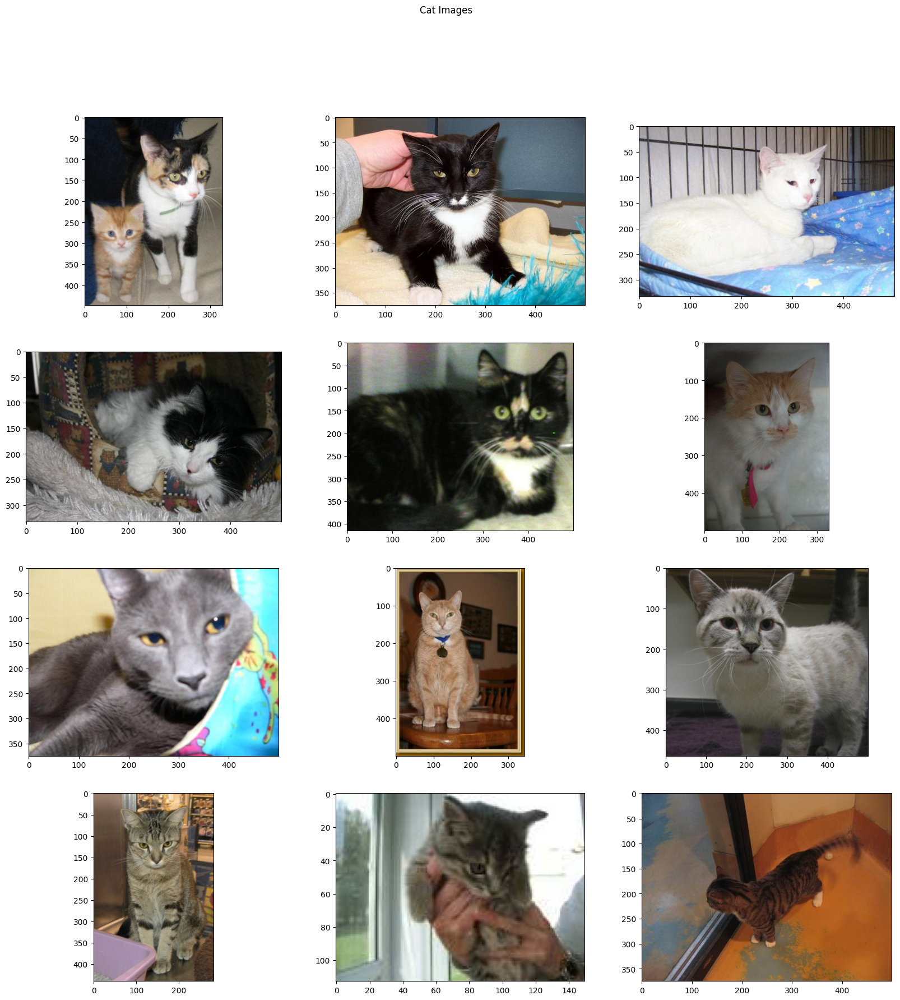

In [37]:
plt.figure(figsize=(20,20))
for i, img in enumerate(np.random.choice(os.listdir("PetImages/Cat"),12)):
    plt.subplot(4,3,i+1)
    plt.imshow(plt.imread("PetImages/Cat/"+img))
plt.suptitle("Cat Images")
plt.show()

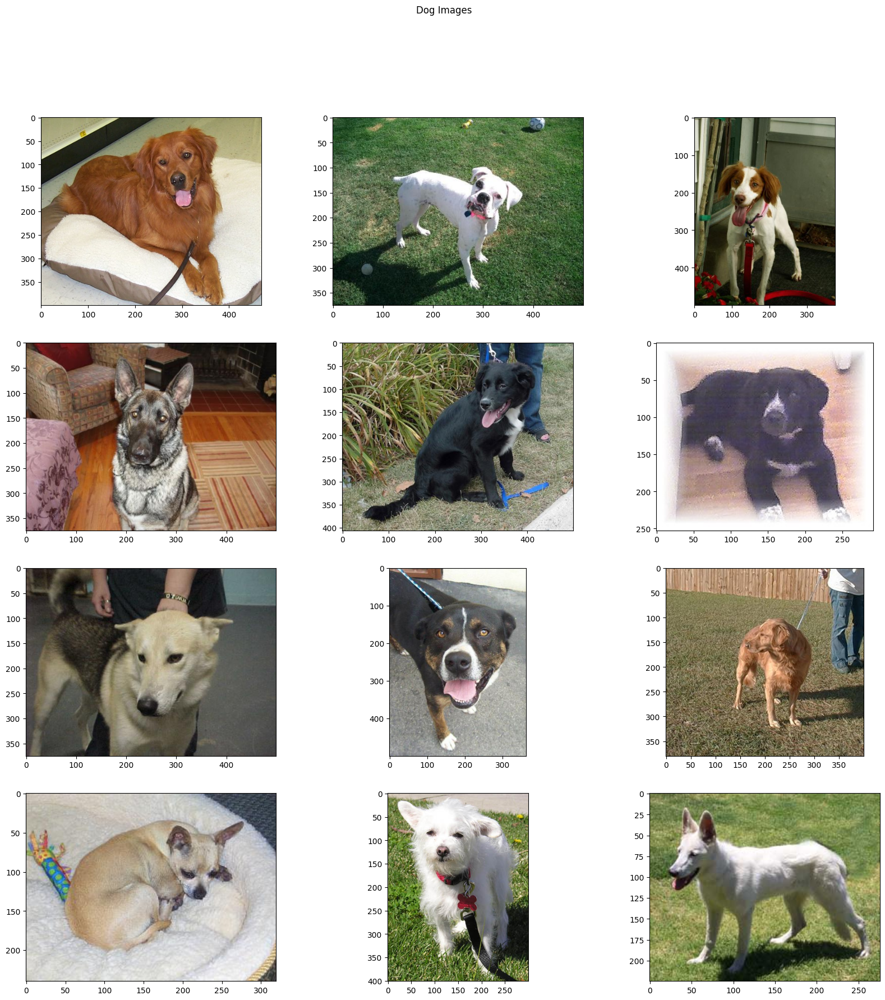

In [38]:
plt.figure(figsize=(20,20))
for i, img in enumerate(np.random.choice(os.listdir("PetImages/Dog"),12)):
    plt.subplot(4,3,i+1)
    plt.imshow(plt.imread("PetImages/Dog/"+img))
plt.suptitle("Dog Images")
plt.show()

## Loading the Data

In [18]:
## For Loading Images
from tensorflow.keras.utils import image_dataset_from_directory
# For Image Augmentation
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomBrightness, RandomZoom, RandomContrast, RandomCrop
from tensorflow.keras.layers import RandomTranslation, Resizing,Rescaling 
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [40]:
batch_size = 32
img_height = 100
img_width = 100
data_dir = 'PetImages'
SEED  =78

In [41]:
## Checking All files are valid images
invalid_cat = []
invalid_dog = []
for img in os.listdir("PetImages/Cat"):
    image_string = tf.io.read_file("PetImages/Cat/"+img)
    try:
        # Decode the image file
        if img.lower().endswith('jpg'):
            image = tf.image.decode_jpeg(image_string, channels=3)
        elif img.lower().endswith('png'):
            image = tf.image.decode_png(image_string, channels=3)
    except tf.errors.InvalidArgumentError as e:
        invalid_cat.append(img)
for img in os.listdir("PetImages/Dog"):
    image_string = tf.io.read_file("PetImages/Dog/"+img)
    try:
        # Decode the image file
        if img.lower().endswith('jpg'):
            image = tf.image.decode_jpeg(image_string, channels=3)
        elif img.lower().endswith('png'):
            image = tf.image.decode_png(image_string, channels=3)
    except tf.errors.InvalidArgumentError as e:
        invalid_dog.append(img)

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9
Corrupt JPEG data: 239 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9
Corrupt JPEG data: 252 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 228 extraneous bytes before marker 0xd9
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


In [42]:
for cat in invalid_cat:
    os.remove("PetImages/Cat/"+cat)
for dog in invalid_dog:
    os.remove("PetImages/Dog/"+dog)

In [43]:
train_cd = image_dataset_from_directory(data_dir, 
                                       validation_split = 0.2,
                                       subset = 'training',
                                        seed = SEED,
                                        image_size=(img_height, img_width),
                                        batch_size = batch_size
                                       )

Found 24824 files belonging to 2 classes.
Using 19860 files for training.


In [44]:
test_cd = image_dataset_from_directory(data_dir, 
                                       validation_split = 0.2,
                                       subset = 'validation',
                                        seed = SEED,
                                        image_size=(img_height, img_width),
                                        batch_size = batch_size
                                       )

Found 24824 files belonging to 2 classes.
Using 4964 files for validation.


In [46]:
train_cd # Generator, will not store all images. Good for Large Data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 100, 100, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

In [45]:
train_cd.class_names

['Cat', 'Dog']

In [42]:
for img_batch, label_batch in train_cd:
    print(img_batch.shape) # Batch size, Height, Width, Color channels
    print(label_batch.shape)
    break

(32, 100, 100, 3)
(32,)


2023-07-11 01:59:11.482178: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [19860]
	 [[{{node Placeholder/_0}}]]
2023-07-11 01:59:11.482579: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [19860]
	 [[{{node Placeholder/_4}}]]


In [19]:
cd_model  = Sequential()
cd_model.add(Rescaling(1./255))
cd_model.add(Conv2D(15, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu'))
cd_model.add(MaxPooling2D(pool_size=(2,2)))
cd_model.add(Conv2D(10, kernel_size=(3,3), strides = (1,1), padding='same', activation='relu'))
cd_model.add(MaxPooling2D(pool_size=(2,2)))
cd_model.add(Conv2D(6, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))
cd_model.add(MaxPooling2D(pool_size=(2,2)))
cd_model.add(Flatten())
cd_model.add(Dense(100, activation='relu'))
cd_model.add(Dense(50, activation='relu'))
cd_model.add(Dense(10, activation='relu'))
cd_model.add(Dense(1, activation='sigmoid'))
cd_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [49]:
cd_model.fit(train_cd,validation_data=test_cd,epochs=10)

Epoch 1/10


2023-07-11 07:14:54.473812: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [19860]
	 [[{{node Placeholder/_4}}]]
2023-07-11 07:14:54.474231: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [19860]
	 [[{{node Placeholder/_4}}]]


 73/621 [==>...........................] - ETA: 3s - loss: 0.6931 - accuracy: 0.5103

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.6887 - accuracy: 0.5371

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.6877 - accuracy: 0.5427

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.6793 - accuracy: 0.5661

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.6694 - accuracy: 0.5863

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.6642 - accuracy: 0.5950

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


621/621 [==============================] - ETA: 0s - loss: 0.6593 - accuracy: 0.6029

2023-07-11 07:15:01.993493: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [4964]
	 [[{{node Placeholder/_4}}]]
2023-07-11 07:15:01.993901: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [4964]
	 [[{{node Placeholder/_0}}]]
Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 8s 8ms/step - loss: 0.6593 - accuracy: 0.6029 - val_loss: 0.6012 - val_accuracy: 0.6815
Epoch 2/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.5928 - accuracy: 0.6742

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.5935 - accuracy: 0.6826

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.5943 - accuracy: 0.6847

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.5928 - accuracy: 0.6853

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.5840 - accuracy: 0.6924

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.5851 - accuracy: 0.6901

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


618/621 [============================>.] - ETA: 0s - loss: 0.5818 - accuracy: 0.6934

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.5818 - accuracy: 0.6933 - val_loss: 0.5732 - val_accuracy: 0.7055
Epoch 3/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.5349 - accuracy: 0.7277

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.5278 - accuracy: 0.7358

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.5295 - accuracy: 0.7352

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.5268 - accuracy: 0.7374

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.5247 - accuracy: 0.7378

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.5235 - accuracy: 0.7395

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


618/621 [============================>.] - ETA: 0s - loss: 0.5218 - accuracy: 0.7406

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 8ms/step - loss: 0.5217 - accuracy: 0.7407 - val_loss: 0.5437 - val_accuracy: 0.7268
Epoch 4/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.4846 - accuracy: 0.7633

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.4719 - accuracy: 0.7725

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.4757 - accuracy: 0.7685

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.4776 - accuracy: 0.7676

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.4730 - accuracy: 0.7705

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.4716 - accuracy: 0.7722

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


618/621 [============================>.] - ETA: 0s - loss: 0.4684 - accuracy: 0.7739

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 8ms/step - loss: 0.4687 - accuracy: 0.7738 - val_loss: 0.5360 - val_accuracy: 0.7399
Epoch 5/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.4399 - accuracy: 0.7945

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.4308 - accuracy: 0.8008

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.4289 - accuracy: 0.8028

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.4276 - accuracy: 0.8014

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.4204 - accuracy: 0.8061

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.4159 - accuracy: 0.8083

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


619/621 [============================>.] - ETA: 0s - loss: 0.4120 - accuracy: 0.8109

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.4120 - accuracy: 0.8109 - val_loss: 0.5700 - val_accuracy: 0.7548
Epoch 6/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.3791 - accuracy: 0.8313

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.3668 - accuracy: 0.8408

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.3652 - accuracy: 0.8412

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.3660 - accuracy: 0.8387

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.3554 - accuracy: 0.8445

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.3499 - accuracy: 0.8473

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


619/621 [============================>.] - ETA: 0s - loss: 0.3462 - accuracy: 0.8492

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.3461 - accuracy: 0.8492 - val_loss: 0.6436 - val_accuracy: 0.7413
Epoch 7/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.3285 - accuracy: 0.8652

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.3034 - accuracy: 0.8765

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.3046 - accuracy: 0.8749

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.2991 - accuracy: 0.8749

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.2880 - accuracy: 0.8795

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.2781 - accuracy: 0.8836

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


618/621 [============================>.] - ETA: 0s - loss: 0.2756 - accuracy: 0.8847

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.2761 - accuracy: 0.8844 - val_loss: 0.7731 - val_accuracy: 0.7276
Epoch 8/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.2946 - accuracy: 0.8793

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.2562 - accuracy: 0.8967

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.2528 - accuracy: 0.8990

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.2428 - accuracy: 0.9021

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.2292 - accuracy: 0.9079

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.2188 - accuracy: 0.9124

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


619/621 [============================>.] - ETA: 0s - loss: 0.2149 - accuracy: 0.9140

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.2148 - accuracy: 0.9140 - val_loss: 0.8802 - val_accuracy: 0.7305
Epoch 9/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.2226 - accuracy: 0.9092

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.1985 - accuracy: 0.9207

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.1948 - accuracy: 0.9223

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.1869 - accuracy: 0.9266

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.1772 - accuracy: 0.9316

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.1737 - accuracy: 0.9331

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


619/621 [============================>.] - ETA: 0s - loss: 0.1723 - accuracy: 0.9338

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.1724 - accuracy: 0.9337 - val_loss: 1.0148 - val_accuracy: 0.7345
Epoch 10/10
 73/621 [==>...........................] - ETA: 3s - loss: 0.1624 - accuracy: 0.9349

Corrupt JPEG data: 228 extraneous bytes before marker 0xd9


193/621 [========>.....................] - ETA: 2s - loss: 0.1534 - accuracy: 0.9399

Corrupt JPEG data: 2226 extraneous bytes before marker 0xd9
Corrupt JPEG data: 99 extraneous bytes before marker 0xd9


233/621 [==========>...................] - ETA: 2s - loss: 0.1494 - accuracy: 0.9425

Corrupt JPEG data: 252 extraneous bytes before marker 0xd9


345/621 [===============>..............] - ETA: 1s - loss: 0.1524 - accuracy: 0.9405

Corrupt JPEG data: 1153 extraneous bytes before marker 0xd9


481/621 [======================>.......] - ETA: 0s - loss: 0.1422 - accuracy: 0.9455

Corrupt JPEG data: 65 extraneous bytes before marker 0xd9
Corrupt JPEG data: 214 extraneous bytes before marker 0xd9


561/621 [==========================>...] - ETA: 0s - loss: 0.1368 - accuracy: 0.9476

Corrupt JPEG data: 239 extraneous bytes before marker 0xd9


619/621 [============================>.] - ETA: 0s - loss: 0.1371 - accuracy: 0.9470

Corrupt JPEG data: 396 extraneous bytes before marker 0xd9
Corrupt JPEG data: 128 extraneous bytes before marker 0xd9
Corrupt JPEG data: 1403 extraneous bytes before marker 0xd9
Corrupt JPEG data: 162 extraneous bytes before marker 0xd9


621/621 [==============================] - 5s 7ms/step - loss: 0.1369 - accuracy: 0.9471 - val_loss: 1.1871 - val_accuracy: 0.7194


In [51]:
cd_model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 100, 100, 3)       0         
                                                                 
 conv2d_5 (Conv2D)           (None, 100, 100, 15)      1140      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 50, 50, 15)       0         
 2D)                                                             
                                                                 
 conv2d_6 (Conv2D)           (None, 50, 50, 10)        1360      
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 25, 25, 10)       0         
 2D)                                                             
                                                                 
 conv2d_7 (Conv2D)           (None, 23, 23, 6)        

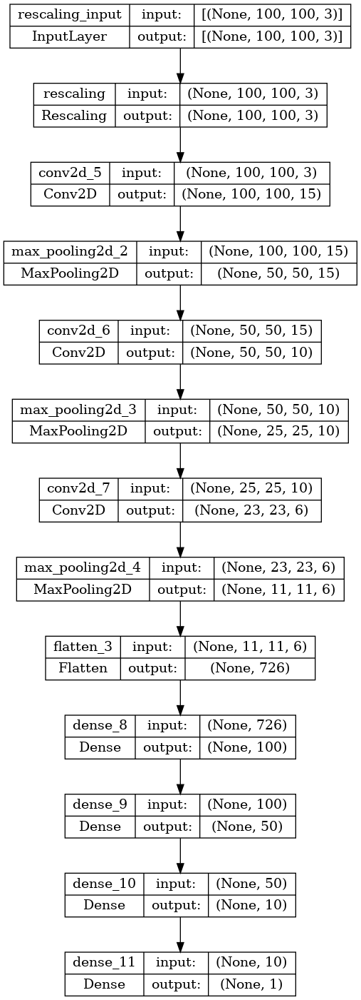

In [52]:
plot_model(cd_model, show_shapes=True)

## Image Augmentation

In [53]:
train_cd_au = ImageDataGenerator(rotation_range=np.random.randint(30,80),
                                shear_range = np.random.randint(10,20),
                                horizontal_flip=True,
                                validation_split=0.2,
                                rescale = 1./255.)

In [54]:
test_cd_au = ImageDataGenerator(validation_split=0.2, rescale = 1./255.)

In [55]:
train_cd_au_gen = train_cd_au.flow_from_directory(data_dir, 
                                subset = 'training',
                                seed = SEED,
                                target_size=(img_height, img_width),
                                batch_size = batch_size,
                               class_mode = 'binary')

Found 19860 images belonging to 2 classes.


In [56]:
test_cd_au_gen = test_cd_au.flow_from_directory(data_dir, 
                                subset = 'validation',
                                seed = SEED,
                                target_size=(img_height, img_width),
                                batch_size = batch_size,
                              class_mode = 'binary')

Found 4964 images belonging to 2 classes.


In [57]:
train_cd_au_gen.class_indices

{'Cat': 0, 'Dog': 1}

In [58]:
first_batch = train_cd_au_gen.next()

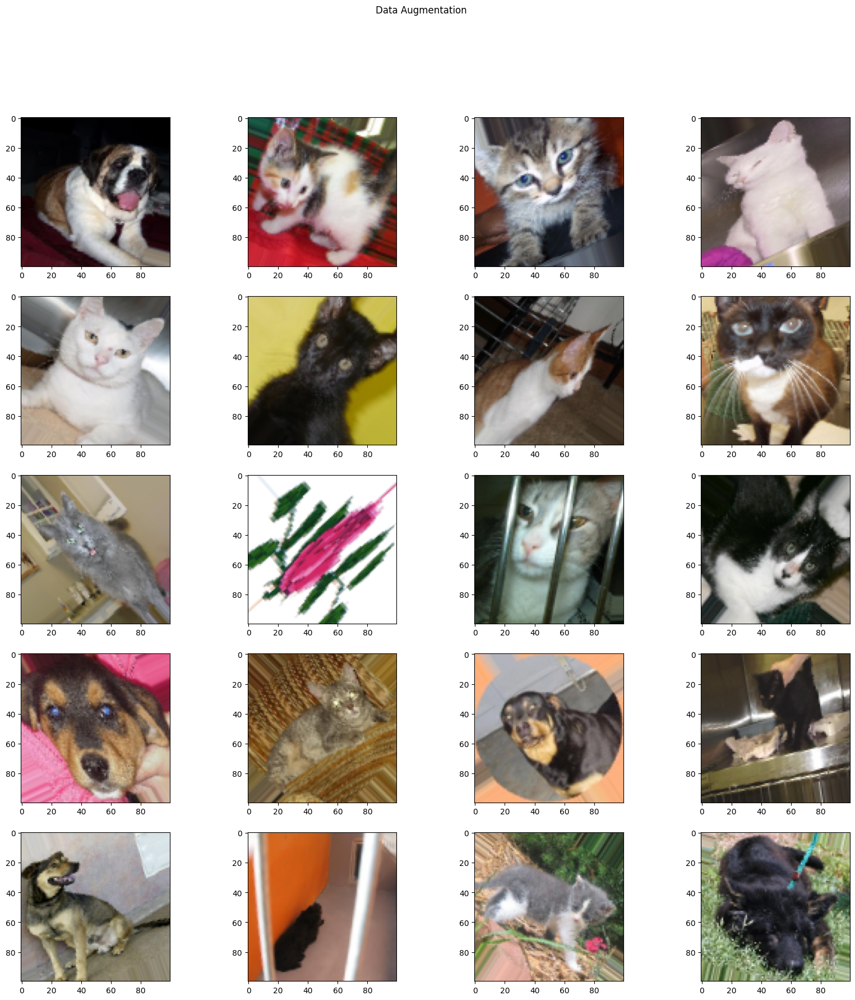

In [59]:
plt.figure(figsize=(20,20))
for i,img in enumerate(first_batch[0]):
    plt.subplot(5,4,i+1)
    plt.imshow(first_batch[0][i])
    if i>18:
        break
plt.suptitle("Data Augmentation")
plt.show()

In [60]:
cda_model  = Sequential()
cda_model.add(Conv2D(64, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu'))
cda_model.add(MaxPooling2D(pool_size=(2,2)))
cda_model.add(Conv2D(16, kernel_size=(3,3), strides = (1,1), padding='same', activation='relu'))
cda_model.add(MaxPooling2D(pool_size=(2,2)))
cda_model.add(Conv2D(10, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))
cda_model.add(MaxPooling2D(pool_size=(2,2)))
cda_model.add(Flatten())
cda_model.add(Dense(250, activation='relu'))
cda_model.add(Dense(75, activation='elu'))
cda_model.add(Dense(10, activation='relu'))
cda_model.add(Dense(1, activation='sigmoid'))
cda_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [61]:
cda_model.fit(train_cd_au_gen, epochs=3, validation_data=test_cd_au_gen)

Epoch 1/3


2023-07-11 07:43:53.900049: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


621/621 [==============================] - ETA: 0s - loss: 0.6932 - accuracy: 0.4957

2023-07-11 07:45:08.100871: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


621/621 [==============================] - 82s 126ms/step - loss: 0.6932 - accuracy: 0.4957 - val_loss: 0.6931 - val_accuracy: 0.5006
Epoch 2/3
621/621 [==============================] - 77s 124ms/step - loss: 0.6932 - accuracy: 0.4956 - val_loss: 0.6931 - val_accuracy: 0.5006
Epoch 3/3
621/621 [==============================] - 77s 124ms/step - loss: 0.6932 - accuracy: 0.4959 - val_loss: 0.6931 - val_accuracy: 0.5006


In [62]:
cda_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, None, None, 64)    4864      
                                                                 
 max_pooling2d_5 (MaxPooling  (None, None, None, 64)   0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, None, None, 16)    9232      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, None, None, 16)   0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, None, None, 10)    1450      
                                                                 
 max_pooling2d_7 (MaxPooling  (None, None, None, 10)  

In [125]:
cda_model.evaluate(test_cd_au_gen)

  3/156 [..............................] - ETA: 7s - loss: 0.5812 - accuracy: 0.6875 

2023-07-11 02:46:29.966877: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


156/156 [==============================] - 7s 46ms/step - loss: 0.5524 - accuracy: 0.7109


[0.5523542761802673, 0.7109186053276062]

In [126]:
cda_model.predict(test_cd_au_gen)

  1/156 [..............................] - ETA: 30s

2023-07-11 02:46:54.106142: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


156/156 [==============================] - 7s 47ms/step


array([[0.63976437],
       [0.7849202 ],
       [0.63503945],
       ...,
       [0.49443075],
       [0.9079321 ],
       [0.18256035]], dtype=float32)

In [127]:
train_cd_au_gen.class_indices

{'Cat': 0, 'Dog': 1}

# FaceMask Detection

In [63]:
os.listdir("Face Mask Dataset")

['Test', 'Train', 'Validation']

In [64]:
os.listdir("Face Mask Dataset/Train")

['WithMask', 'WithoutMask']

In [65]:
train_mask = image_dataset_from_directory("Face Mask Dataset/Train", 
                                        seed = SEED,
                                        image_size=(img_height, img_width),
                                        batch_size = batch_size
                                       )

Found 10000 files belonging to 2 classes.


In [71]:
test_mask = image_dataset_from_directory("Face Mask Dataset/Test", 
                                        seed = SEED,
                                        image_size=(img_height, img_width),
                                        batch_size = batch_size
                                       )

Found 992 files belonging to 2 classes.


In [72]:
validation_mask = image_dataset_from_directory("Face Mask Dataset/Validation", 
                                        seed = SEED,
                                        image_size=(img_height, img_width),
                                        batch_size = batch_size
                                       )

Found 800 files belonging to 2 classes.


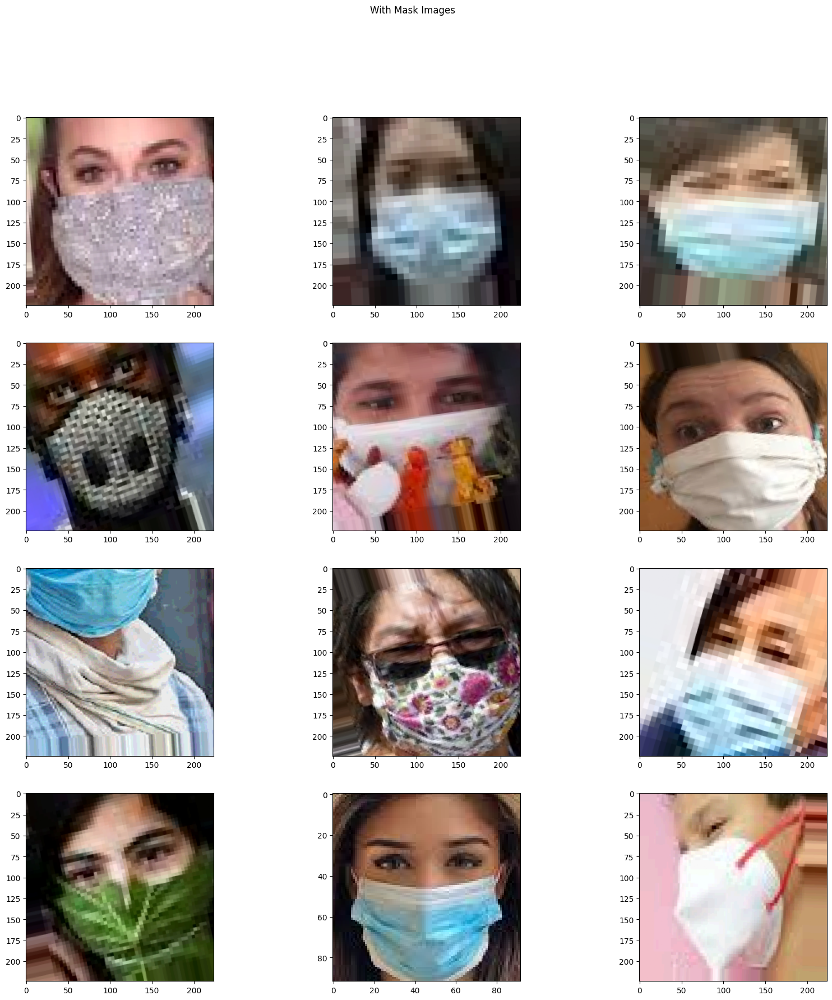

In [67]:
plt.figure(figsize=(20,20))
for i, img in enumerate(np.random.choice(os.listdir("Face Mask Dataset/Train/WithMask"),12)):
    plt.subplot(4,3,i+1)
    plt.imshow(plt.imread("Face Mask Dataset/Train/WithMask/"+img))
plt.suptitle("With Mask Images")
plt.show()

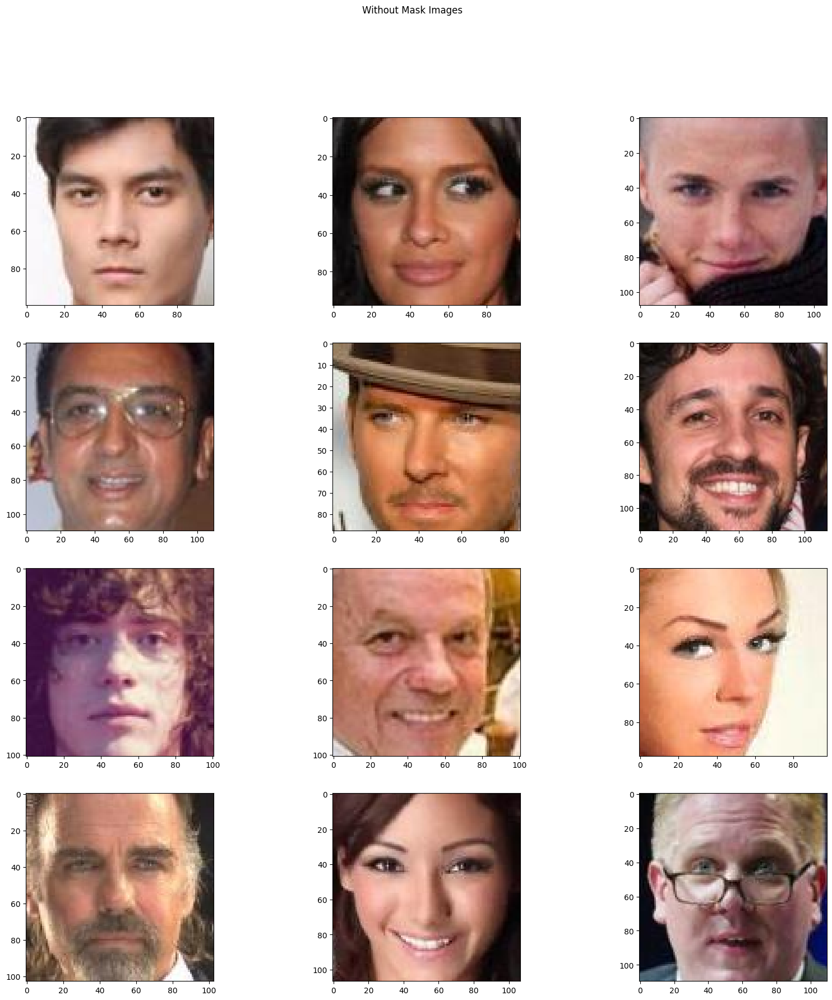

In [68]:
plt.figure(figsize=(20,20))
for i, img in enumerate(np.random.choice(os.listdir("Face Mask Dataset/Train/WithoutMask"),12)):
    plt.subplot(4,3,i+1)
    plt.imshow(plt.imread("Face Mask Dataset/Train/WithoutMask/"+img))
plt.suptitle("Without Mask Images")
plt.show()

In [69]:
mask_model  = Sequential()
mask_model.add(Conv2D(64, kernel_size=(5,5), strides=(1,1), padding='same', activation='relu'))
mask_model.add(MaxPooling2D(pool_size=(2,2)))
mask_model.add(Conv2D(16, kernel_size=(3,3), strides = (1,1), padding='same', activation='relu'))
mask_model.add(MaxPooling2D(pool_size=(2,2)))
mask_model.add(Conv2D(10, kernel_size=(3,3), strides=(1,1), padding='valid', activation='relu'))
mask_model.add(MaxPooling2D(pool_size=(2,2)))
mask_model.add(Flatten())
mask_model.add(Dense(250, activation='relu'))
mask_model.add(Dense(75, activation='elu'))
mask_model.add(Dense(10, activation='relu'))
mask_model.add(Dense(1, activation='sigmoid'))
mask_model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [74]:
mask_model.fit(train_mask, epochs=3, validation_data=validation_mask)

Epoch 1/3
313/313 [==============================] - 2s 7ms/step - loss: 0.0786 - accuracy: 0.9730 - val_loss: 0.1147 - val_accuracy: 0.9488
Epoch 2/3
  1/313 [..............................] - ETA: 14s - loss: 0.0483 - accuracy: 0.9688

2023-07-11 07:54:05.148094: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [800]
	 [[{{node Placeholder/_4}}]]
2023-07-11 07:54:05.148492: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [800]
	 [[{{node Placeholder/_0}}]]


313/313 [==============================] - 2s 7ms/step - loss: 0.0773 - accuracy: 0.9708 - val_loss: 0.0583 - val_accuracy: 0.9775
Epoch 3/3
313/313 [==============================] - 2s 7ms/step - loss: 0.0365 - accuracy: 0.9861 - val_loss: 0.0351 - val_accuracy: 0.9862


In [75]:
mask_model.evaluate(test_mask)

31/31 [==============================] - 0s 4ms/step - loss: 0.0714 - accuracy: 0.9788


2023-07-11 07:54:41.559299: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype string and shape [992]
	 [[{{node Placeholder/_0}}]]
2023-07-11 07:54:41.559701: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_4' with dtype int32 and shape [992]
	 [[{{node Placeholder/_4}}]]


[0.07140922546386719, 0.9788306355476379]

In [77]:
train_mask.class_names

['WithMask', 'WithoutMask']

## Pre Trained Models

In [2]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2L
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.imagenet_utils import decode_predictions, preprocess_input

from tensorflow.keras.preprocessing import image

In [3]:
dog_img = 'PetImages/Dog/1000.jpg'
dog_img1 = 'PetImages/Dog/10003.jpg'

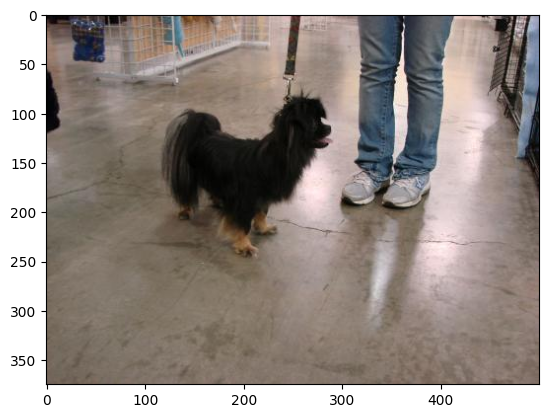

In [4]:
plt.imshow(plt.imread(dog_img))
plt.show()

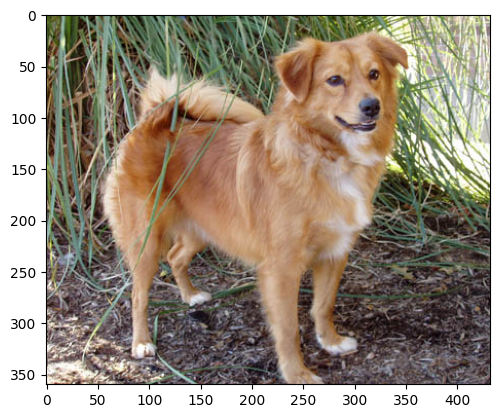

In [5]:
plt.imshow(plt.imread(dog_img1))
plt.show()

In [6]:
vgg16 = VGG16()

2023-07-12 07:12:16.709823: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-12 07:12:16.710236: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-07-12 07:12:16.710587: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysf

In [7]:
vgg16.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

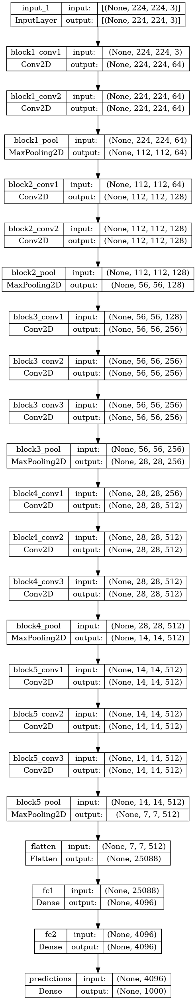

In [8]:
plot_model(vgg16, show_shapes=True)

In [9]:
vgg16.input

<KerasTensor: shape=(None, 224, 224, 3) dtype=float32 (created by layer 'input_1')>

In [10]:
vgg16.input.shape

TensorShape([None, 224, 224, 3])

In [11]:
tuple(vgg16.input.shape[1:3])

(224, 224)

In [20]:
def load_process(img_path, model):
    img_loaded = image.load_img(img_path, target_size=tuple(model.input.shape[1:3]))
    img_loaded = np.expand_dims(img_loaded, axis=0)
    img_loaded = preprocess_input(img_loaded)
    return img_loaded

In [17]:
# We need to prepare the Image for Prediction using Pre Trained Model
dog1 = image.load_img(dog_img, target_size=tuple(vgg16.input.shape[1:3]))

In [18]:
dog1 = np.expand_dims(dog1, axis=0)

In [19]:
# Centers around zero
dog1 = preprocess_input(dog1)

In [47]:
def predict_decode(proc_img, model):
    predictions = model.predict(proc_img)
    dec_pred = decode_predictions(predictions)
    print(f"Predicted as {dec_pred[0][0][1]} with {np.around(dec_pred[0][0][2]*100,2)}% Probability")
    dec_cat = [i[1] for i in dec_pred[0]]
    dec_perc = [i[2] for i in dec_pred[0]]
    plt.bar(dec_cat, dec_perc)
    for i in range(len(dec_perc)):
        plt.text(i, np.around(dec_perc[i],2), np.around(dec_perc[i],2))
    plt.title("Predictions Prob")
    plt.xticks(rotation=30)
    plt.show()

In [21]:
# Predict the Output
prediction = vgg16.predict(dog1)

2023-07-12 07:17:58.133449: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8700


1/1 [==============================] - 6s 6s/step


In [24]:
d = decode_predictions(prediction)

In [34]:
np.around(d[0][0][2],2)

0.27

1/1 [==============================] - 0s 26ms/step
Predicted as briard with 27.12% Probability


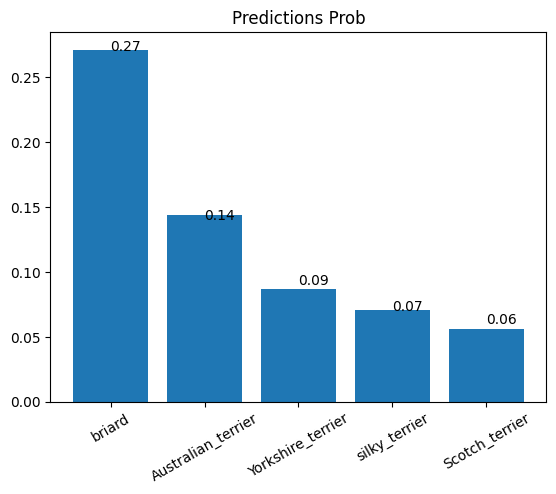

In [48]:
predict_decode(dog1, vgg16)

1/1 [==============================] - 0s 26ms/step
Predicted as golden_retriever with 49.08% Probability


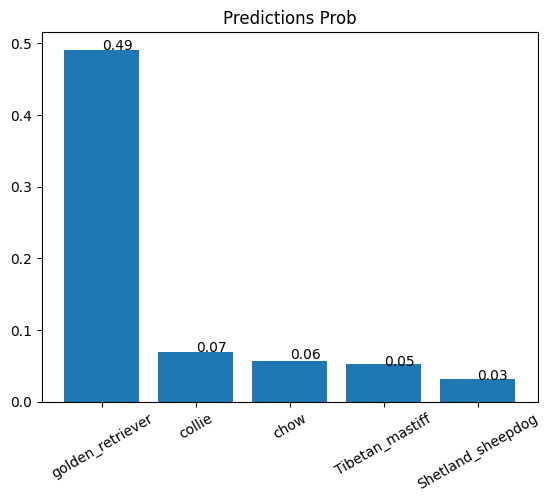

In [49]:
dog2 = load_process(dog_img1, vgg16)
predict_decode(dog2, vgg16)

1/1 [==============================] - 1s 1s/step
Predicted as golden_retriever with 78.86% Probability


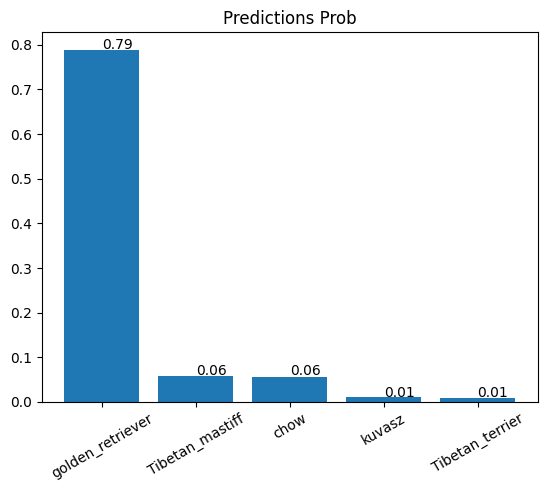

In [50]:
resnet = ResNet50()
dog2 = load_process(dog_img1, resnet)
predict_decode(dog2, resnet)

1/1 [==============================] - 0s 32ms/step
Predicted as affenpinscher with 26.68% Probability


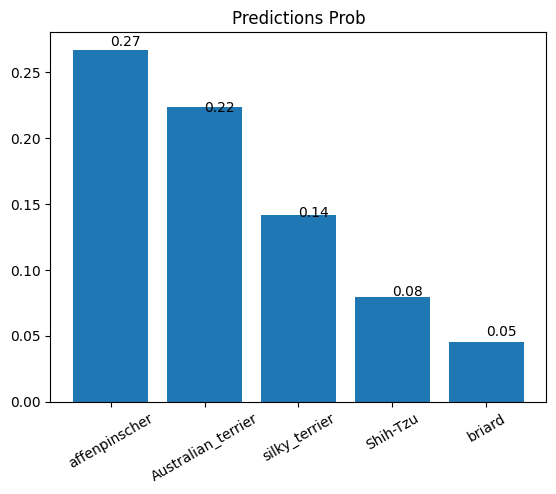

In [51]:
dog1 = load_process(dog_img, resnet)
predict_decode(dog1, resnet)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


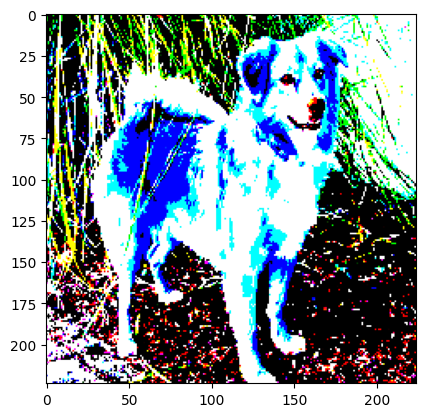

In [53]:
plt.imshow(np.squeeze(dog2))